## Import

In [2]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.neural_network import MLPRegressor

In [3]:
from ML.utils.utils import *
from ML.utils.Data_preparator import Data_preparator
from ML.utils.Model_evaluator import Model_evaluator
from physics.Iso_data_handler import Iso_data_handler
from physics.Data_visualiser import Data_visualiser

In [4]:
pre_path = "../../../../../../../"
physical_model = "PARSEC"
path_to_data = pre_path + "data/PARSEC/"
path_to_results = pre_path + "results/model_B/default_models/"
path_to_predictions = pre_path + "predictions/model_B/default_models/"
tag = "scale_standard"
output_parameters = ['T_eff', 'log_g', 'radius']
categories_name = ["label"]

In [5]:
override = True
use_preds = False
save = True
show = True
scaler_name = "standard"

## Data preparation

This notebook contains the results of the model which are trained using all the data from MIST and filtered on the phases

Reading PARSEC dataframe from PARSEC_rescaled_iso_full_data.csv file...


,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.00000,3.4744,2.965,0.0,-0.25,0.090,0.213783
1,5.00000,3.4752,2.963,0.0,-0.25,0.092,0.219060
2,5.00000,3.4780,2.956,0.0,-0.25,0.098,0.236789
3,5.00000,3.4789,2.954,0.0,-0.25,0.100,0.242293
4,5.00000,3.4819,2.950,0.0,-0.25,0.106,0.257918
...,...,...,...,...,...,...,...
681298,10.25002,3.4812,0.032,7.0,0.50,0.801,2.156549
681299,10.25002,3.4776,-0.004,7.0,0.50,0.801,2.175802
681300,10.25002,3.4742,-0.038,7.0,0.50,0.800,2.194514
681301,10.25002,3.4701,-0.077,7.0,0.50,0.800,2.215902


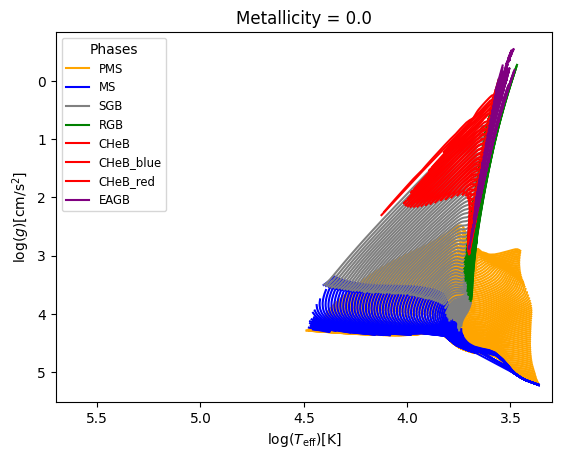

In [6]:
iso_handler = Iso_data_handler(path_to_data, 
                              ['logAge', 'logTe', 'logg', 'label', 'metallicity', 'Mass', 'Rpol'], 
                              physical_model, rescale=True)

iso_df = iso_handler.get_isochrone_dataframe()
display(iso_df)
data_visualiser = Data_visualiser(iso_df, physical_model)
data_visualiser.plot_Kiel([], [0.0])

,logAge,logTe,logg,label,metallicity,Mass,Rpol
0,5.60000,4.4269,4.356,1.0,-0.25,9.714,0.535041
1,5.65000,4.4266,4.355,1.0,-0.25,9.714,0.535800
2,5.70000,4.4263,4.353,1.0,-0.25,9.714,0.536558
3,5.75000,4.4061,4.358,1.0,-0.25,8.856,0.514282
4,5.75000,4.4260,4.352,1.0,-0.25,9.714,0.537441
...,...,...,...,...,...,...,...
321691,10.25002,3.6561,2.334,4.0,0.50,0.805,1.005181
321692,10.25002,3.6560,2.333,4.0,0.50,0.805,1.005609
321693,10.25002,3.6559,2.331,4.0,0.50,0.805,1.006466
321694,10.25002,3.6558,2.330,4.0,0.50,0.805,1.006894


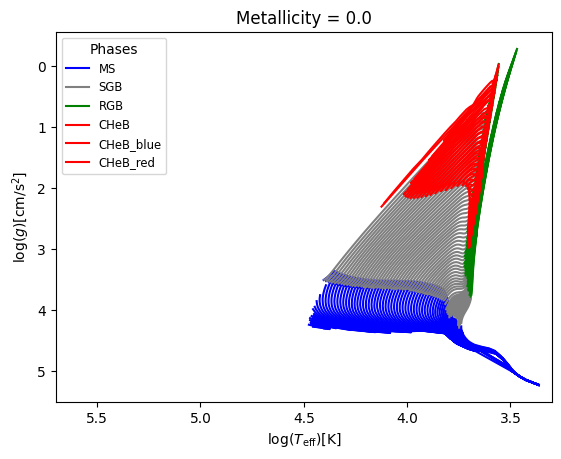

In [7]:
phase_filtered_iso_df = Data_preparator.filter_data(iso_df, {'label':[1, 2, 3, 4, 5, 6]})
display(phase_filtered_iso_df)
data_visualiser_phase_filtered = Data_visualiser(phase_filtered_iso_df, physical_model)
data_visualiser_phase_filtered.plot_Kiel([], [0.0])

In [8]:
print_all_uniques(phase_filtered_iso_df)

logAge  : Range : 5.3 - 10.25, Mean : 9.0428, Median : 9.3

logTe  : Range : 3.36 - 4.5177, Mean : 3.7779, Median : 3.721

logg  : Range : -0.38 - 5.345, Mean : 2.7607, Median : 2.486

Values in label column : 1.0, 2.0, 3.0, 4.0, 5.0, 6.0 

Values in metallicity column : -0.25, -0.5, -0.75, -1.0, -1.25, -1.5, -1.75, -2.0, -2.25, -2.5, -2.75, 0.0, 0.25, 0.5 

Mass  : Range : 0.09 - 13.952, Mean : 2.6725, Median : 1.428

Rpol  : Range : -0.98 - 2.8373, Mean : 0.9648, Median : 1.0158



In [9]:
X_train, X_ivs, y_train, y_ivs, categories_train, categories_ivs = \
    Data_preparator.split_data(phase_filtered_iso_df, x_cols=['logAge', 'metallicity', 'Mass'], 
                               y_cols=['logTe', 'logg', 'Rpol'], categories_cols=['label'], random_state=12, print_stats=True)

print(X_train.shape, X_ivs.shape)
print(y_train.shape, y_ivs.shape)

Training set statistics:
Range in train data for the logTe parameter : 3.3621 - 4.5177
Median value in train data for the logTe parameter: 3.721
Mean value in train data for the logTe parameter: 3.777965141417156

Range in train data for the logg parameter : -0.384 - 5.345
Median value in train data for the logg parameter: 2.486
Mean value in train data for the logg parameter: 2.761182341921151

Range in train data for the Rpol parameter : -0.9763360818022064 - 2.8372727025023003
Median value in train data for the Rpol parameter: 1.015778756389041
Mean value in train data for the Rpol parameter: 0.9646120024510401

Testing set statistics:
Range in test data for the logTe parameter : 3.3622 - 4.5177
Median value in test data for the logTe parameter: 3.721
Mean value in test data for the logTe parameter: 3.777738115487914

Range in test data for the logg parameter : -0.347 - 5.345
Median value in test data for the logg parameter: 2.486
Mean value in test data for the logg parameter: 2.75

## Model training

### Linear regression

In [10]:
lr_evaluator = Model_evaluator("linear_regression", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.5972935142833498
  RMSE :  0.2152050705681559
  MAE :  0.18085985421232842
  MedAE :  0.13710958116435612
  CORR :  0.8536445700543511
  MAX_ER :  0.5457108330953737
  Percentiles : 
    75th percentile :  0.25534547589330925
    90th percentile :  0.3630214922338444
    95th percentile :  0.41854661411700367
    99th percentile :  0.48298341915146864

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.24580413337093754
  RMSE :  0.1576451482232071
  MAE :  0.1257987910400327
  MedAE :  0.10439328495367928
  CORR :  0.49810122500597476
  MAX_ER :  0.5110059990754299
  Percentiles : 
    75th percentile :  0.17835655524482963
    90th percentile :  0.26213247555572533
    95th percentile :  0.3129027605895551
    99th

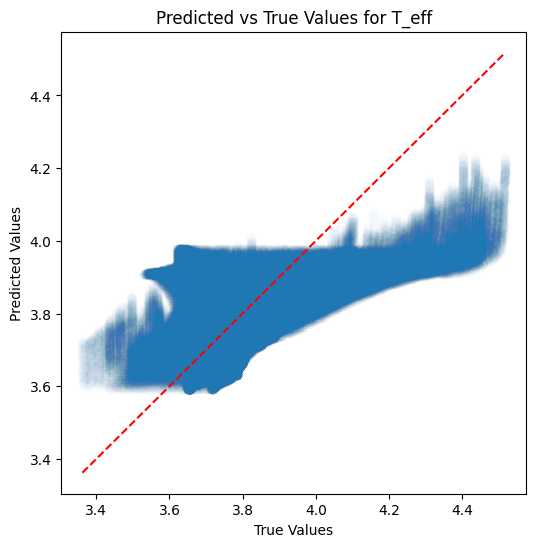

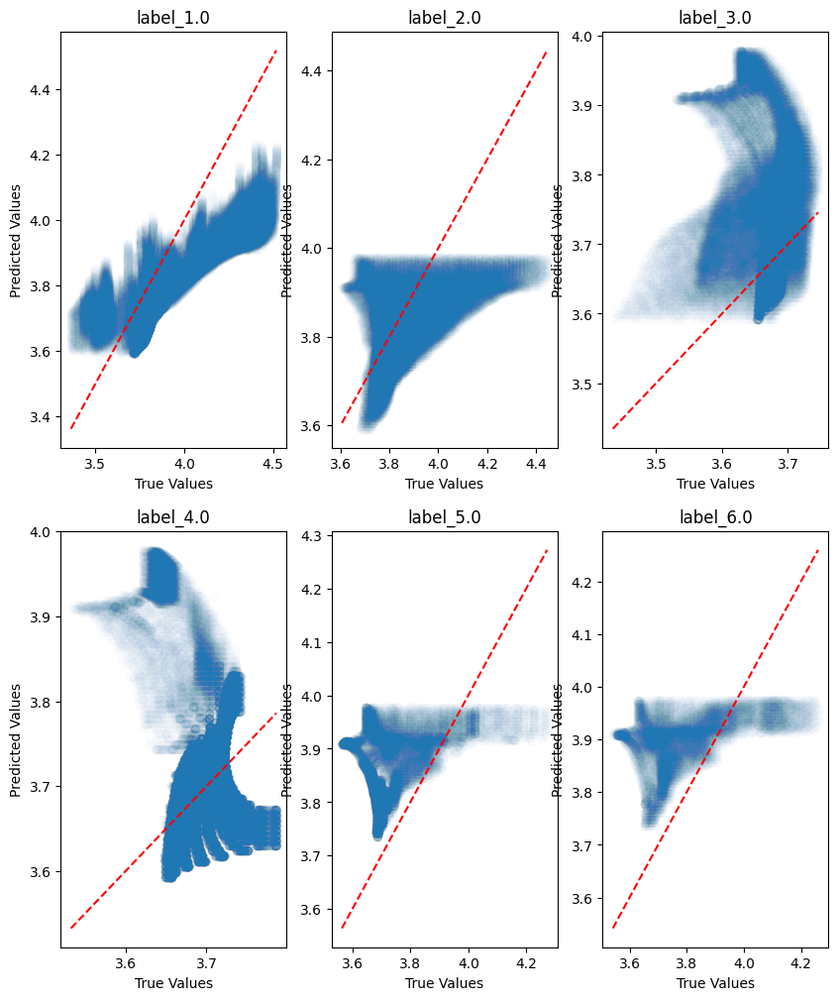

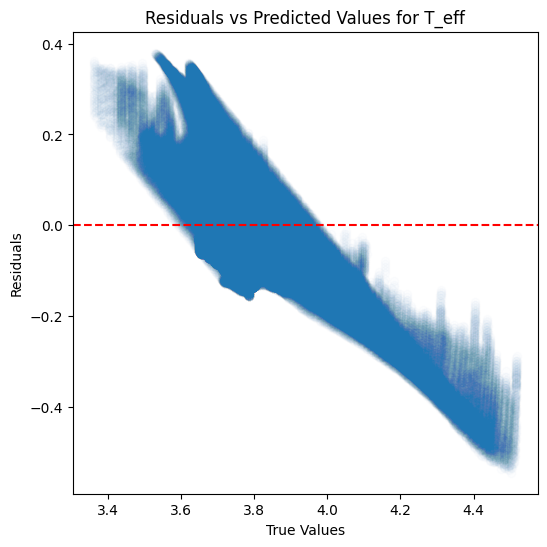

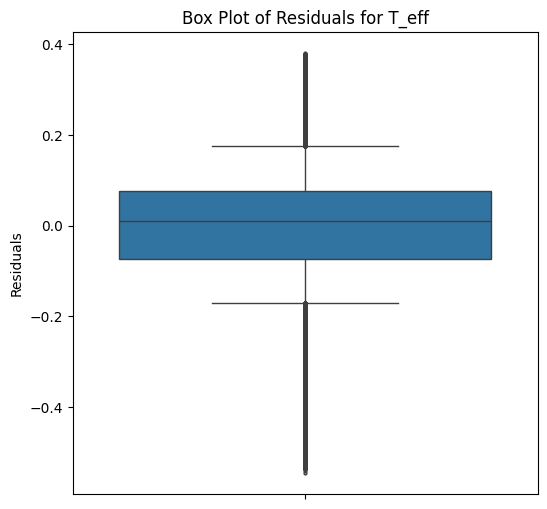

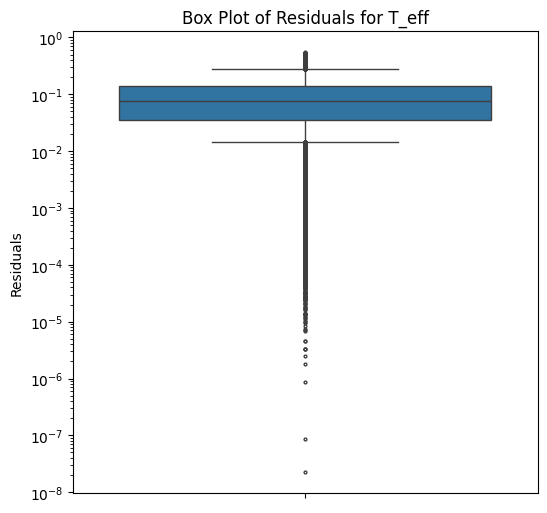

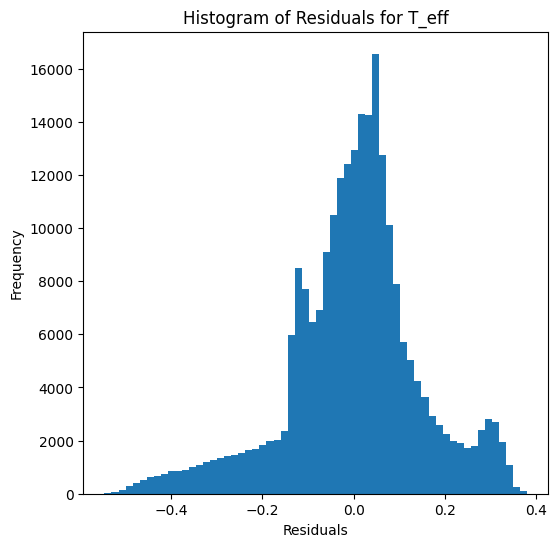

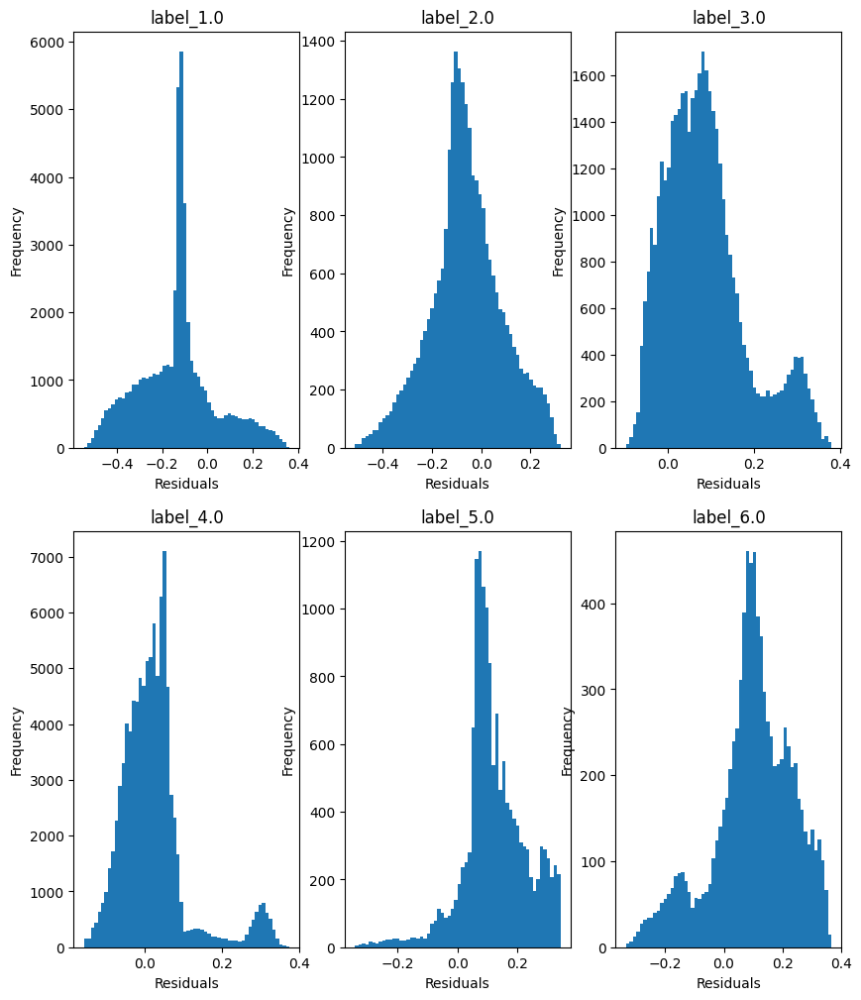

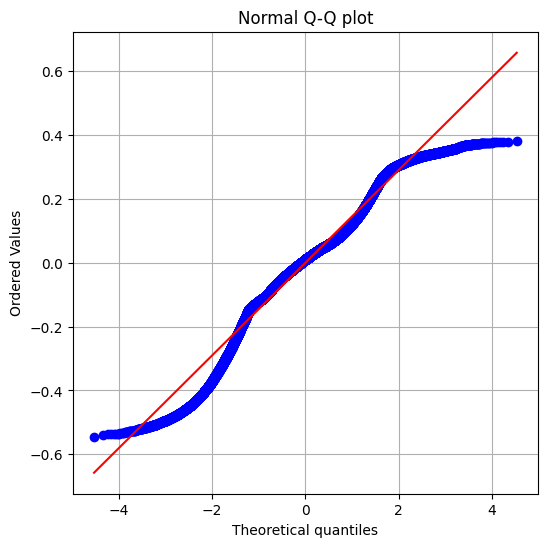

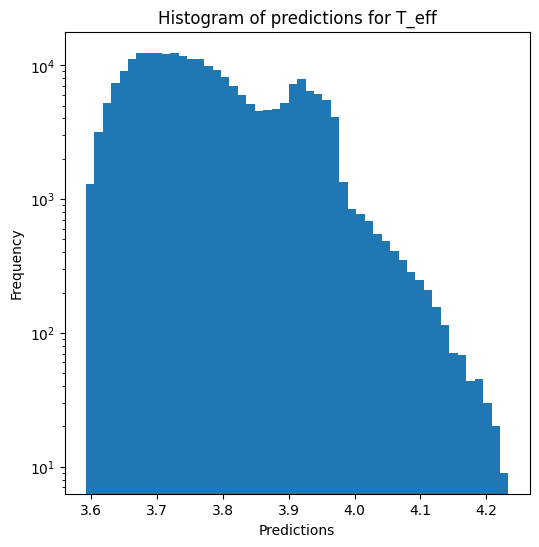

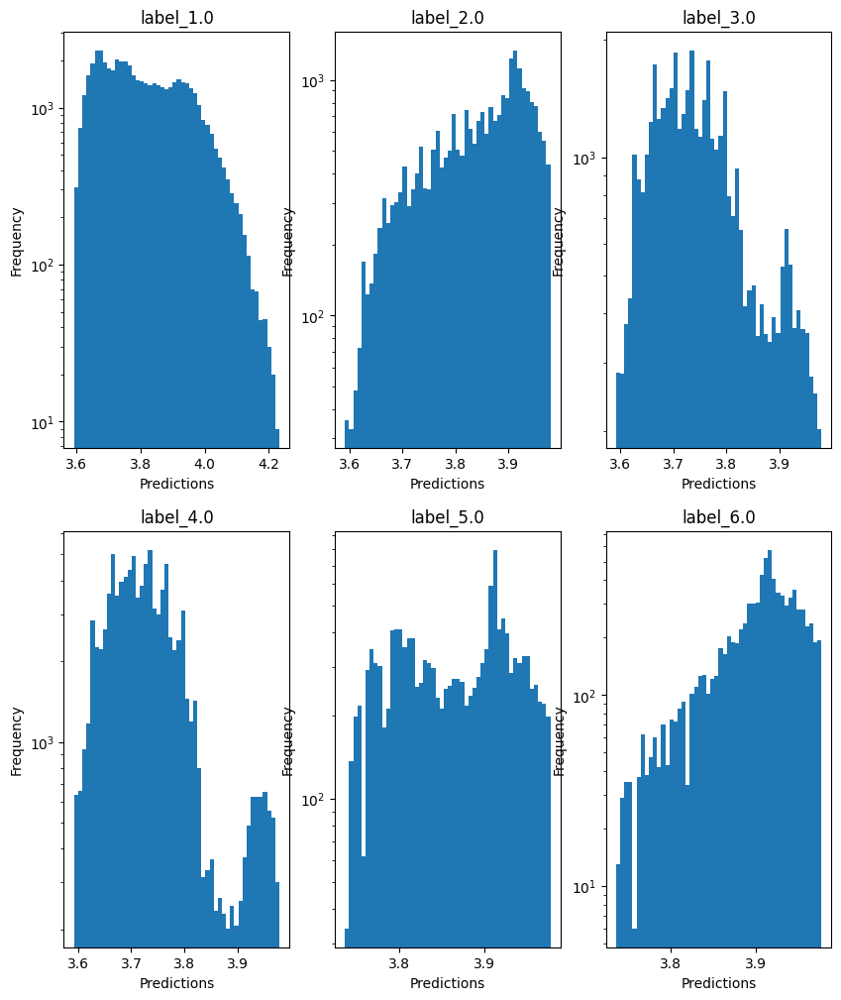

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -1.2252488306693432
  RMSE :  1.4736793628520057
  MAE :  1.3839826888369275
  MedAE :  1.3188292728886764
  CORR :  0.33703567351468466
  MAX_ER :  3.354960379232205
  Percentiles : 
    75th percentile :  1.743789821291422
    90th percentile :  2.028276739380887
    95th percentile :  2.275834504435303
    99th percentile :  2.798504185921362

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.2072914562504592
  RMSE :  0.8048821107535807
  MAE :  0.66404262555297
  MedAE :  0.6125379386596925
  CORR :  0.4931048794061357
  MAX_ER :  2.8883783643646073
  Percentiles : 
    75th percentile :  0.9395609240966036
    90th percentile :  1.240506448879205
    95th percentile :  1.477576662682949
    99th percentile :  2.098455333828418

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
 

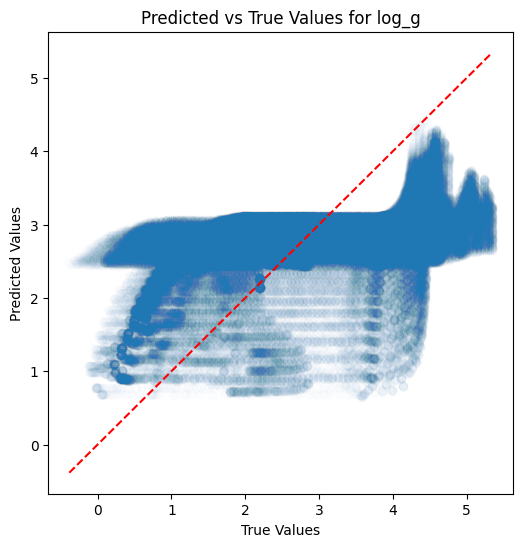

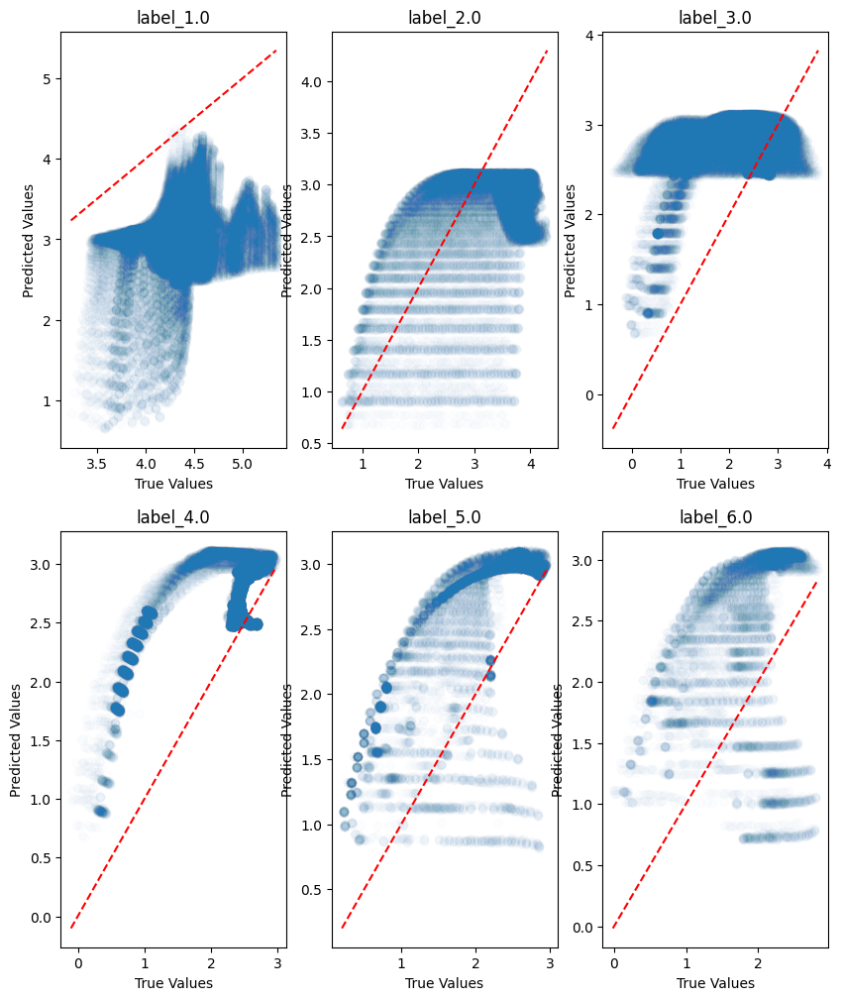

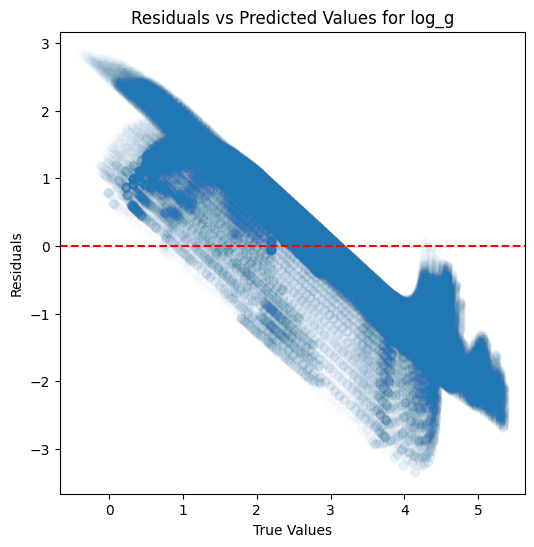

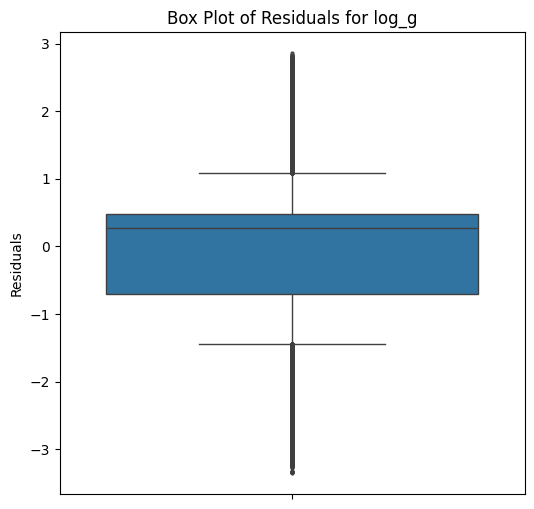

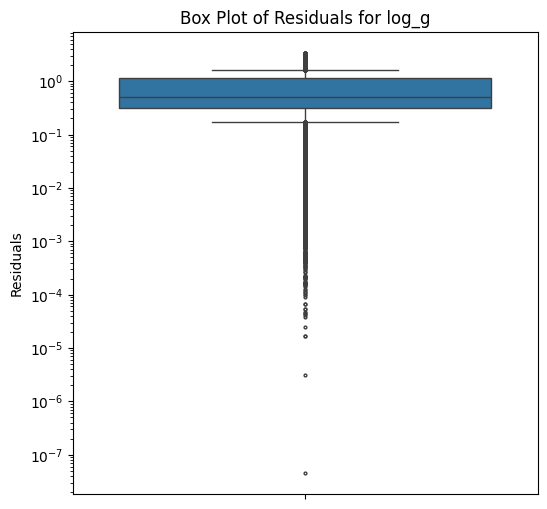

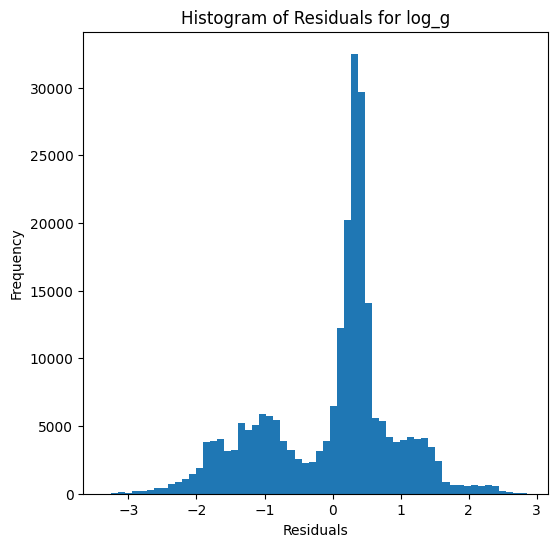

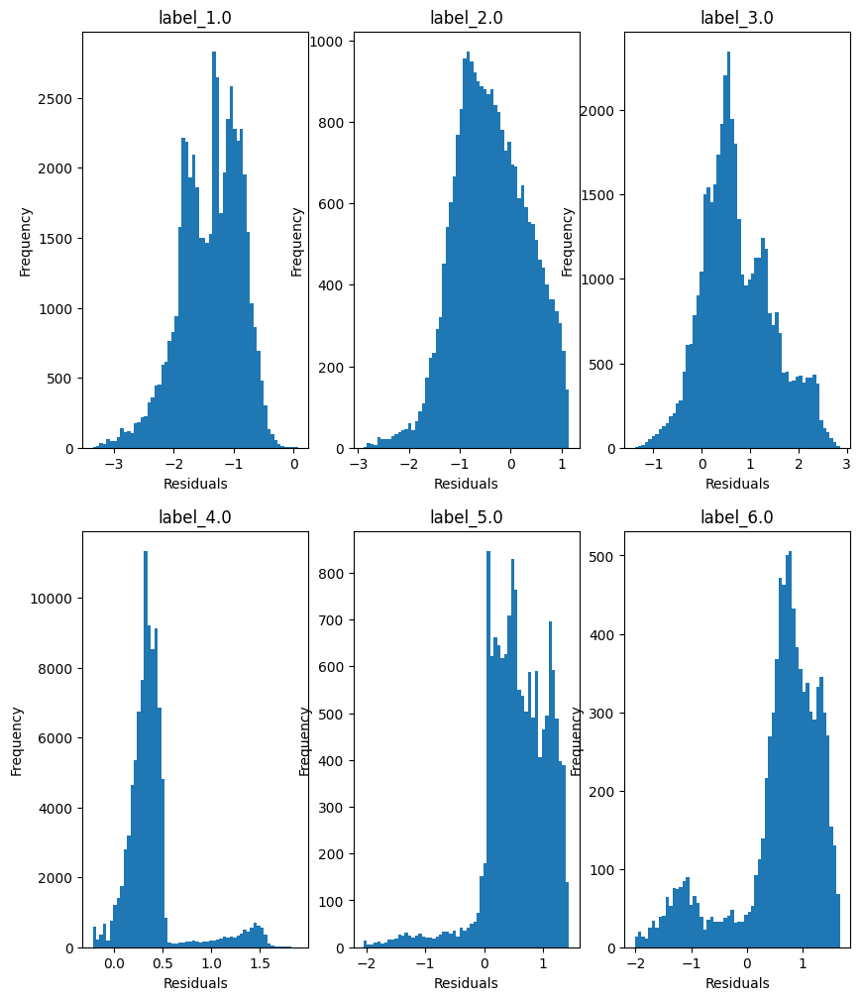

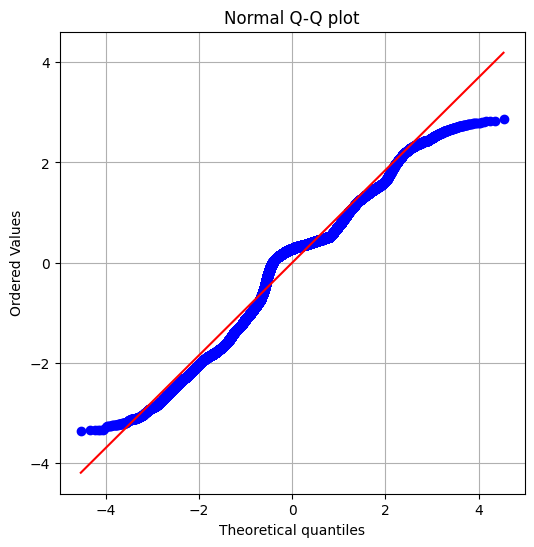

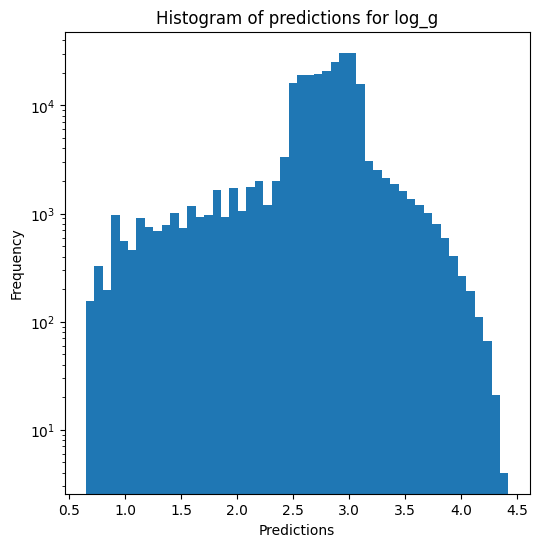

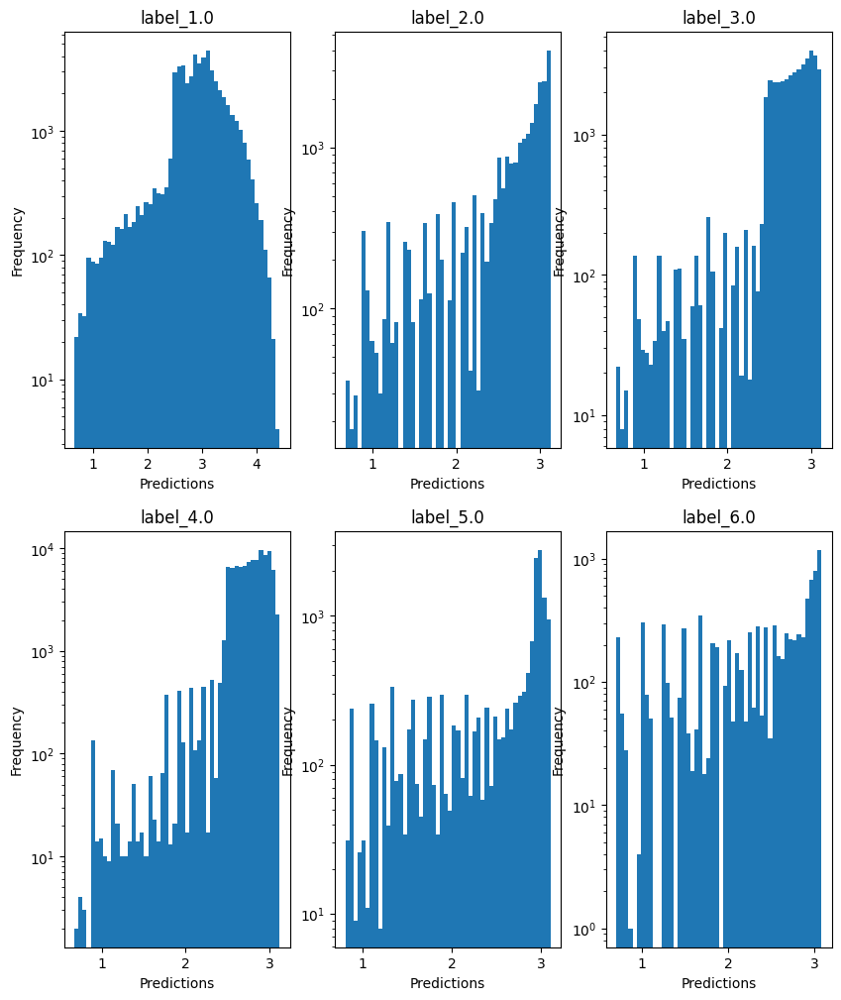

no negative values

radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.2911261433374748
  RMSE :  0.808124080940849
  MAE :  0.7470748806992455
  MedAE :  0.6753730792440239
  CORR :  0.6331630624513427
  MAX_ER :  1.7812591617638287
  Percentiles : 
    75th percentile :  0.9105479237212841
    90th percentile :  1.1883968356082244
    95th percentile :  1.3936709269906884
    99th percentile :  1.6244809350169191

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5386038834226305
  RMSE :  0.40465135367101507
  MAE :  0.3308070192533635
  MedAE :  0.2995236211922665
  CORR :  0.7362360964966709
  MAX_ER :  1.5436503239882045
  Percentiles : 
    75th percentile :  0.46920249407088394
    90th percentile :  0.6186982056964587
    95th percentile :  0.7463942959705809
    99th percentile :  1.098955430148088

radius results for the label

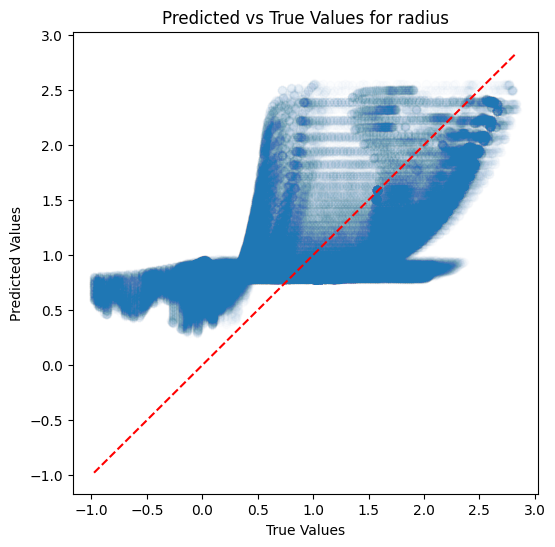

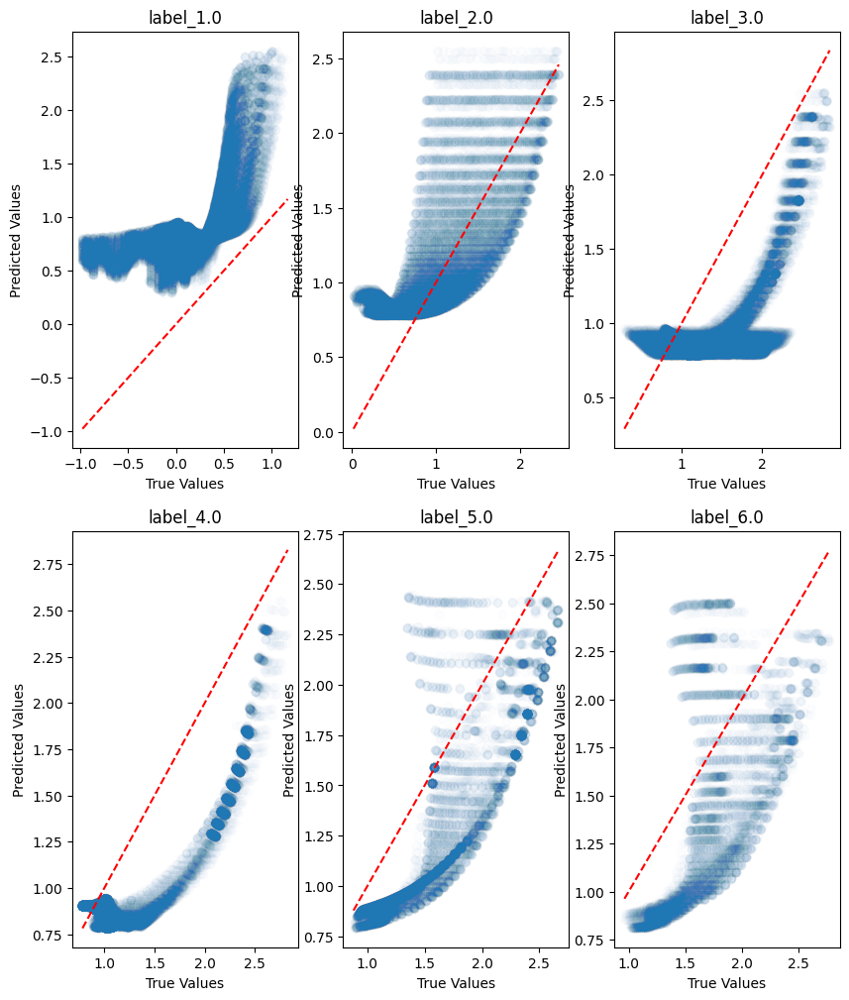

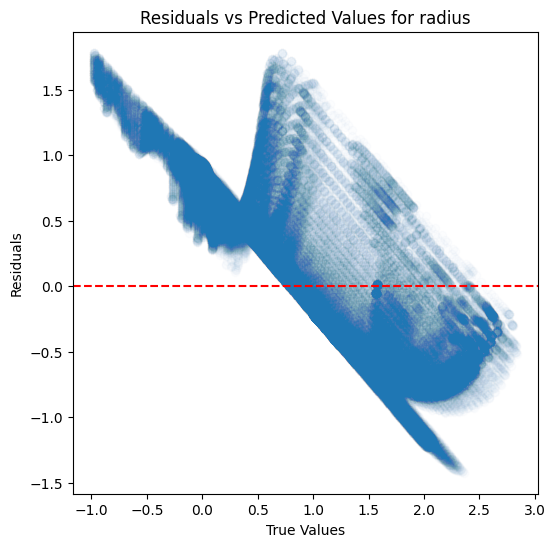

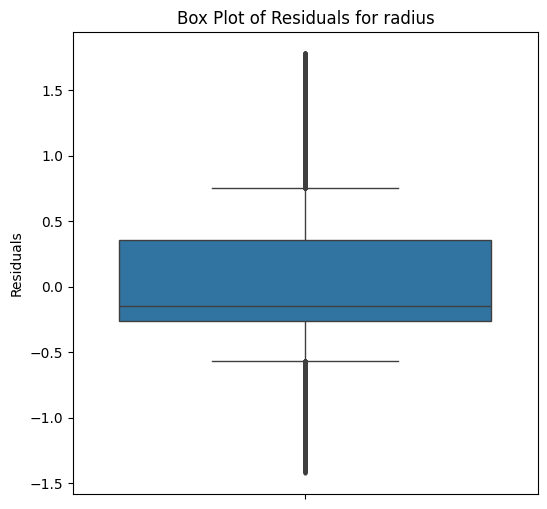

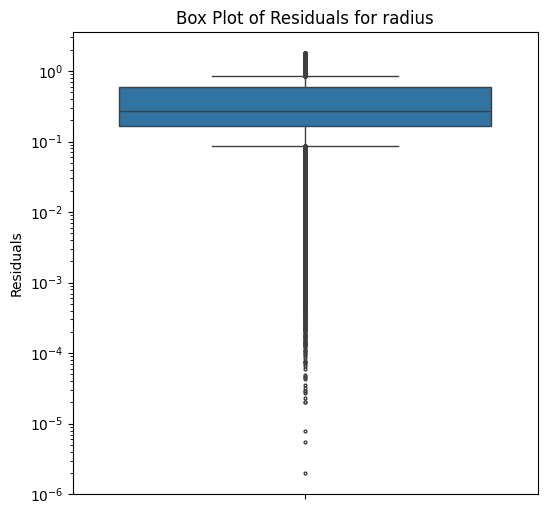

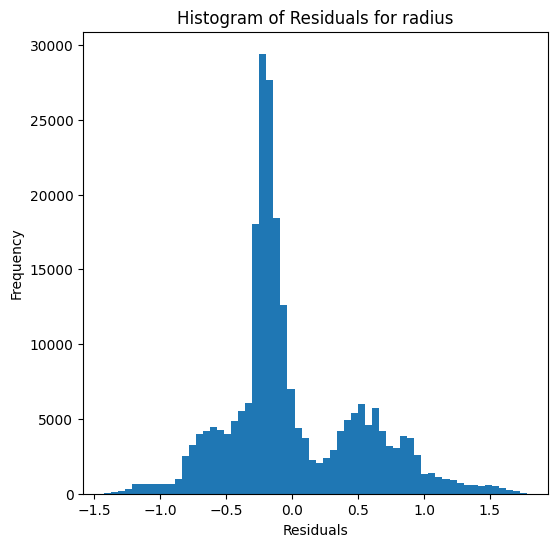

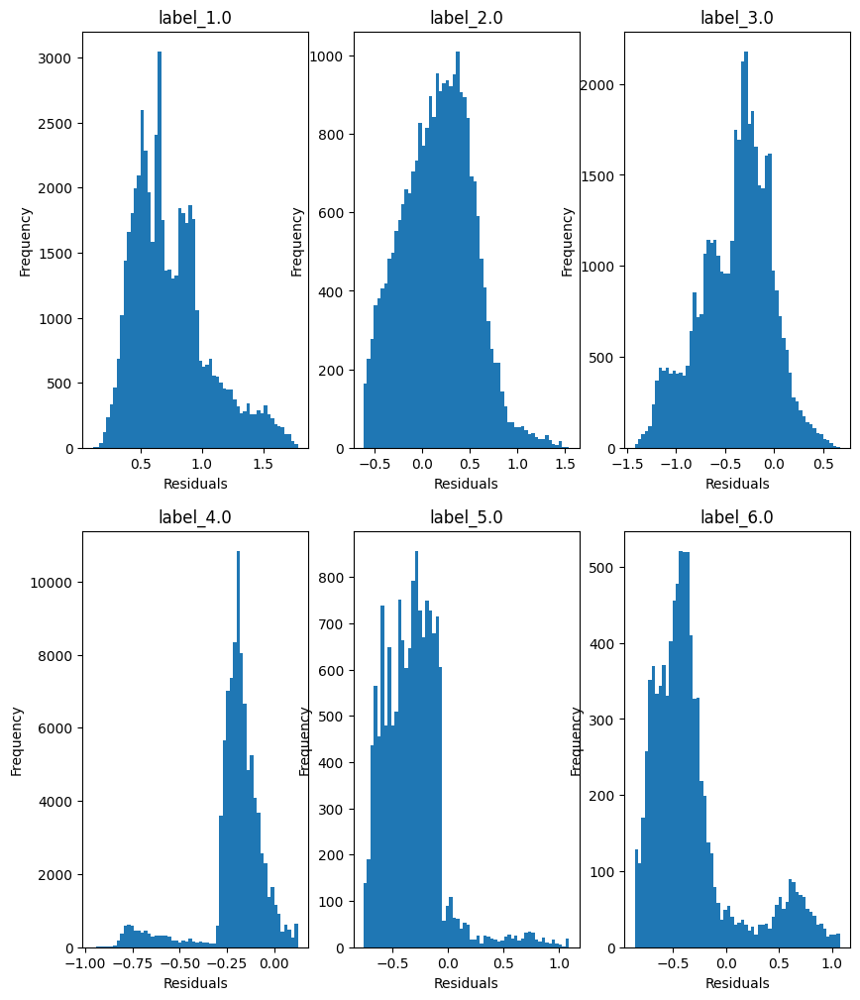

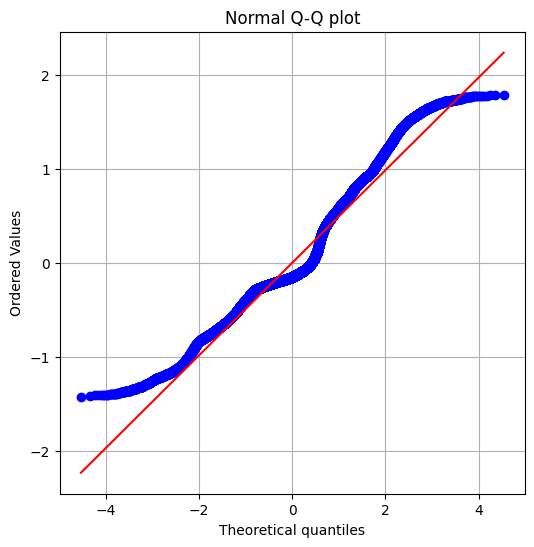

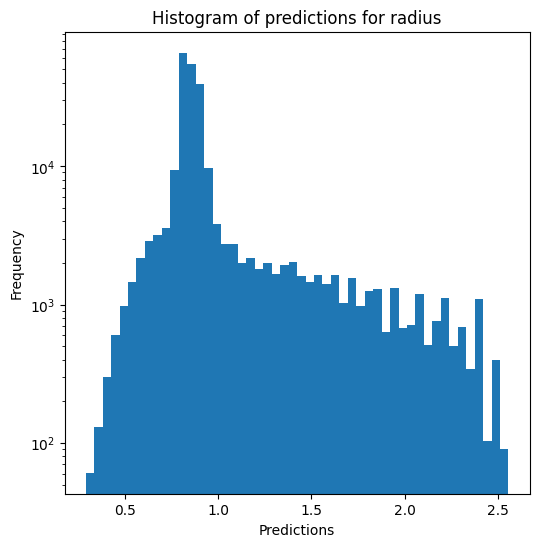

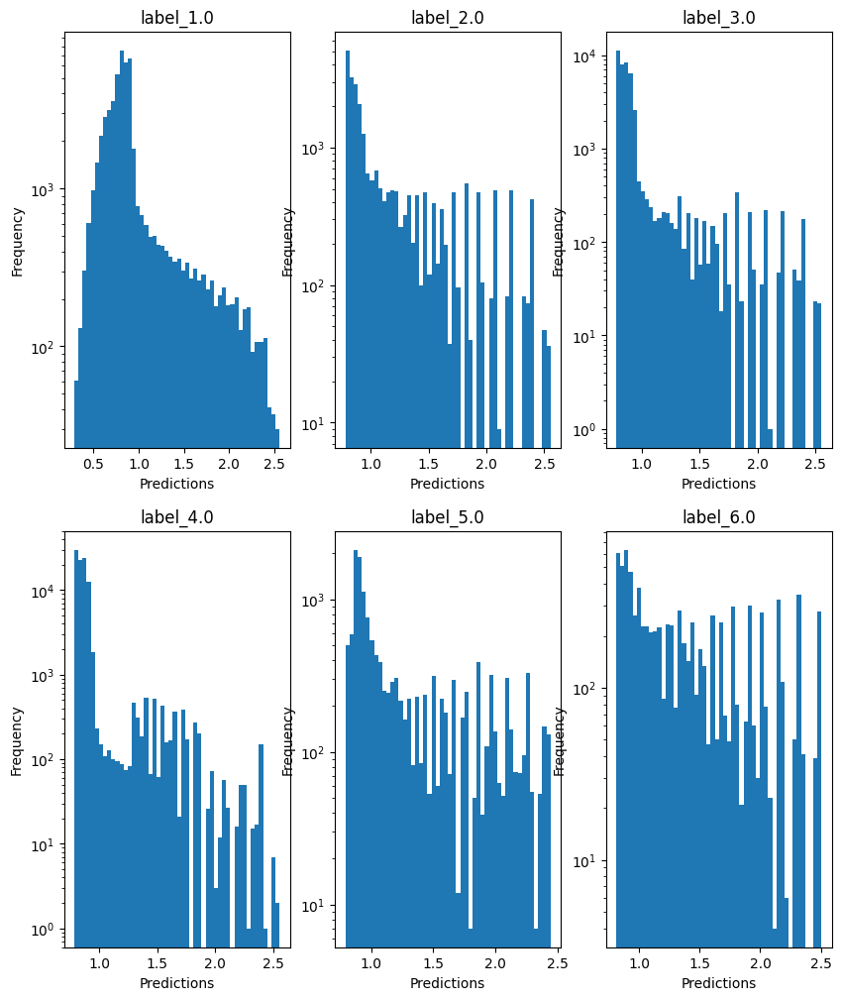

Saving predictions and results...


In [11]:
lr_evaluator.evaluate_Kfold_results(LinearRegression, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name) #, override=False, use_preds=True

### Decision tree

In [12]:
dt_evaluator = Model_evaluator("decision_tree", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...


c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)


no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9757503045153407
  RMSE :  0.041604061549778415
  MAE :  0.007341559446734046
  MedAE :  5.000000000032756e-05
  CORR :  0.9880496146989258
  MAX_ER :  0.8311642857142858
  Percentiles : 
    75th percentile :  0.001100000000000101
    90th percentile :  0.009800000000000253
    95th percentile :  0.02450000000000019
    99th percentile :  0.13800249999999828

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.8733647988385779
  RMSE :  0.06231538504154123
  MAE :  0.0337417893933271
  MedAE :  0.015200000000000102
  CORR :  0.9446074534375856
  MAX_ER :  0.8240999999999996
  Percentiles : 
    75th percentile :  0.037194642857143245
    90th percentile :  0.08584425000000023
    95th percentile :  0.142329722222221
    99th percentile :  0.23909859999999972

T_eff results for the label category with a value of 3.0
  v

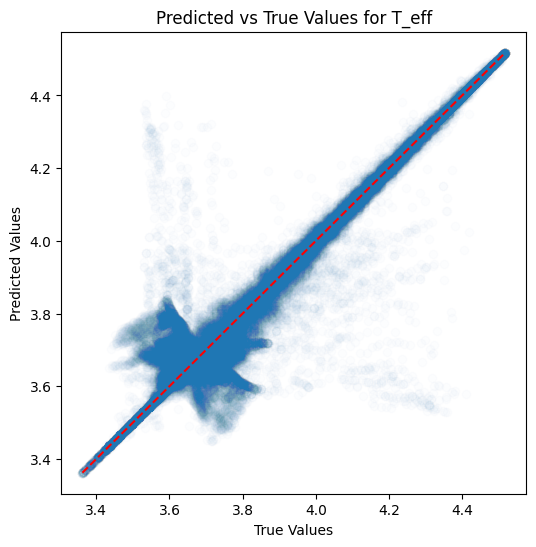

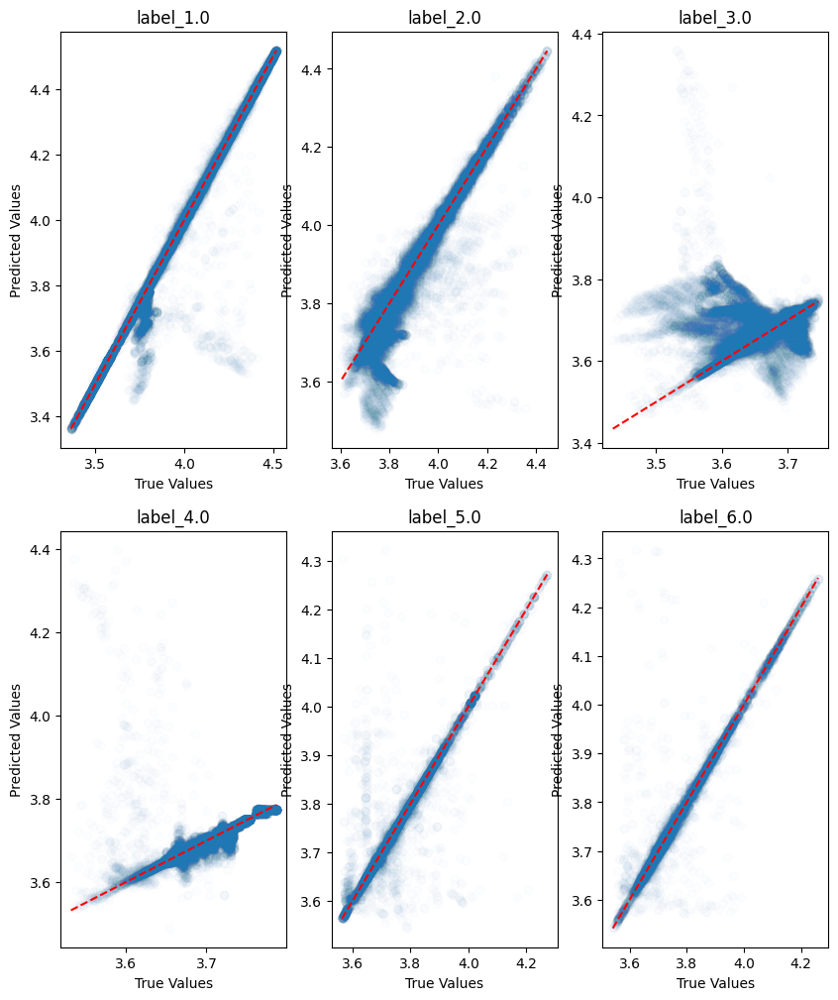

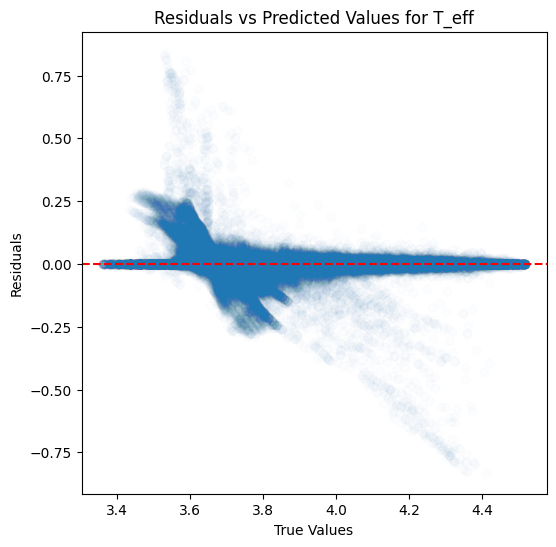

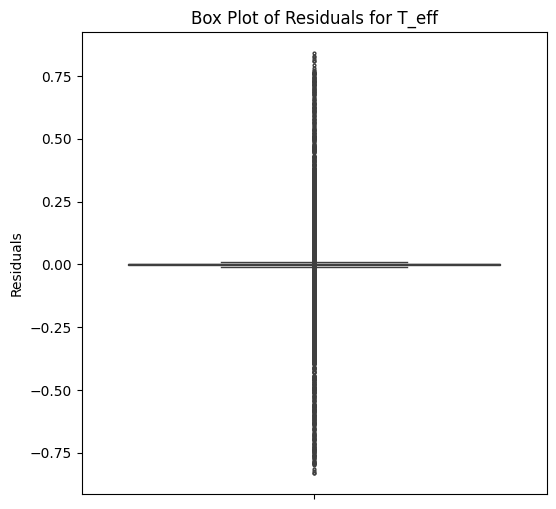

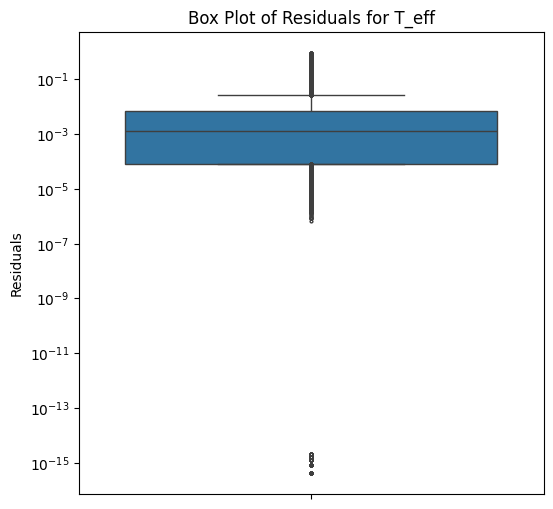

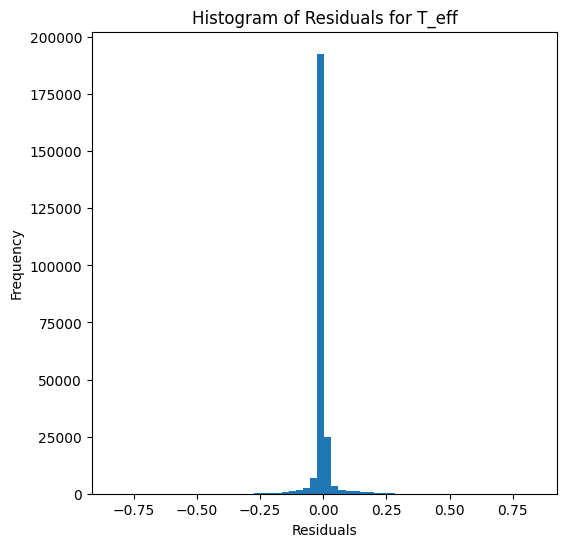

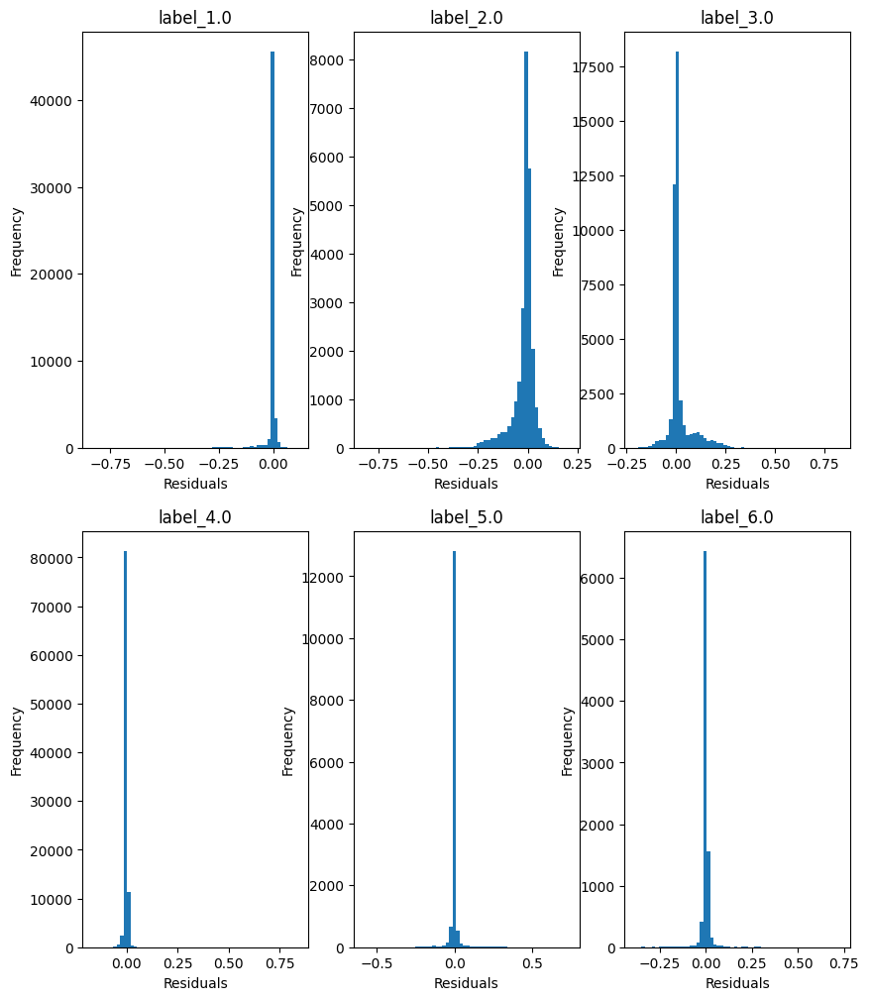

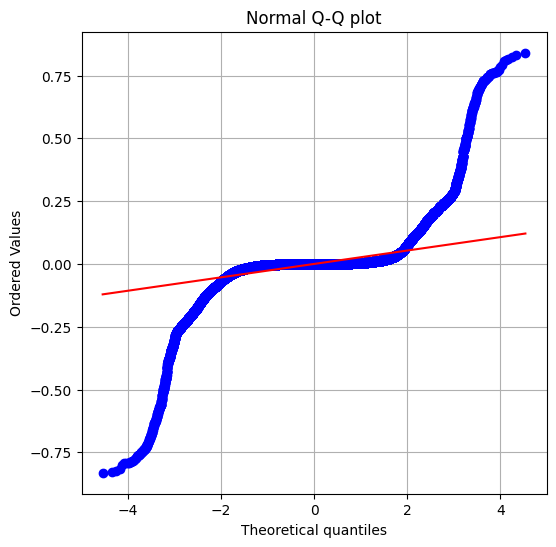

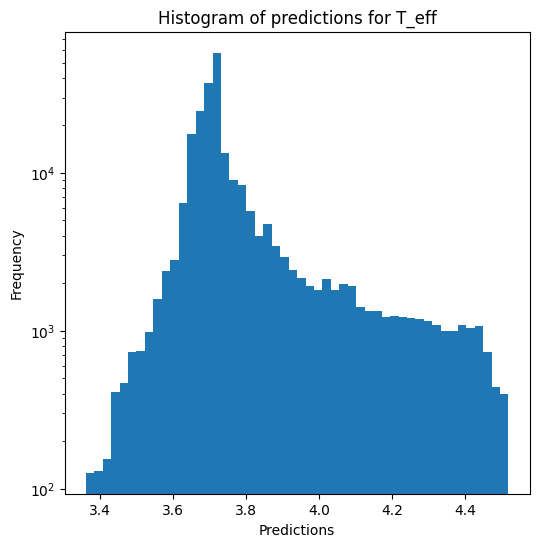

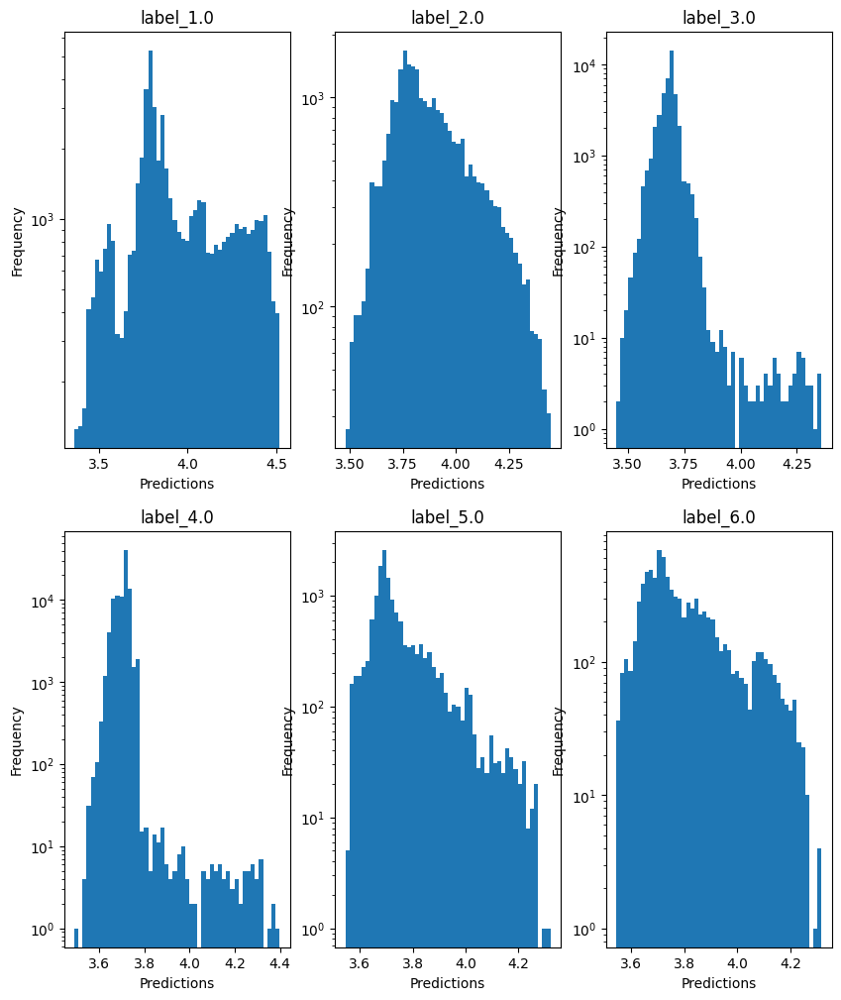

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.19730786992476612
  RMSE :  0.3763024942765613
  MAE :  0.06655680148201715
  MedAE :  0.0007999999999999119
  CORR :  0.7081715169736257
  MAX_ER :  4.698
  Percentiles : 
    75th percentile :  0.005999999999999783
    90th percentile :  0.0259999999999998
    95th percentile :  0.06399999999999961
    99th percentile :  1.965

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.20188562500755614
  RMSE :  0.7556037104844917
  MAE :  0.3026632483675435
  MedAE :  0.06000000000000005
  CORR :  0.654731564664574
  MAX_ER :  4.171
  Percentiles : 
    75th percentile :  0.15628333333333327
    90th percentile :  1.0146499999999996
    95th percentile :  1.8207424999999966
    99th percentile :  3.3757900000000007

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.4372540042243023
  RMSE :  0

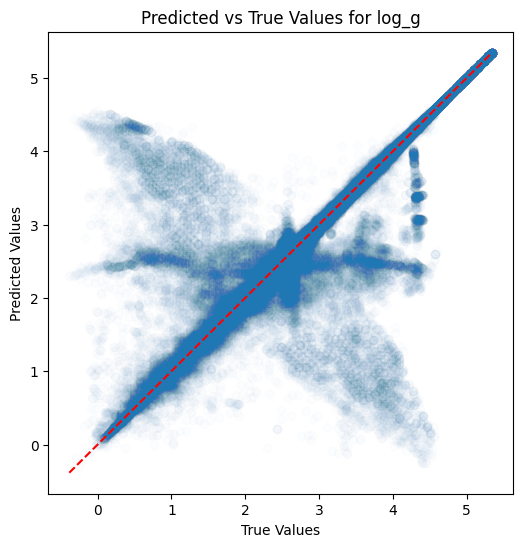

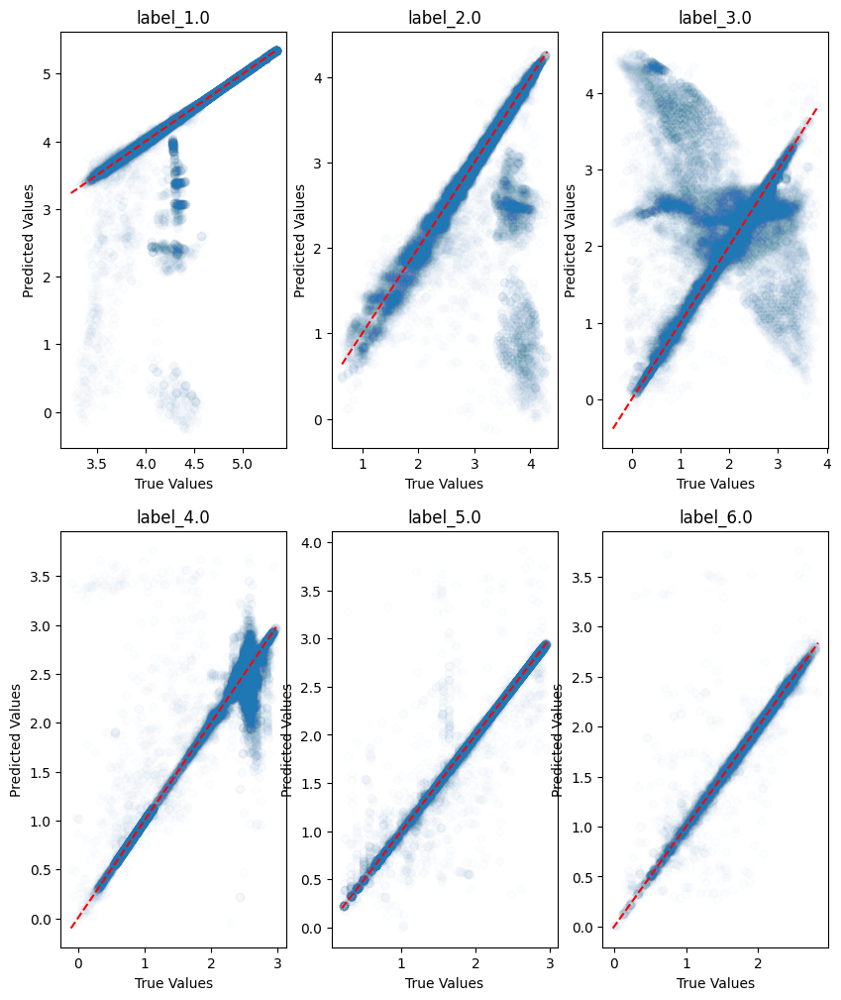

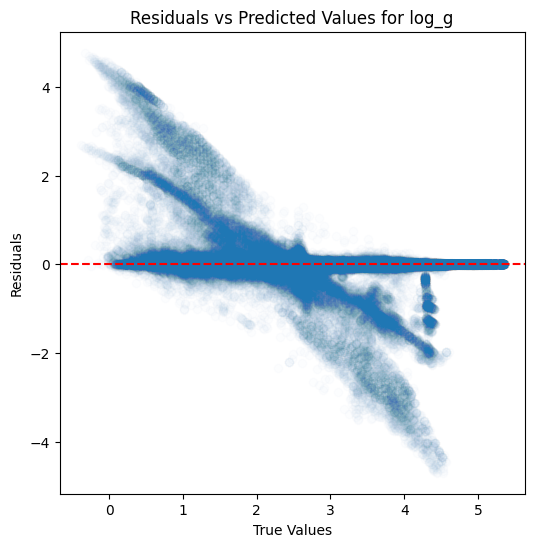

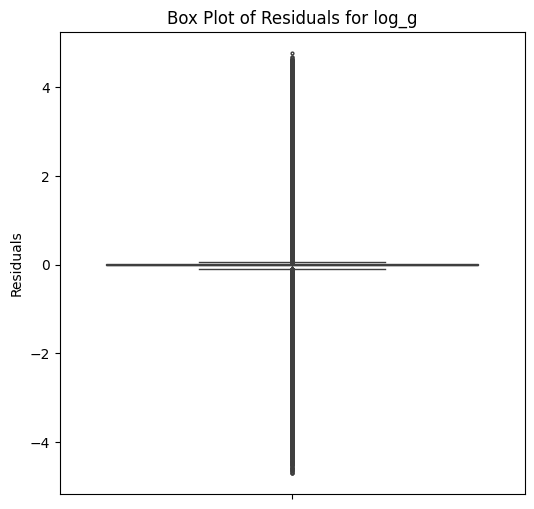

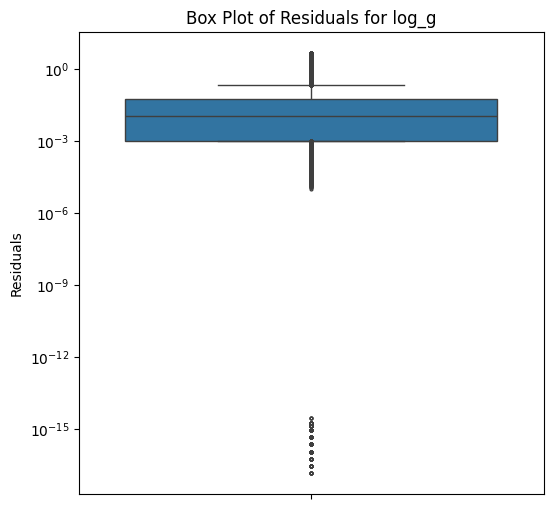

...

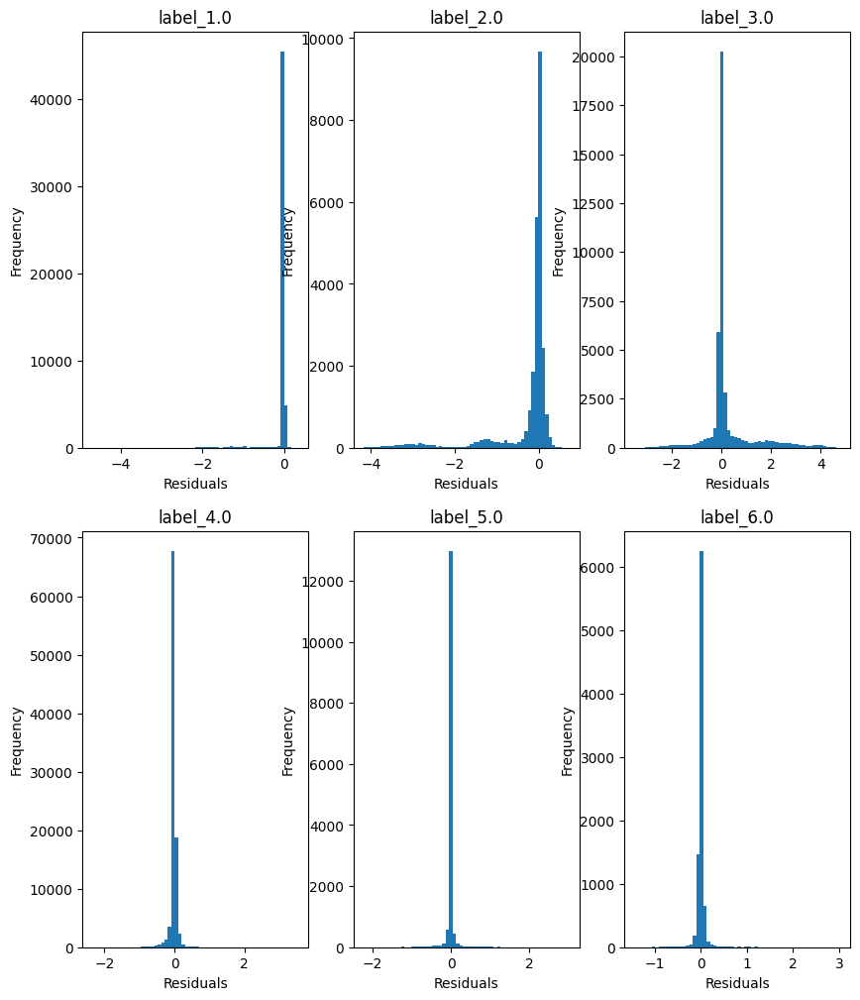

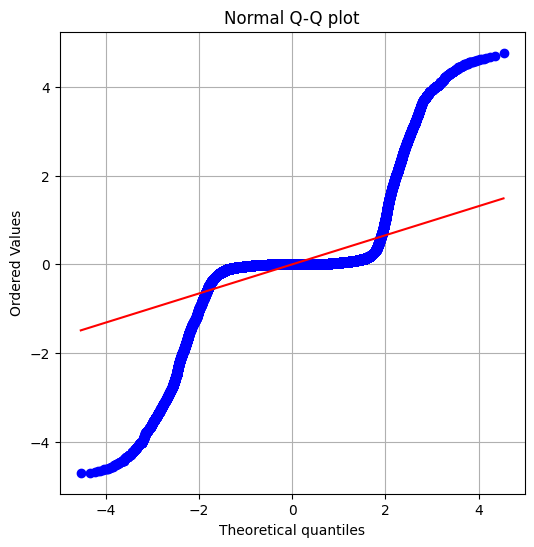

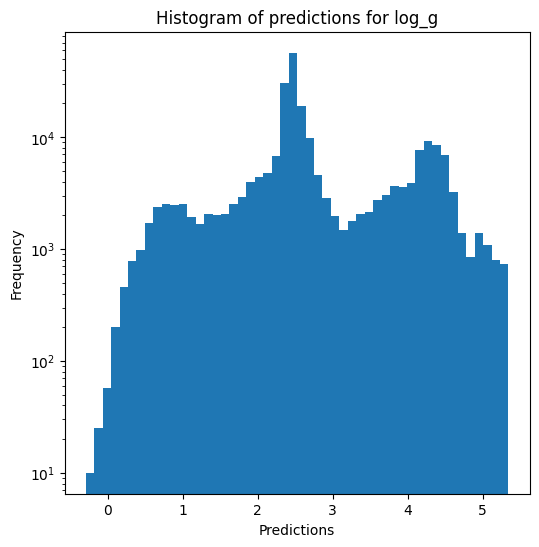

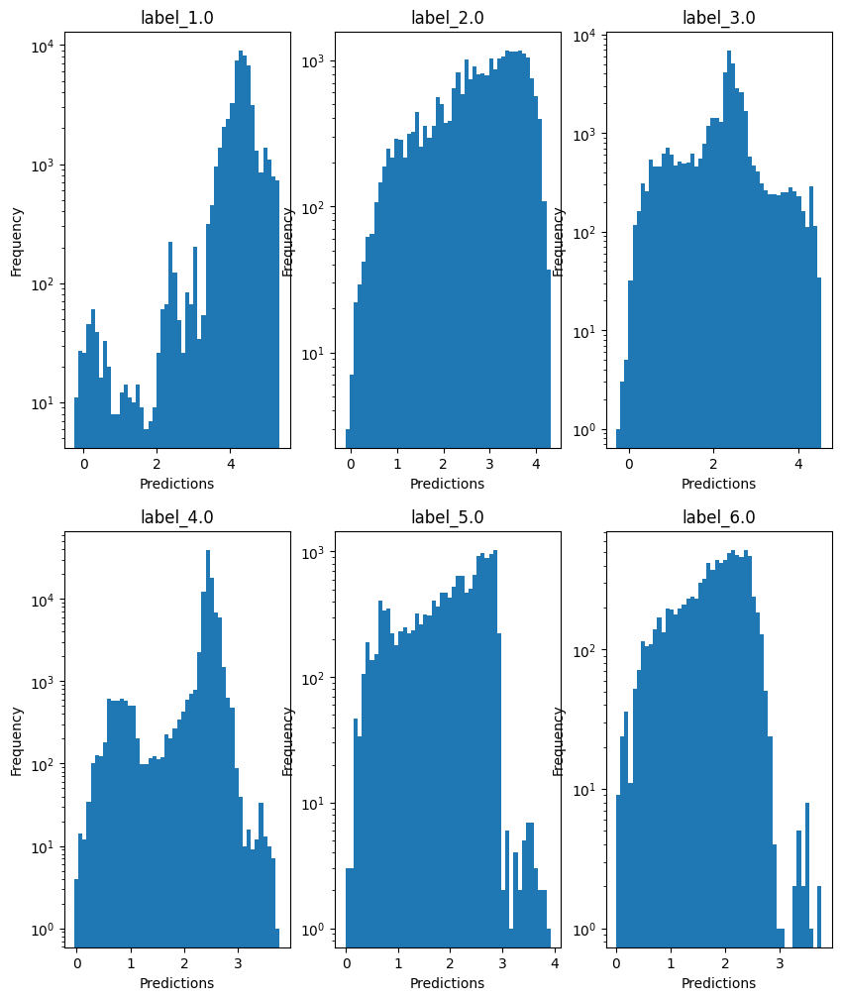

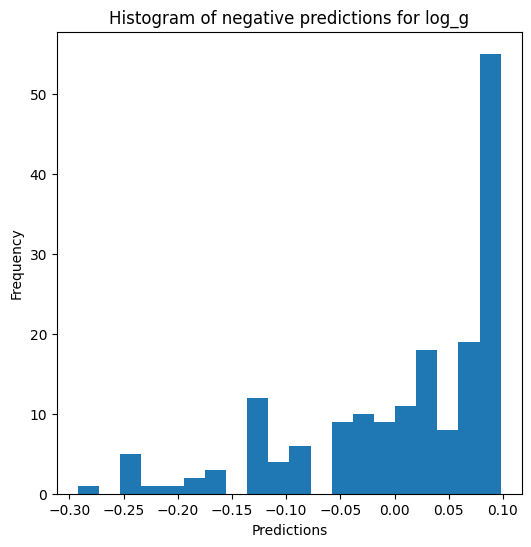

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\numpy\lib\_function_base_impl.py:4671: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)



radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.7419206968799053
  RMSE :  0.18838097198068696
  MAE :  0.03363658385931507
  MedAE :  0.00040527859417882617
  CORR :  0.8928647443436053
  MAX_ER :  2.34882506460925
  Percentiles : 
    75th percentile :  0.003401700925800992
    90th percentile :  0.014627606839325069
    95th percentile :  0.034004556463143626
    99th percentile :  0.9825917147479

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5649930074807838
  RMSE :  0.37781437145922736
  MAE :  0.15139571072127395
  MedAE :  0.030161486098030377
  CORR :  0.7803794098221069
  MAX_ER :  2.0861071059413177
  Percentiles : 
    75th percentile :  0.07811273422851006
    90th percentile :  0.5069937525787548
    95th percentile :  0.9106798152148002
    99th percentile :  1.6878995314163685

radius results for the label catego

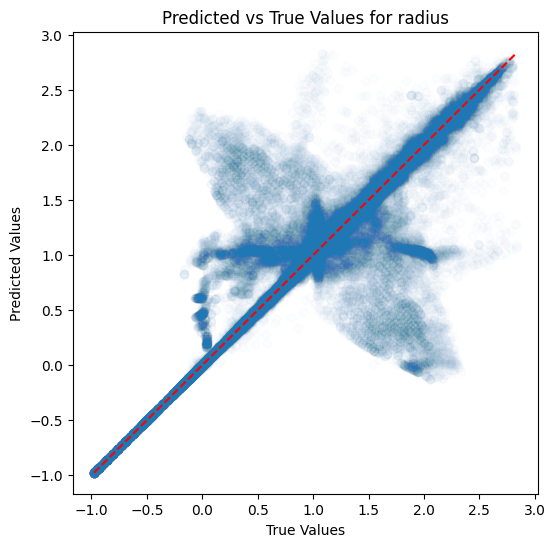

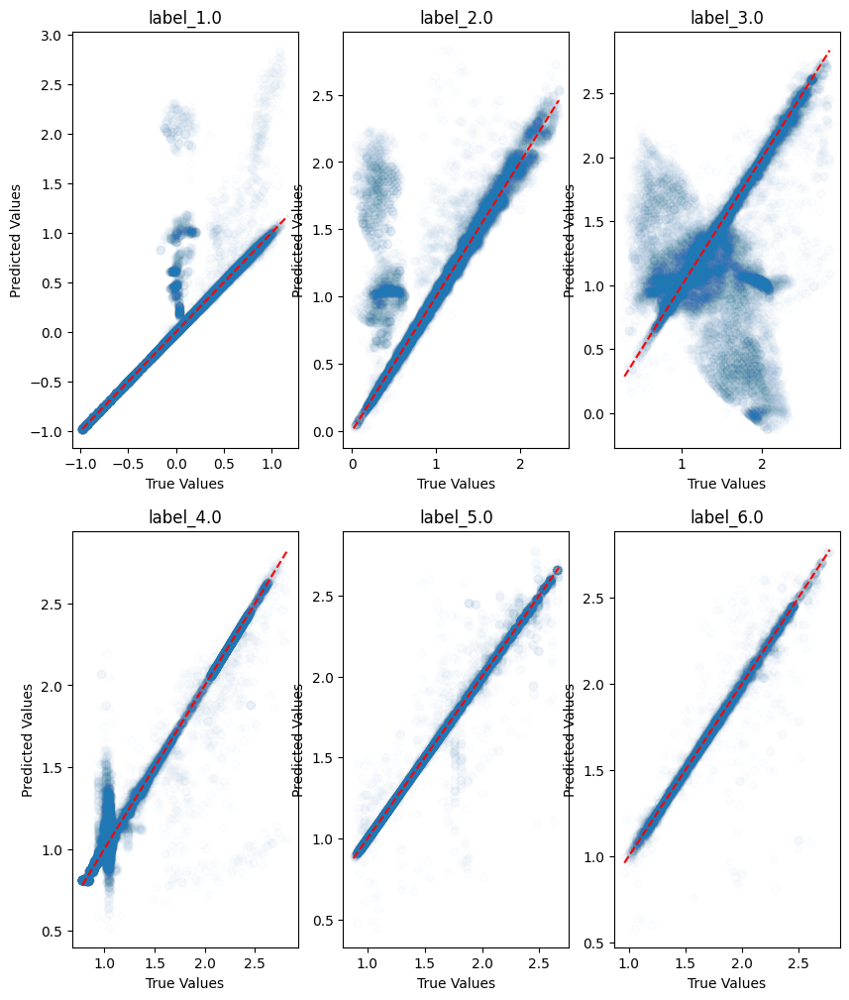

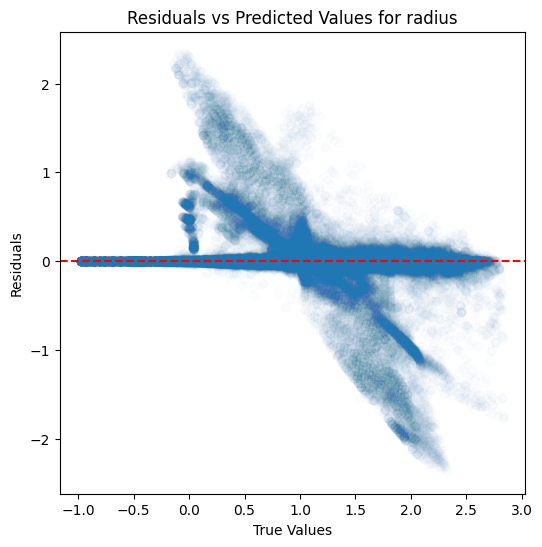

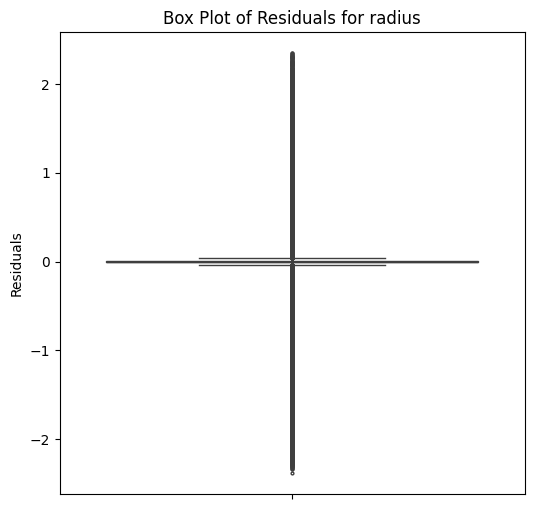

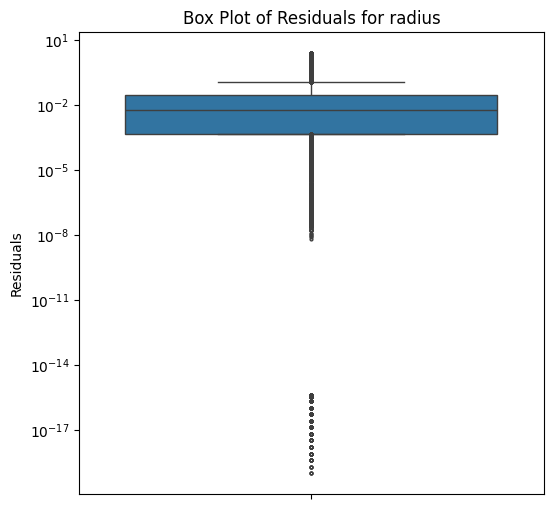

...

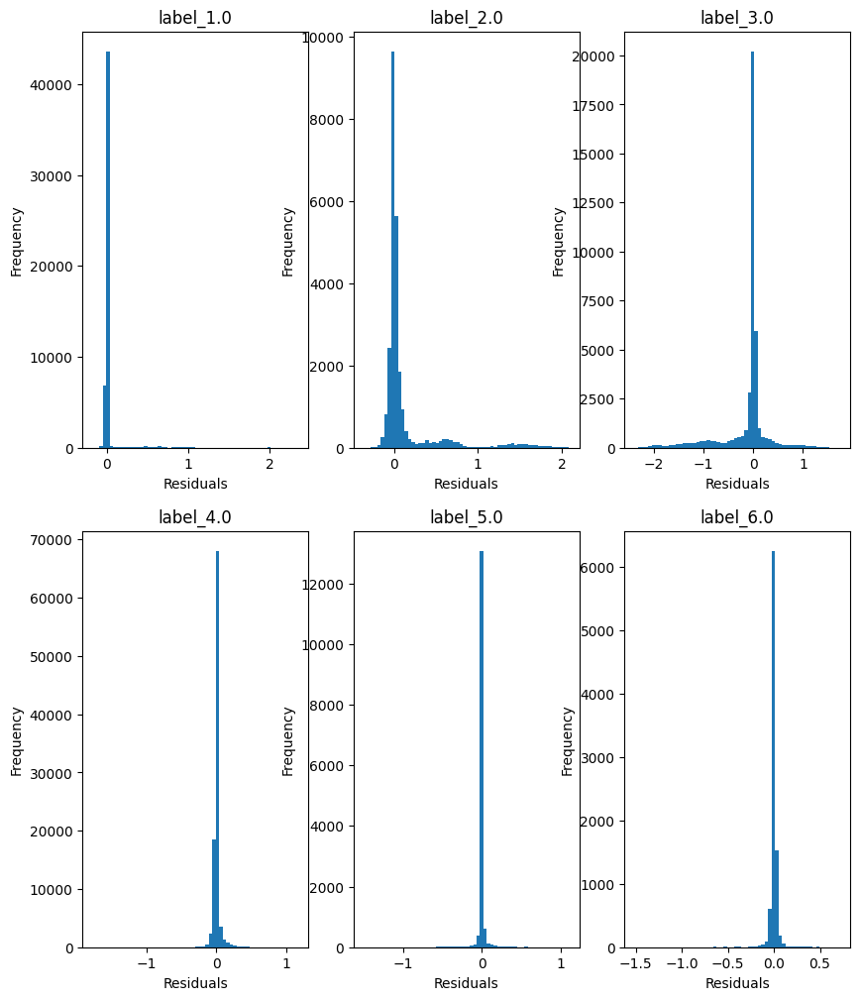

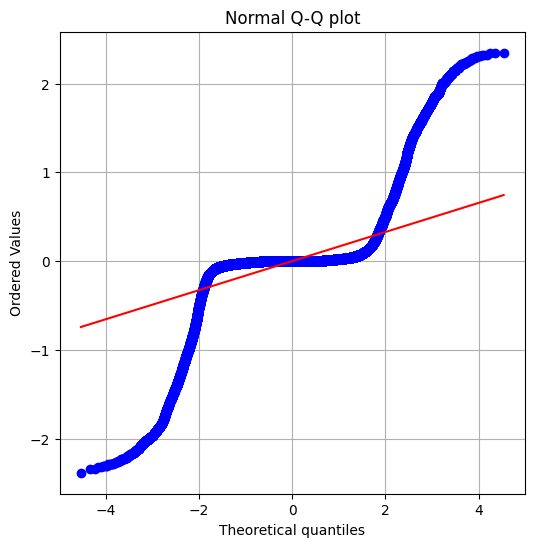

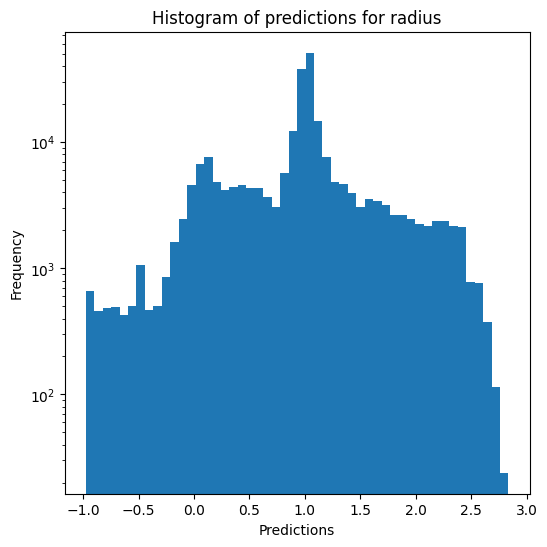

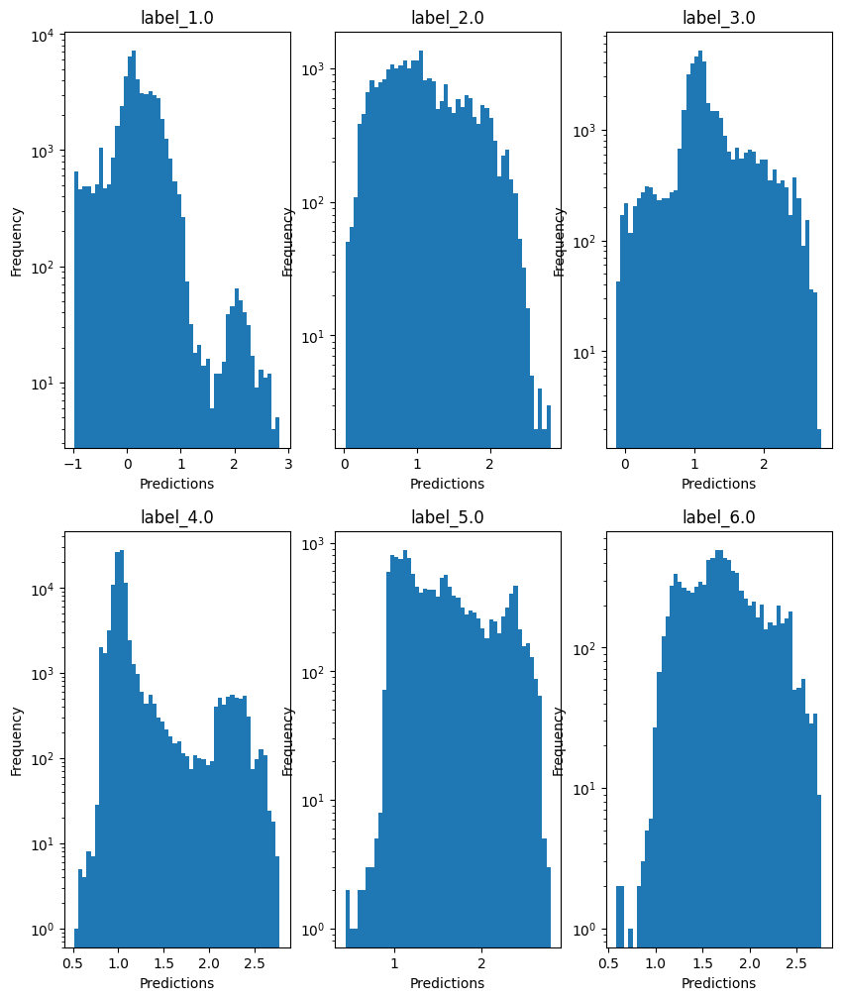

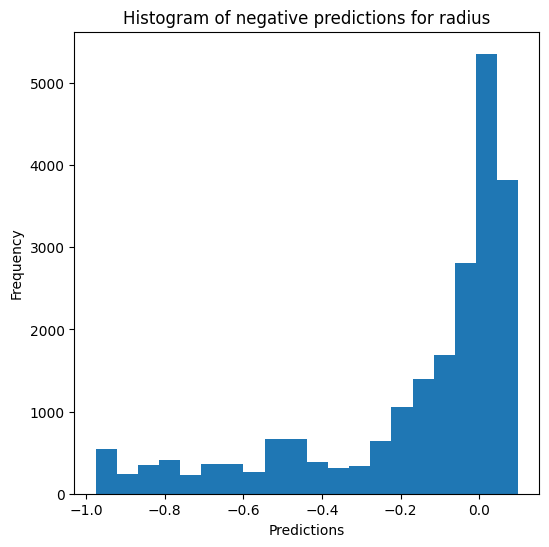

Saving predictions and results...


In [13]:
dt_evaluator.evaluate_Kfold_results(DecisionTreeRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### K-nearest neighbours

In [14]:
knn_evaluator = Model_evaluator("KNN", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9638608833470892
  RMSE :  0.051086713420588604
  MAE :  0.014496576962437934
  MedAE :  0.0029799999999995386
  CORR :  0.9818428211789911
  MAX_ER :  0.82918
  Percentiles : 
    75th percentile :  0.010074999999999723
    90th percentile :  0.03255999999999992
    95th percentile :  0.04839999999999989
    99th percentile :  0.22966299999999912

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9025090343673441
  RMSE :  0.05642622313846674
  MAE :  0.0363745544017359
  MedAE :  0.02251000000000003
  CORR :  0.9544749444248902
  MAX_ER :  0.6363200000000004
  Percentiles : 
    75th percentile :  0.04808000000000012
    90th percentile :  0.08666599999999994
    95th percentile :  0.1167400000000002
    99th perc

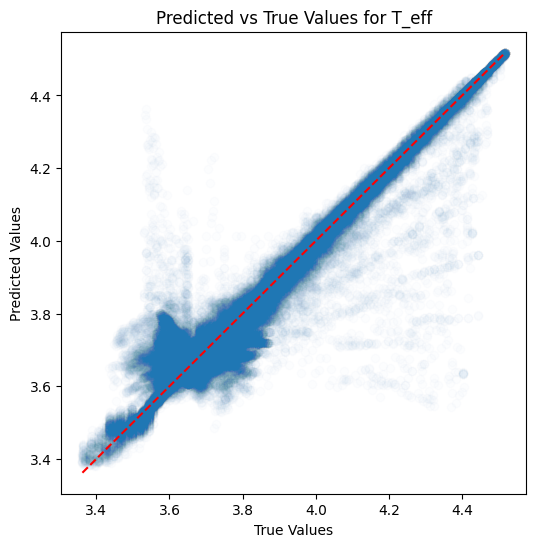

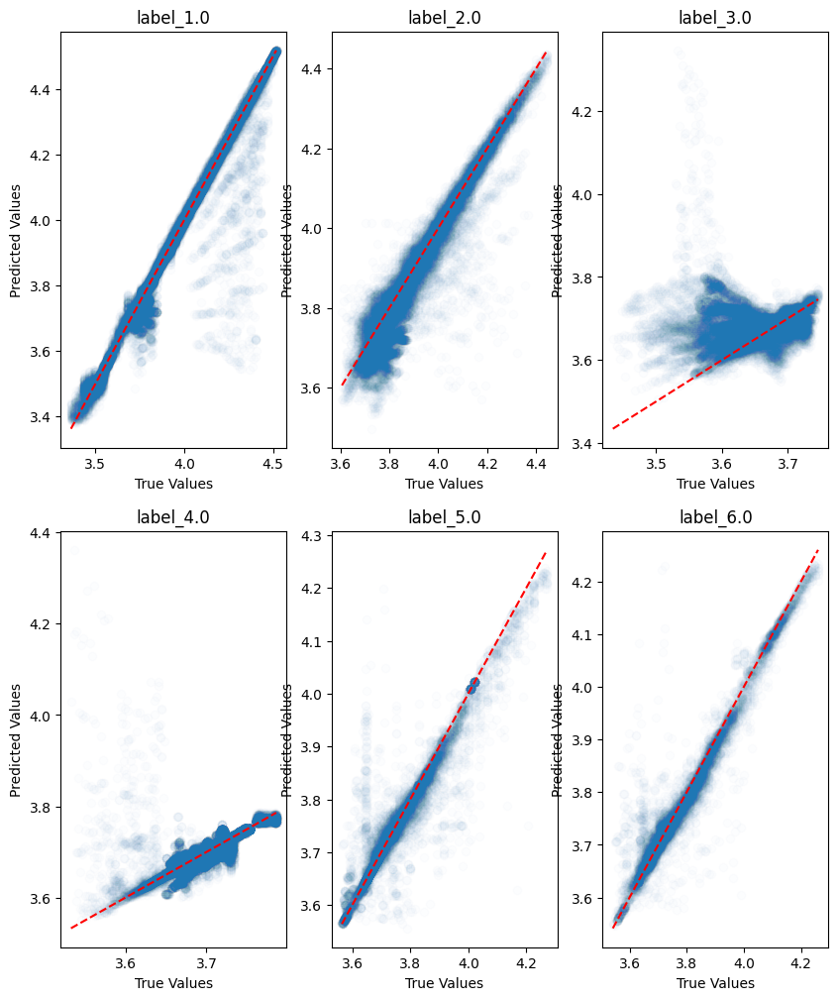

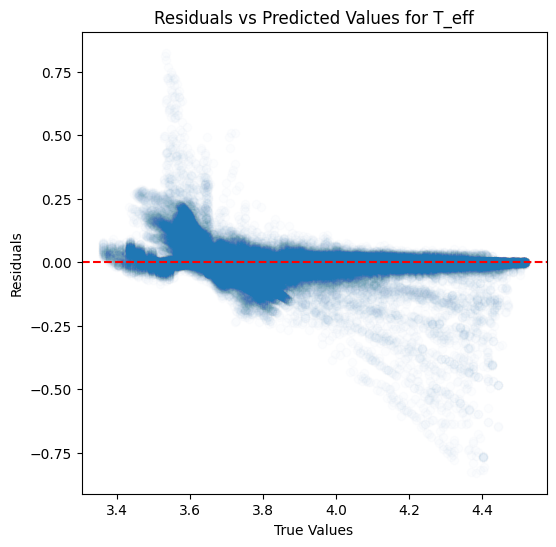

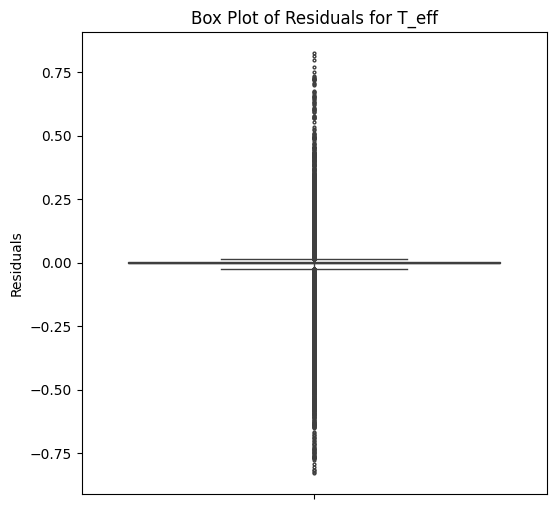

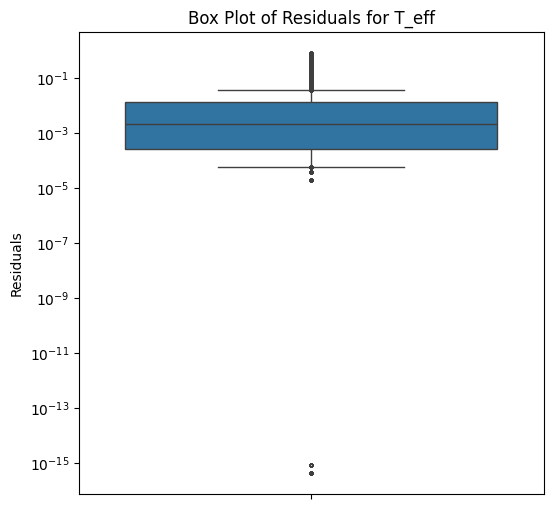

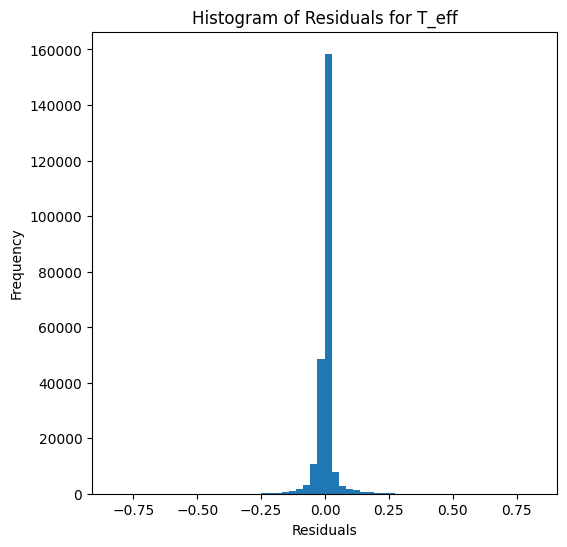

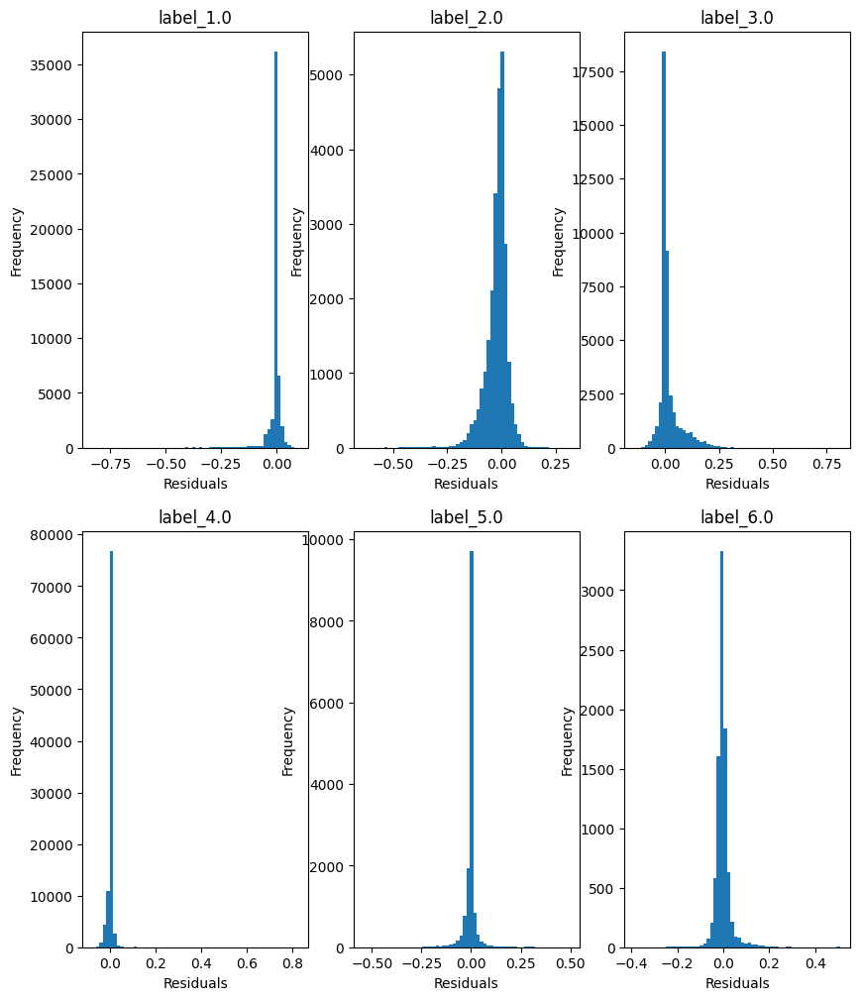

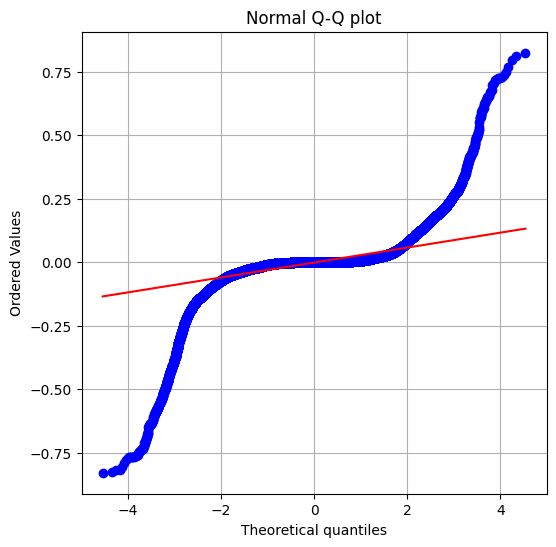

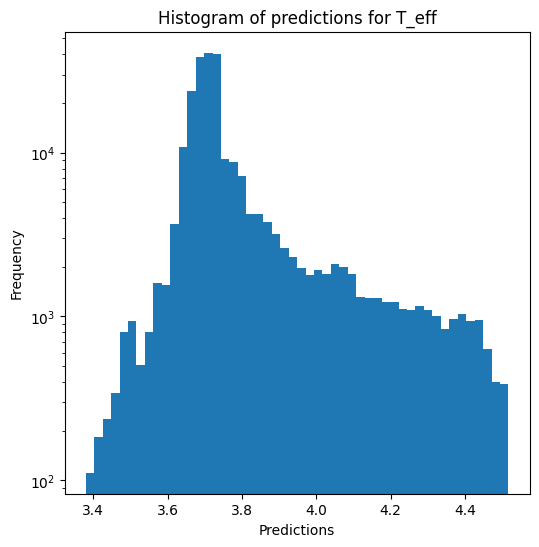

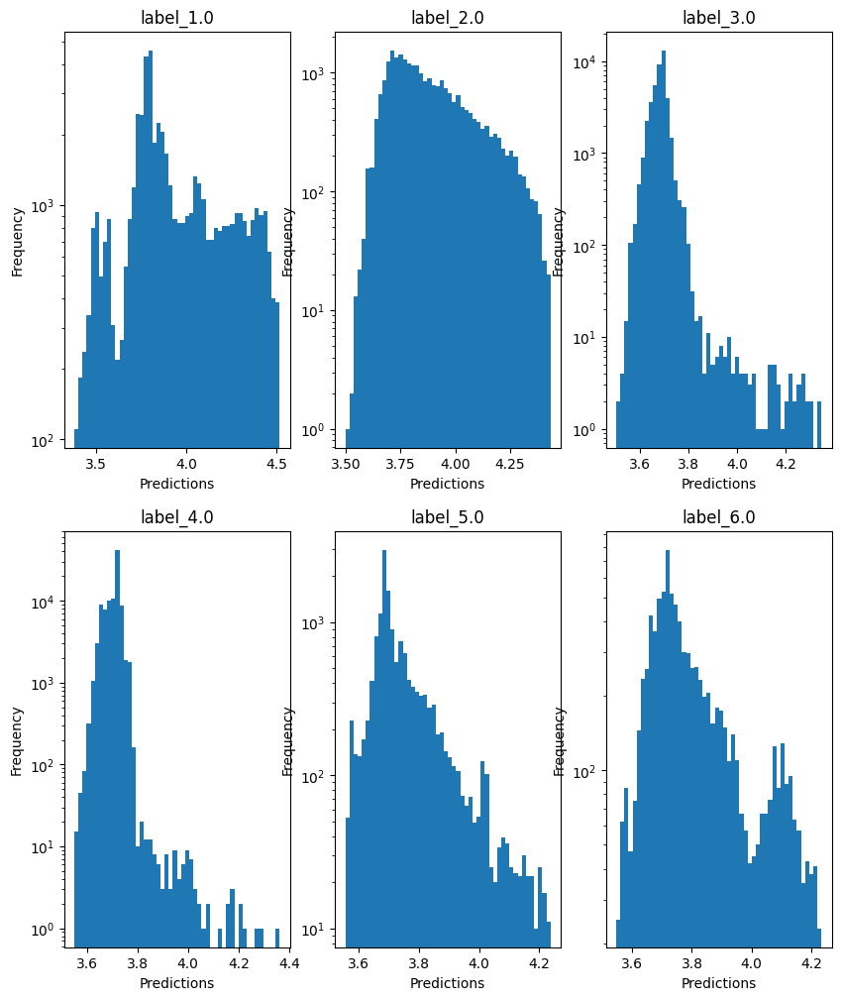


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -0.12578341719886565
  RMSE :  0.3724056317096357
  MAE :  0.10610109919266195
  MedAE :  0.008600000000000385
  CORR :  0.7414746317564871
  MAX_ER :  4.513
  Percentiles : 
    75th percentile :  0.03080000000000016
    90th percentile :  0.09040000000000048
    95th percentile :  0.7869500000000001
    99th percentile :  1.9640099999999991

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.5498139783506506
  RMSE :  0.5932676786290398
  MAE :  0.3079835864848109
  MedAE :  0.09240000000000037
  CORR :  0.7687380780954205
  MAX_ER :  3.9669999999999996
  Percentiles : 
    75th percentile :  0.2630999999999999
    90th percentile :  1.08966
    95th percentile :  1.4185199999999984
    99th percentile :  2.284832

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RVE :  -0.09782846686966074
  RMSE :

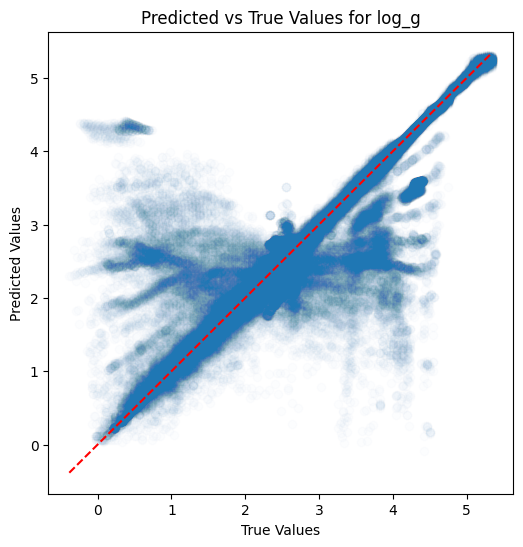

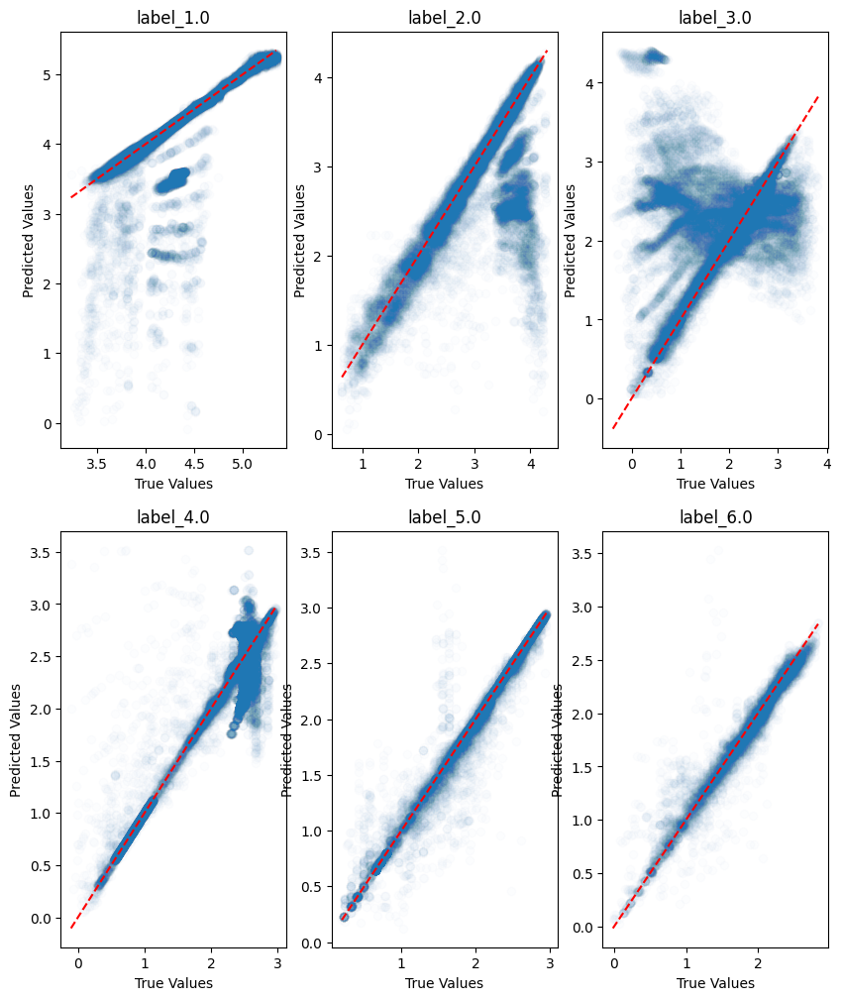

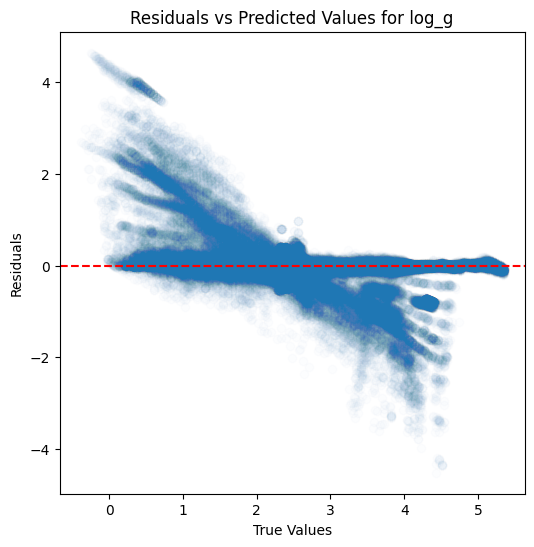

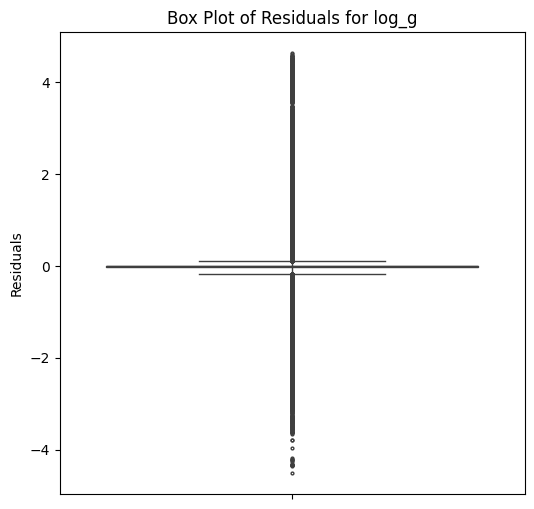

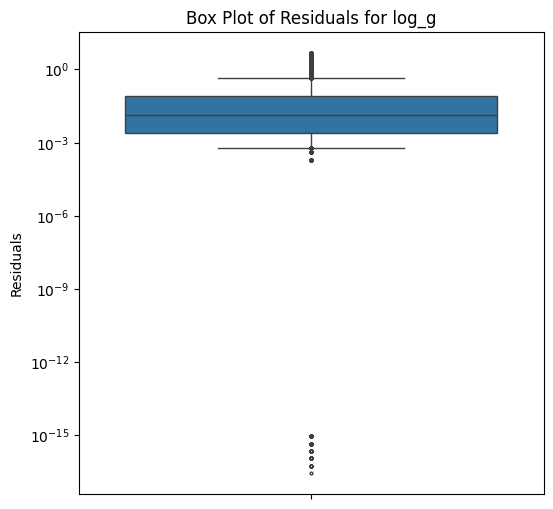

...

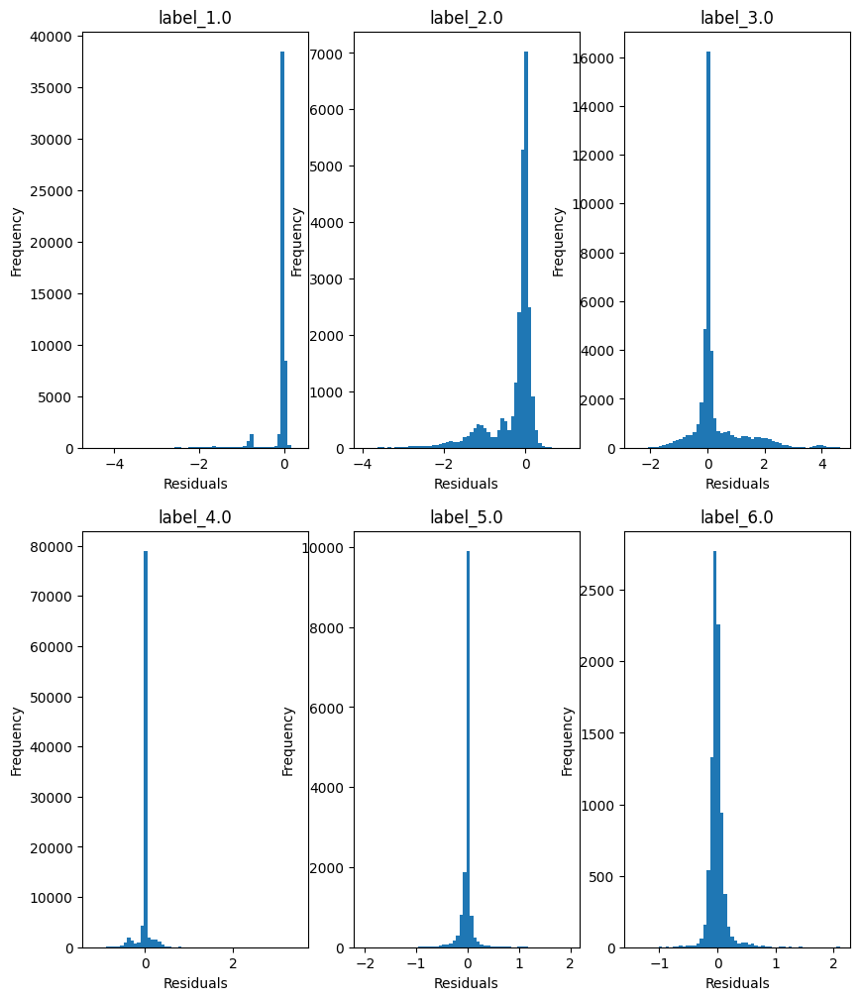

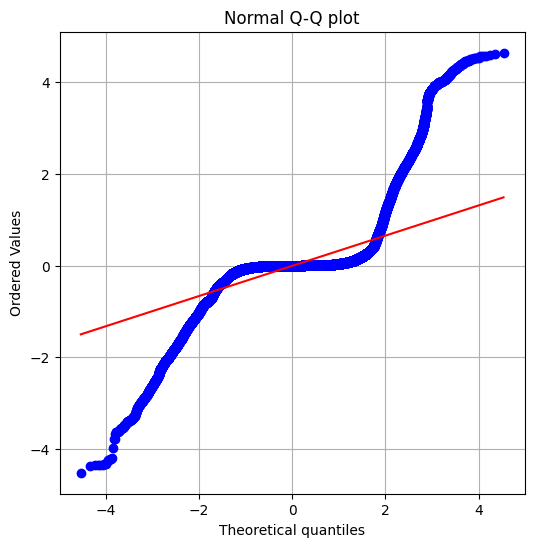

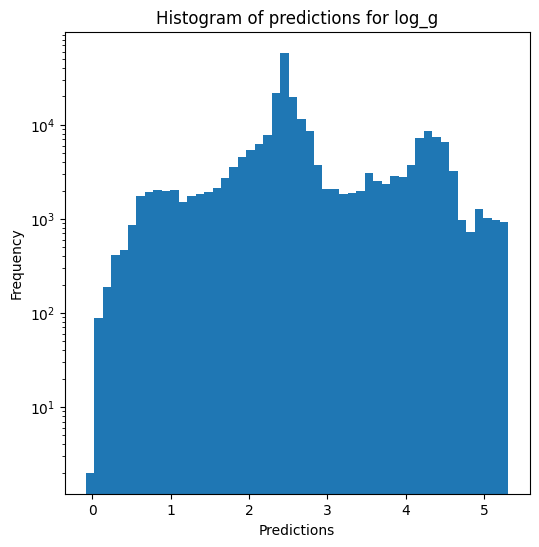

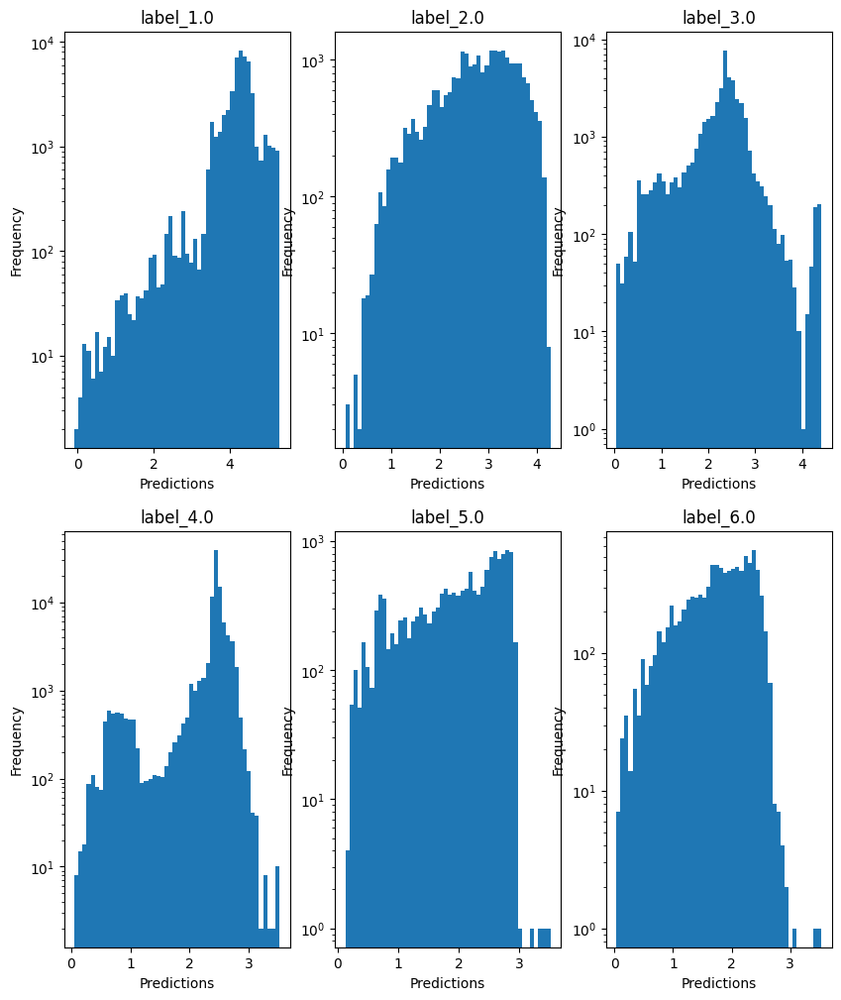

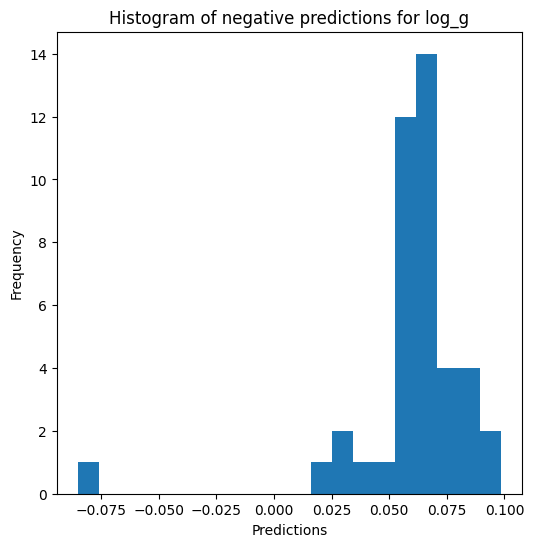


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.7543806153801486
  RMSE :  0.1876129632747646
  MAE :  0.05738374788003992
  MedAE :  0.006675124532290393
  CORR :  0.9016261189235775
  MAX_ER :  2.2561552794953266
  Percentiles : 
    75th percentile :  0.021219602942988827
    90th percentile :  0.07954620518285227
    95th percentile :  0.3935776490438437
    99th percentile :  0.983249197005407

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7545975326040062
  RMSE :  0.29666551439261934
  MAE :  0.15407576655776295
  MedAE :  0.04631267390887245
  CORR :  0.8692172701561303
  MAX_ER :  1.9831724722172852
  Percentiles : 
    75th percentile :  0.13156635565022273
    90th percentile :  0.5450385236866104
    95th percentile :  0.7093182131121989
    99th percentile :  1.1431641817418525

radius results for the label category 

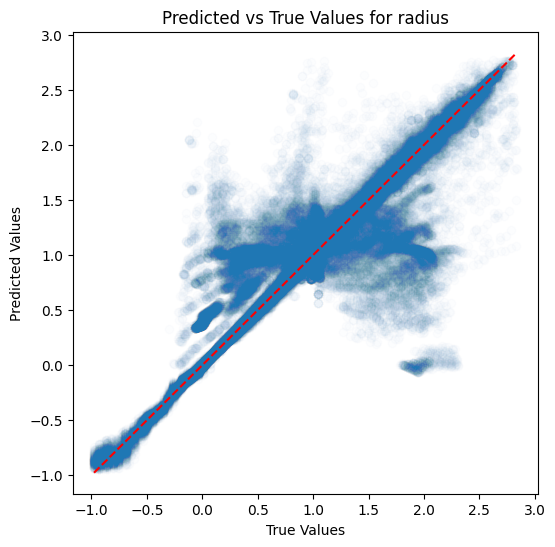

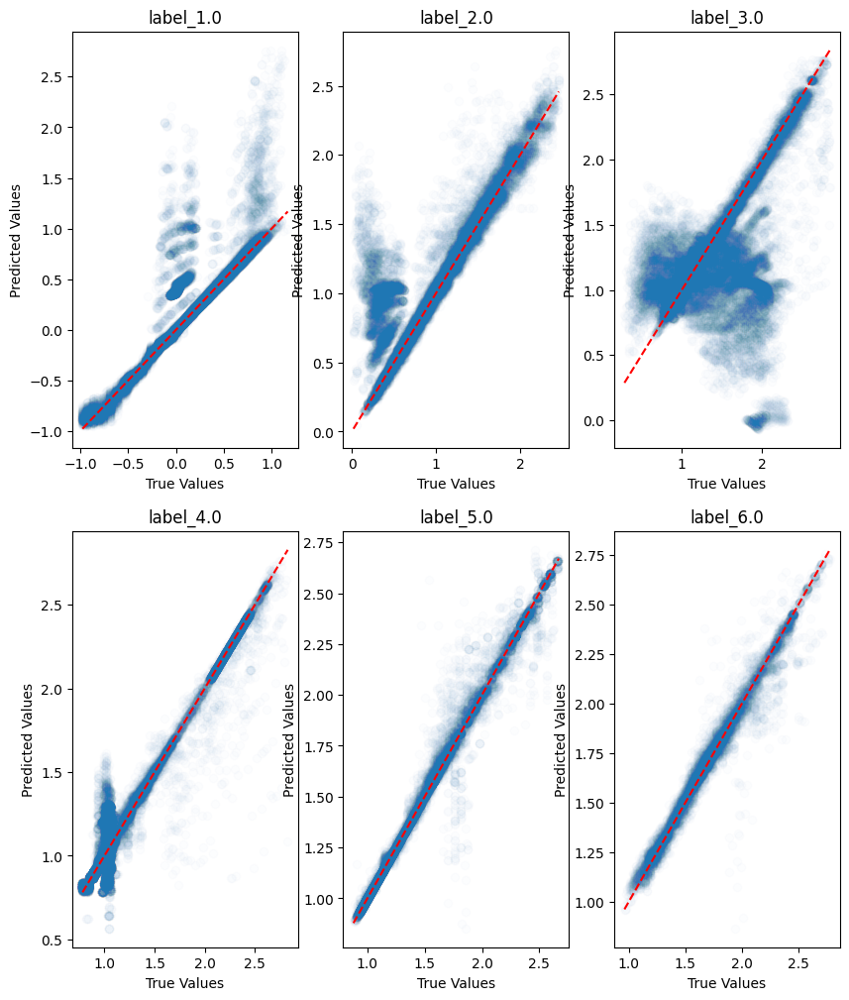

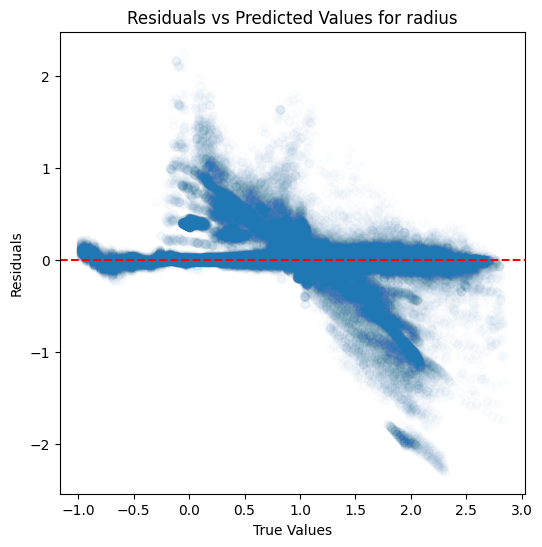

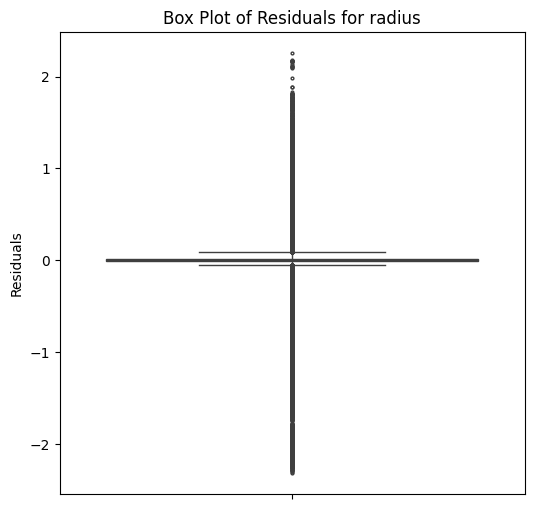

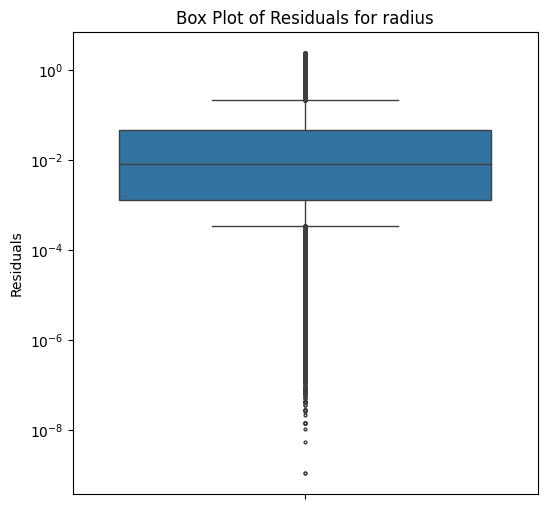

...

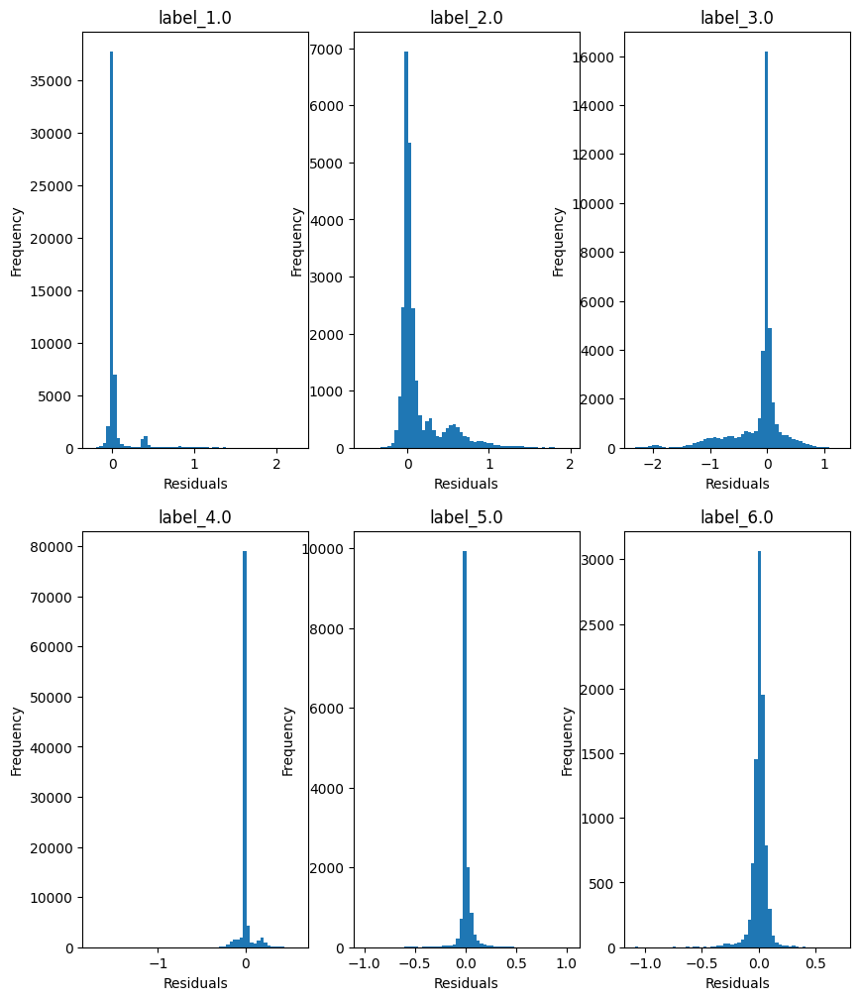

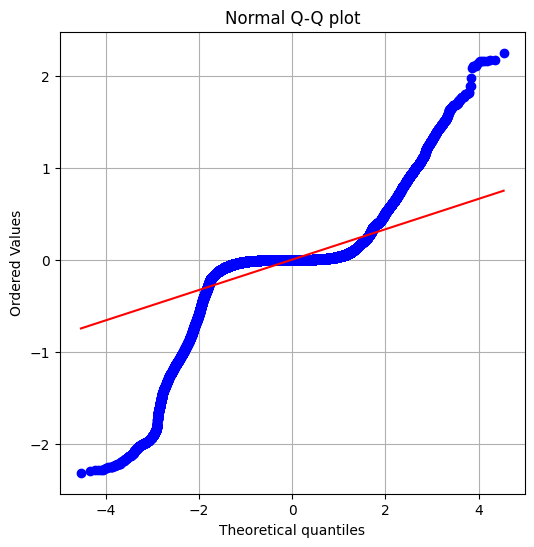

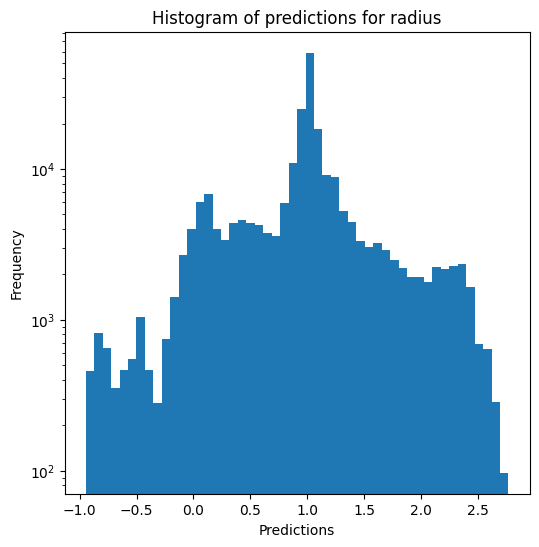

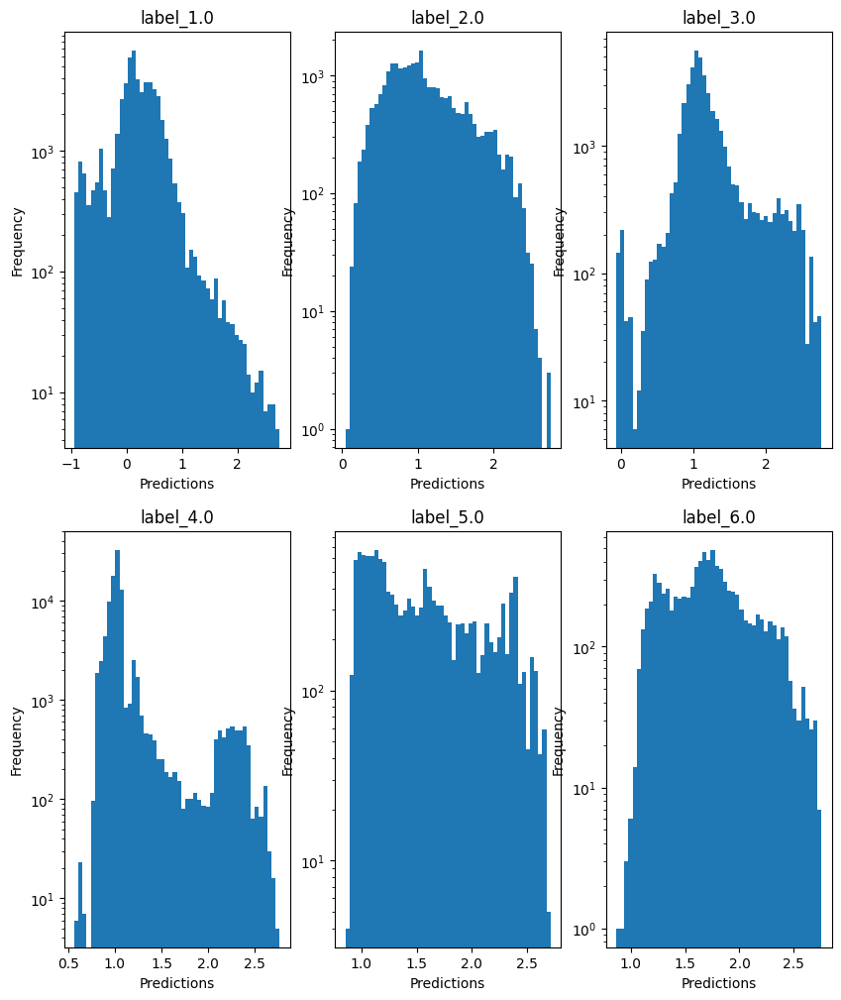

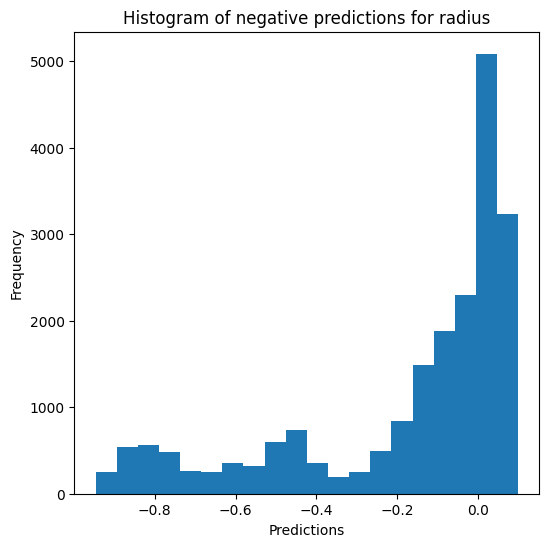

Saving predictions and results...


In [15]:
knn_evaluator.evaluate_Kfold_results(KNeighborsRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name)

### Random forests

In [16]:
rf_evaluator = Model_evaluator("random_forest", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.982798003492336
  RMSE :  0.03522776219808008
  MAE :  0.007311779353697991
  MedAE :  0.00019900000000050433
  CORR :  0.9914649696591054
  MAX_ER :  0.7536883200000006
  Percentiles : 
    75th percentile :  0.002393749999997974
    90th percentile :  0.010854744047617881
    95th percentile :  0.03080110000000369
    99th percentile :  0.12824122773634256

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.9002187437381981
  RMSE :  0.055771217265558976
  MAE :  0.03244432754400626
  MedAE :  0.016254944859309894
  CORR :  0.9552093618738898
  MAX_ER :  0.7556087000000016
  Percentiles : 
    75th percentile :  0.03945428633604753
    90th percentile :  0.08387164725321135
    95th percentile :  0.1209765877890884

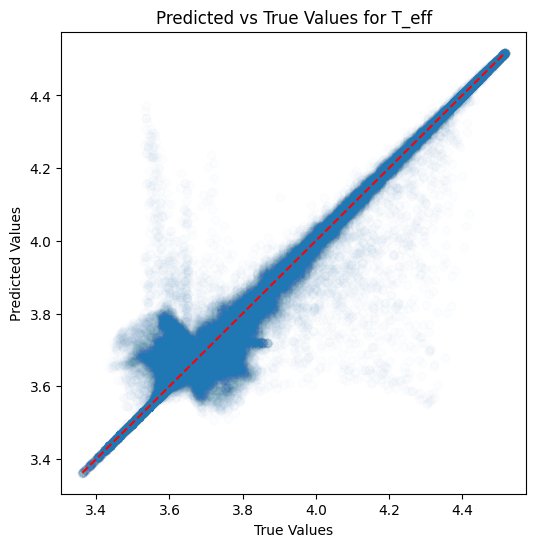

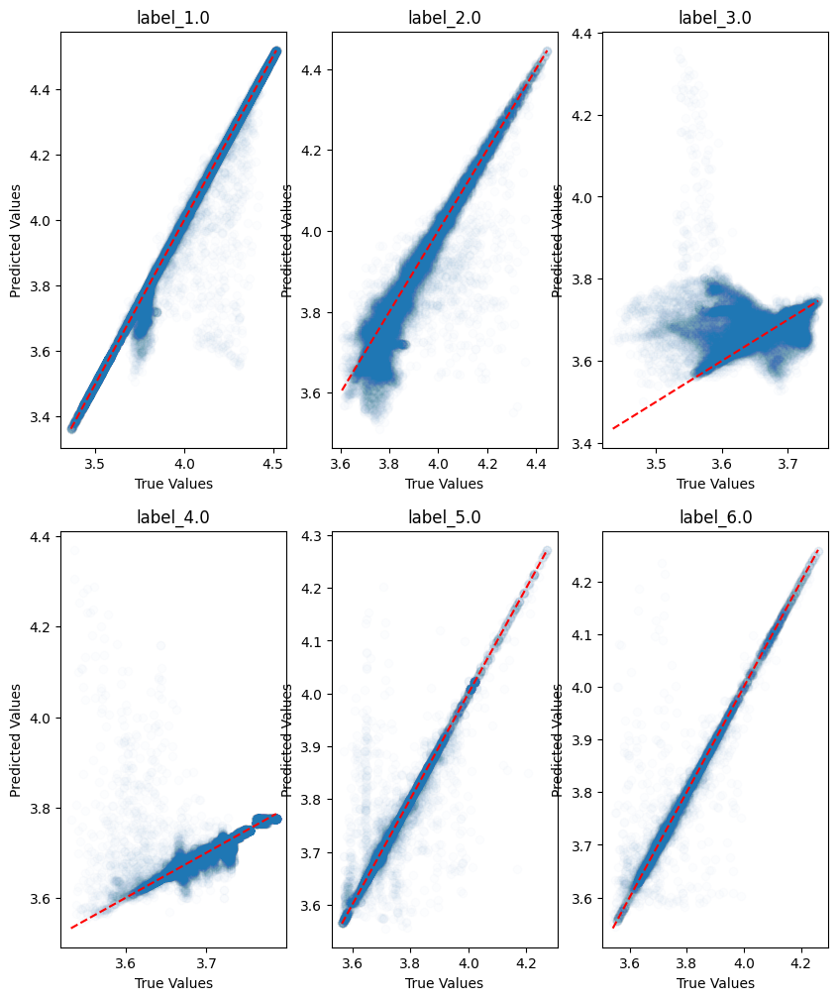

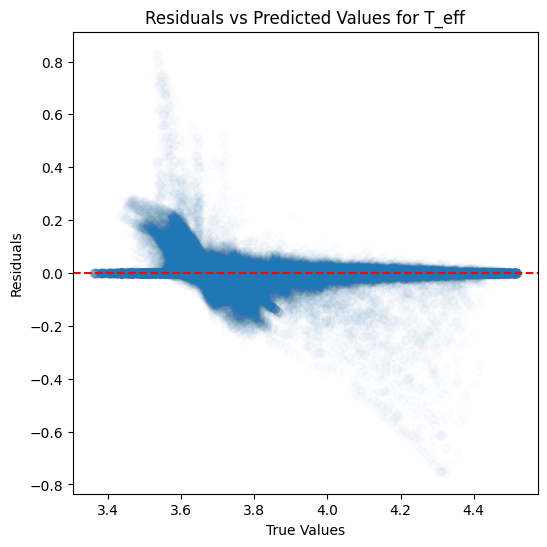

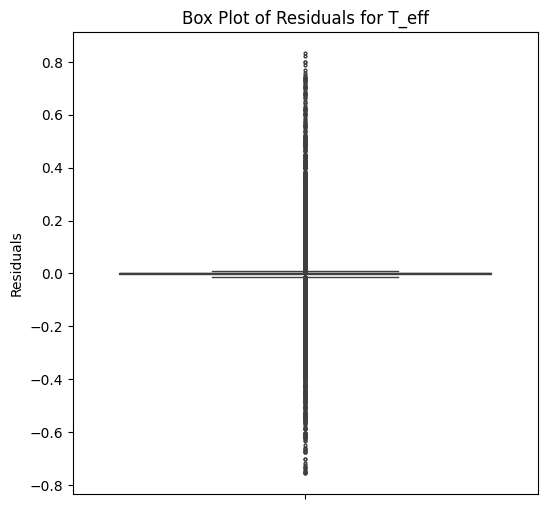

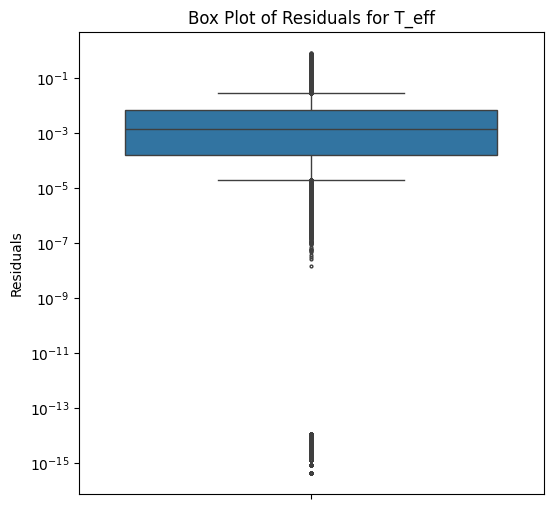

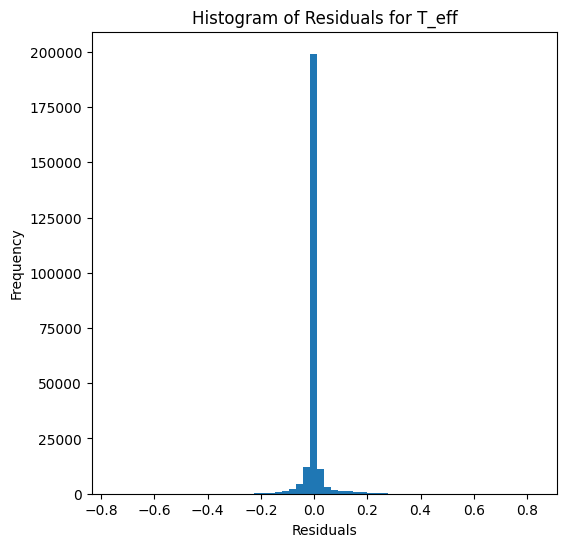

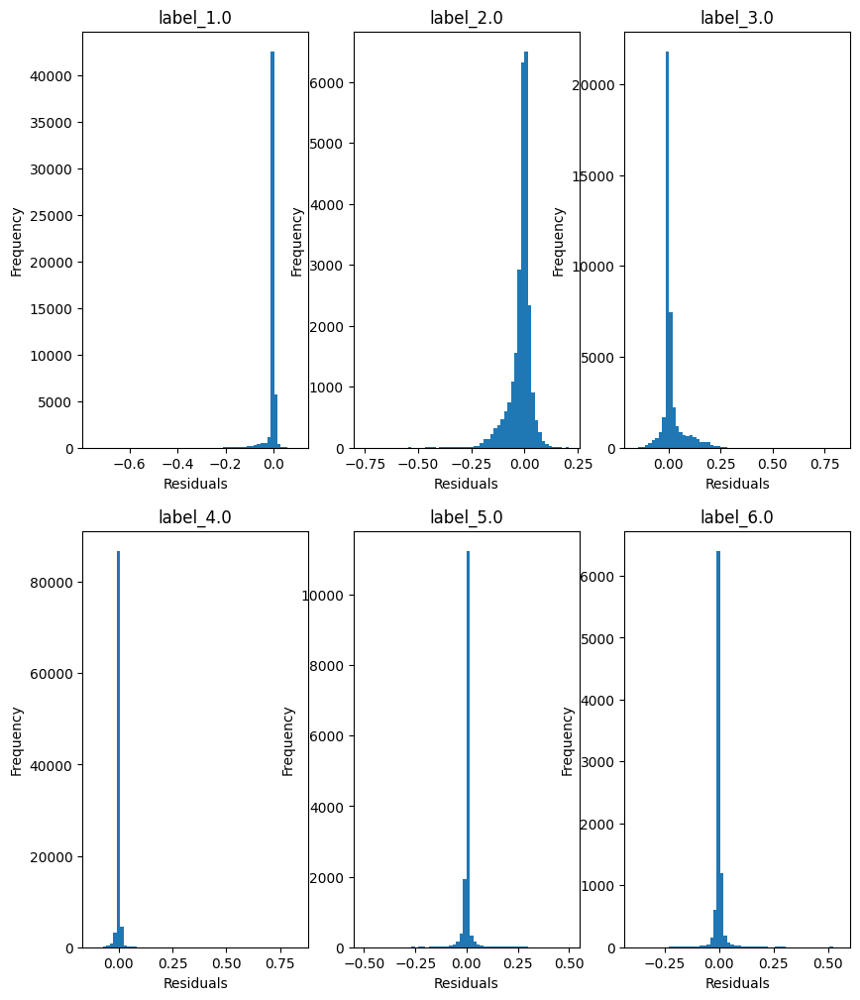

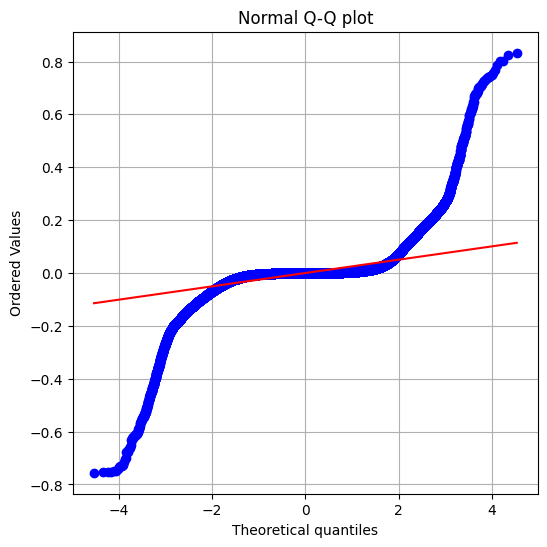

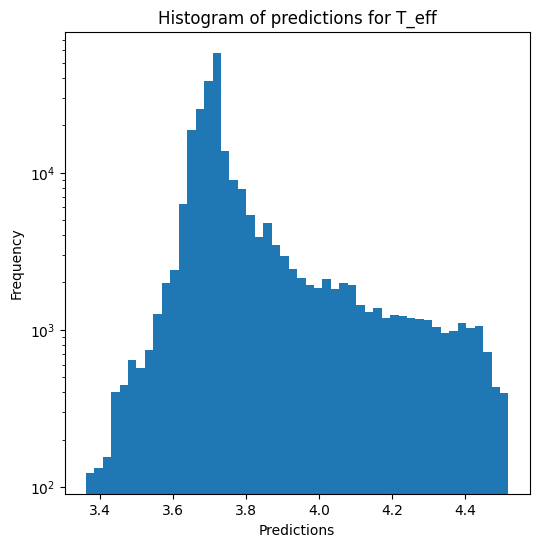

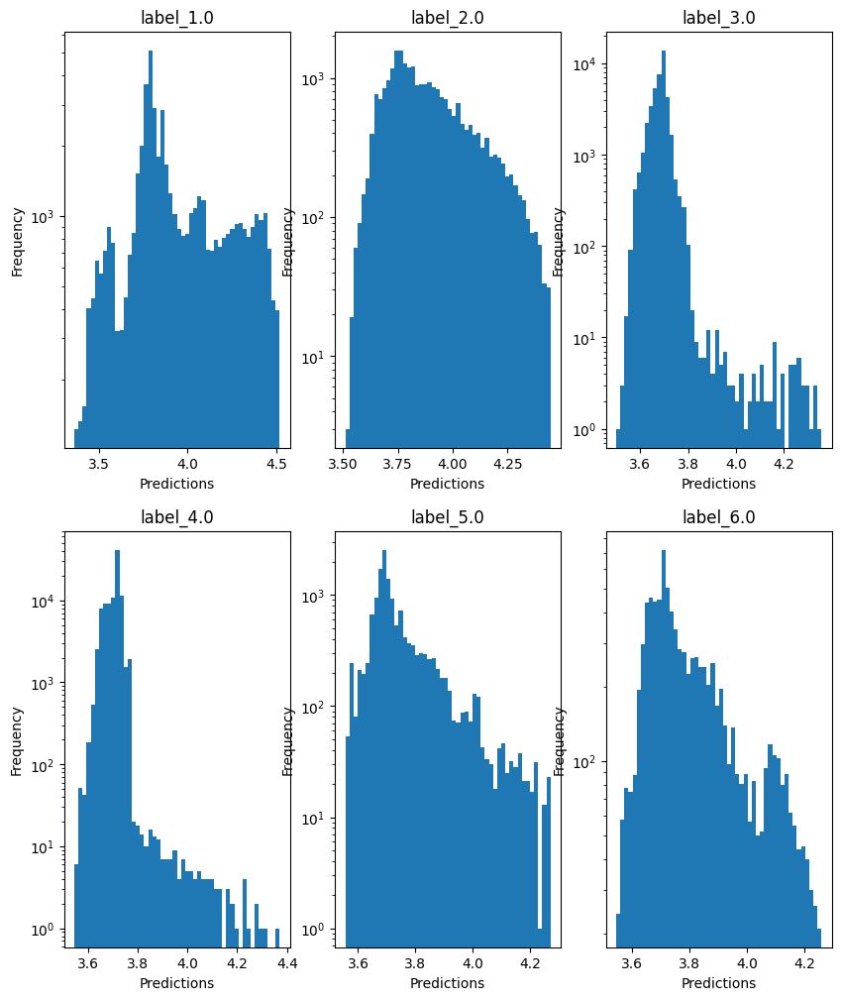


log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  0.18131509921027356
  RMSE :  0.3142583420044199
  MAE :  0.06998160260816576
  MedAE :  0.0009920476190470318
  CORR :  0.77756232439253
  MAX_ER :  4.189954617445152
  Percentiles : 
    75th percentile :  0.006819999999999382
    90th percentile :  0.04899564285714231
    95th percentile :  0.32543494184731936
    99th percentile :  1.738849271870746

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.4629207374972585
  RMSE :  0.6319646056886508
  MAE :  0.28895931149977017
  MedAE :  0.06777969841269682
  CORR :  0.7375860413277311
  MAX_ER :  3.6409299999999996
  Percentiles : 
    75th percentile :  0.19421144665162454
    90th percentile :  1.0225894133198137
    95th percentile :  1.6658248833333305
    99th percentile :  2.6527110966666694

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3.823
  RV

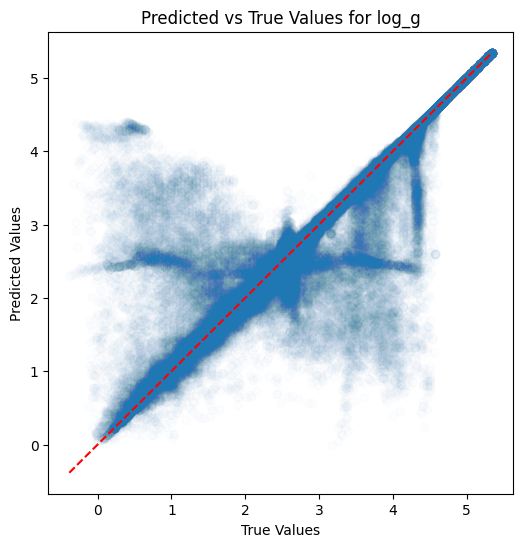

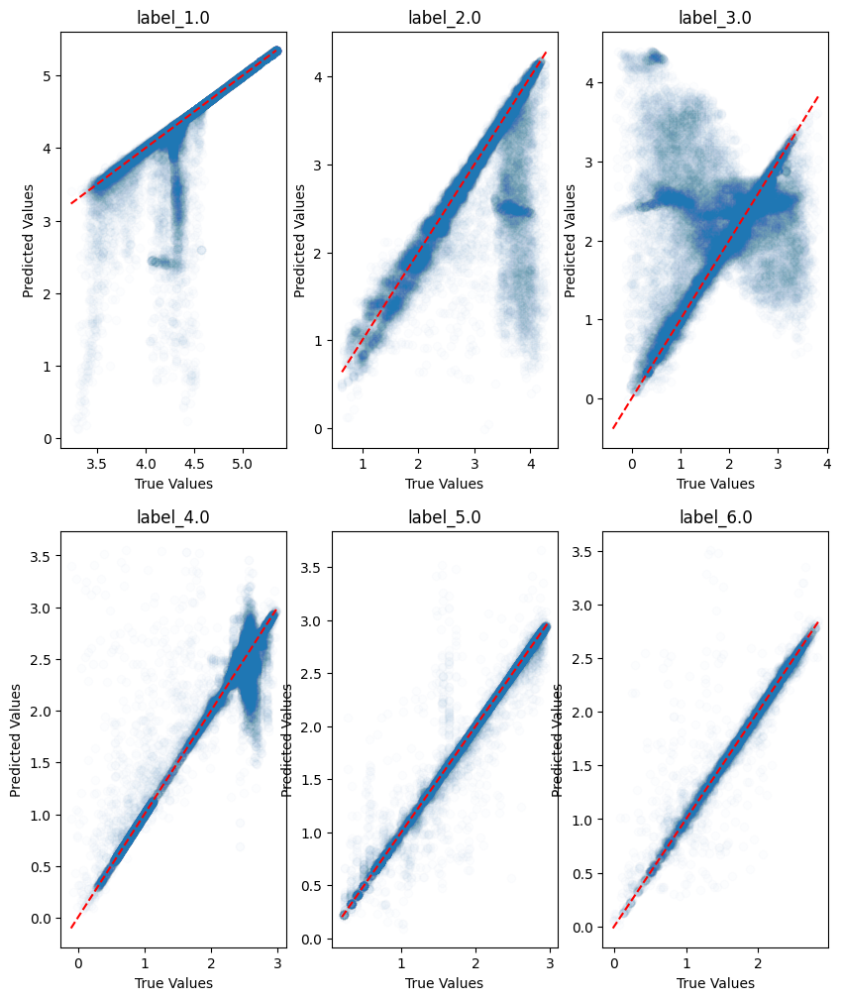

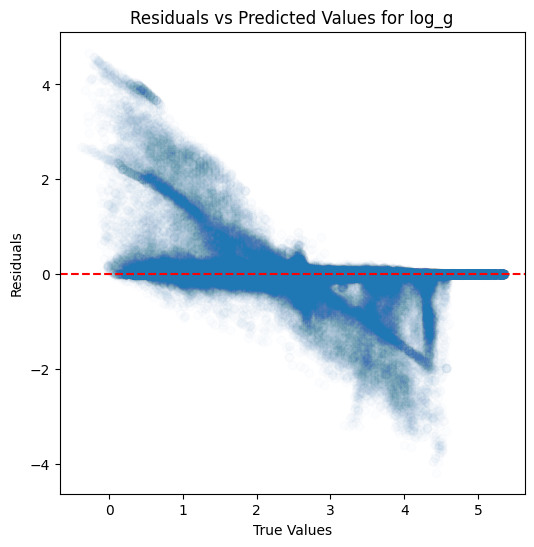

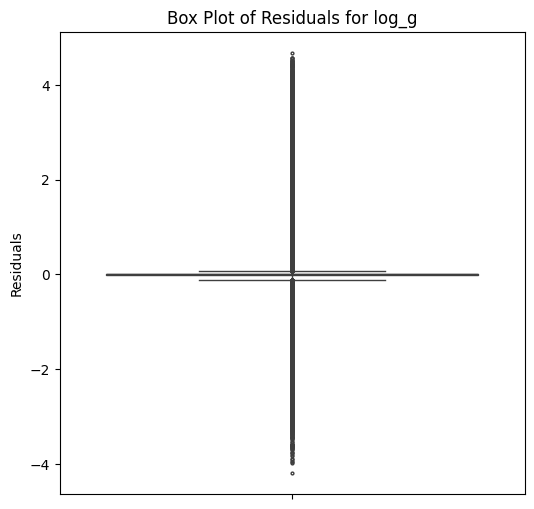

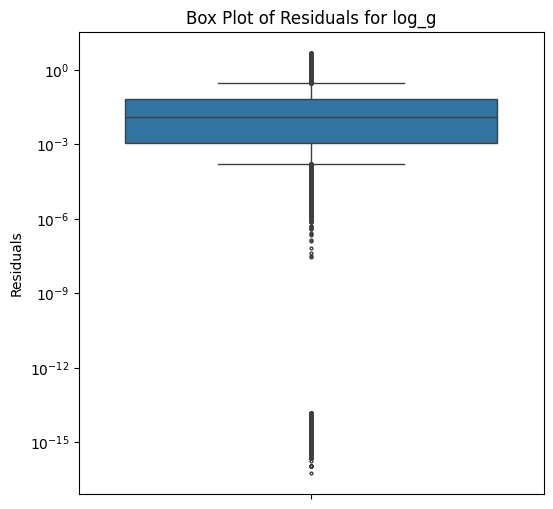

...

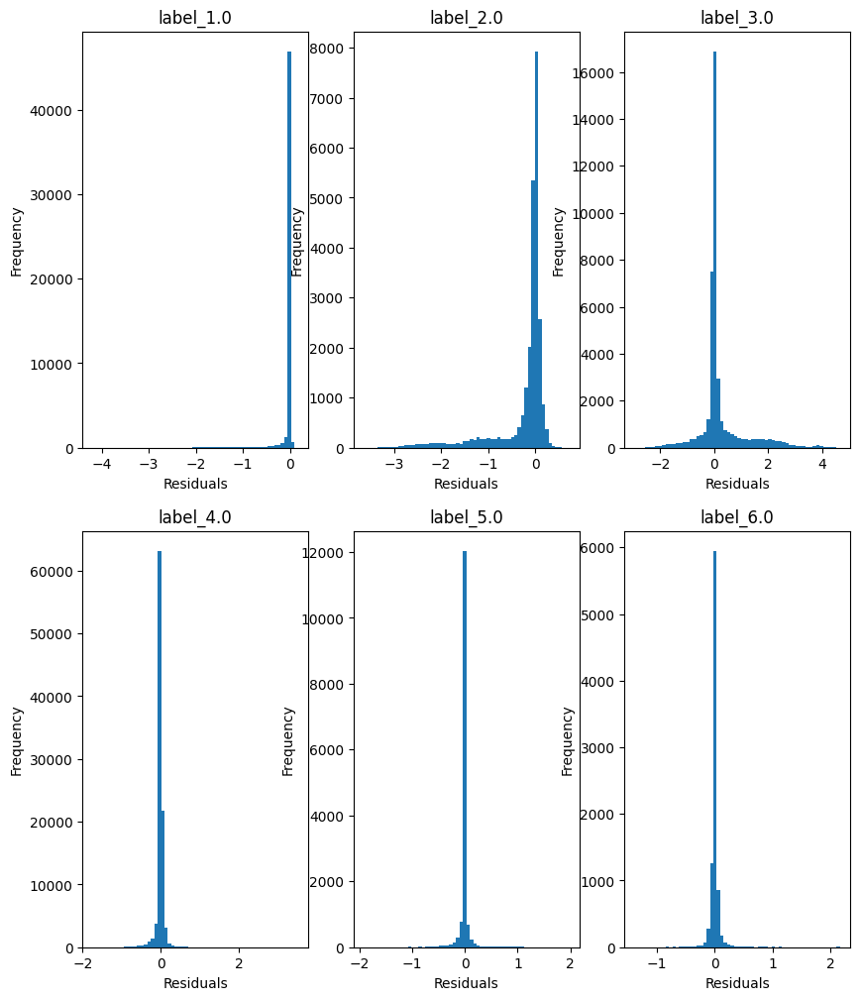

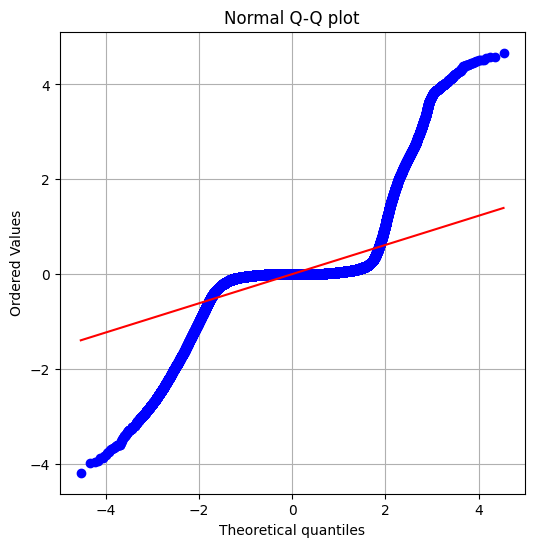

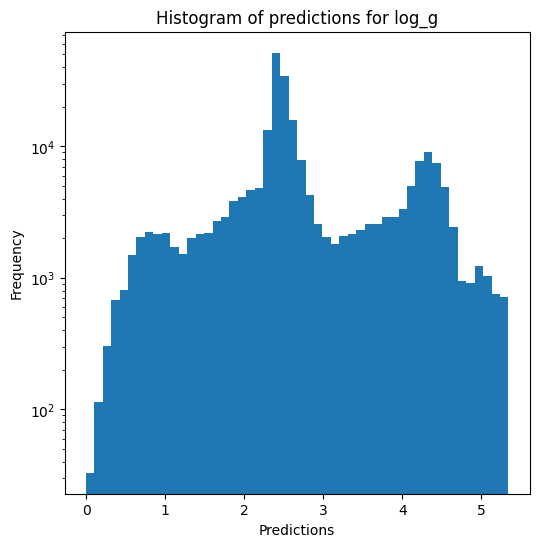

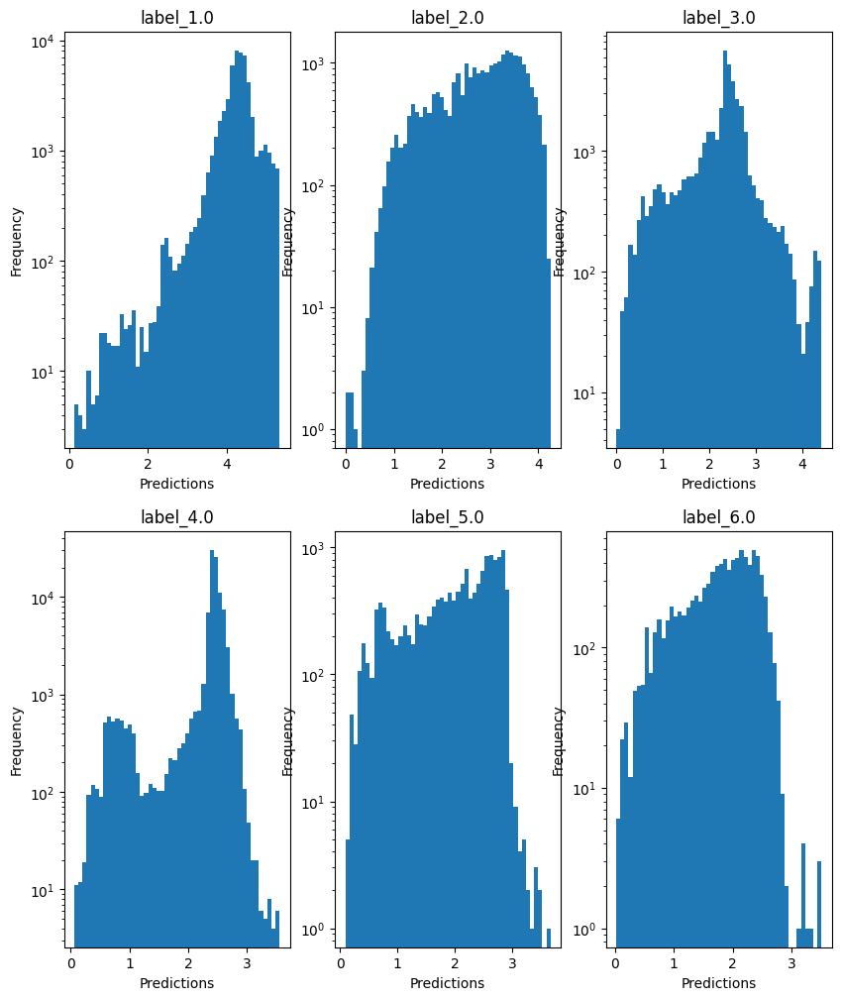

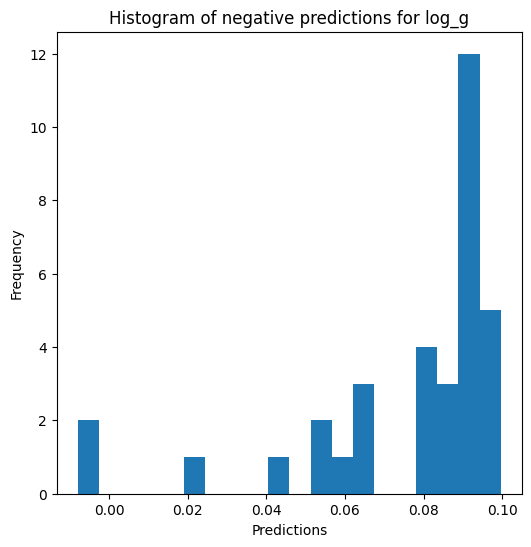


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.8235812198711056
  RMSE :  0.15730017690223663
  MAE :  0.035193774856779055
  MedAE :  0.0005751935572170519
  CORR :  0.9235477498585641
  MAX_ER :  2.0949301694646723
  Percentiles : 
    75th percentile :  0.003945280861376577
    90th percentile :  0.025091513829692588
    95th percentile :  0.16285821399510098
    99th percentile :  0.8695289321537368

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.7072693846664545
  RMSE :  0.3159936611338401
  MAE :  0.14453132324286905
  MedAE :  0.033943876693591224
  CORR :  0.8451413223751987
  MAX_ER :  1.8203615300868687
  Percentiles : 
    75th percentile :  0.09712049540367407
    90th percentile :  0.5110826434305455
    95th percentile :  0.8334145261705098
    99th percentile :  1.3260238417409307

radius results for the label cat

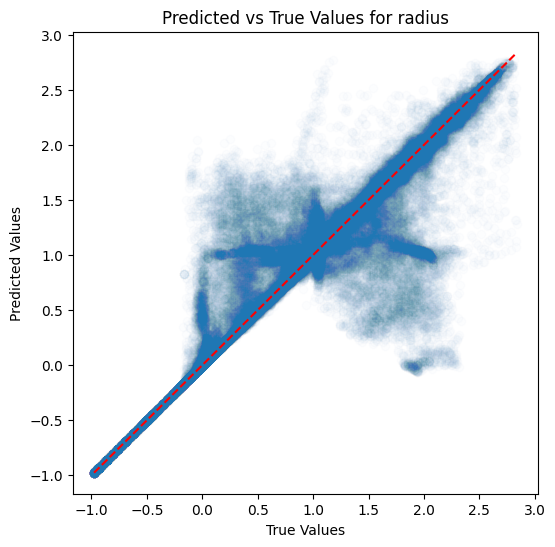

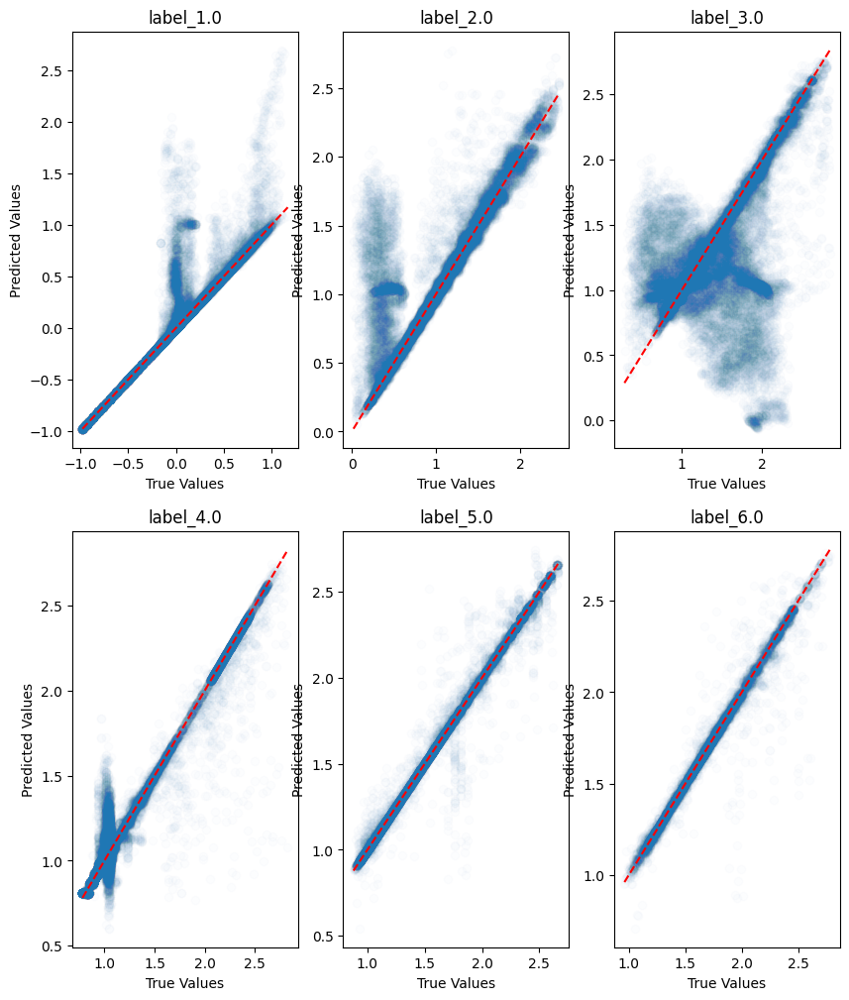

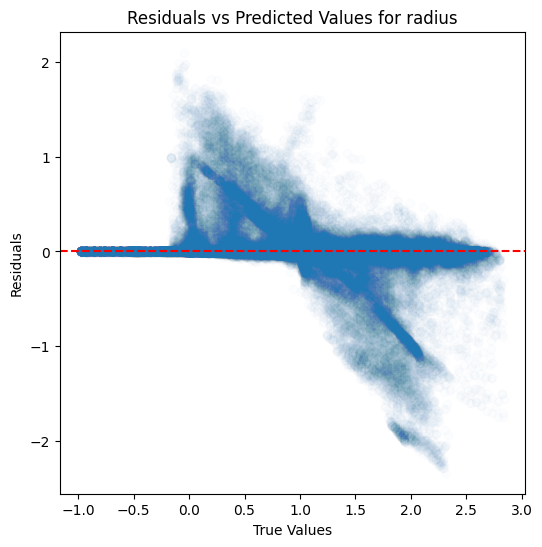

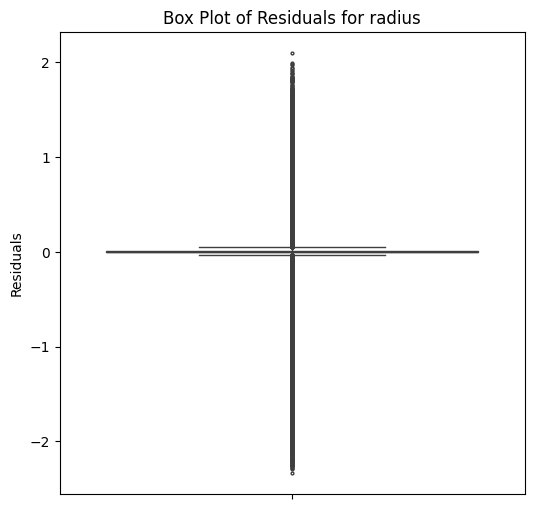

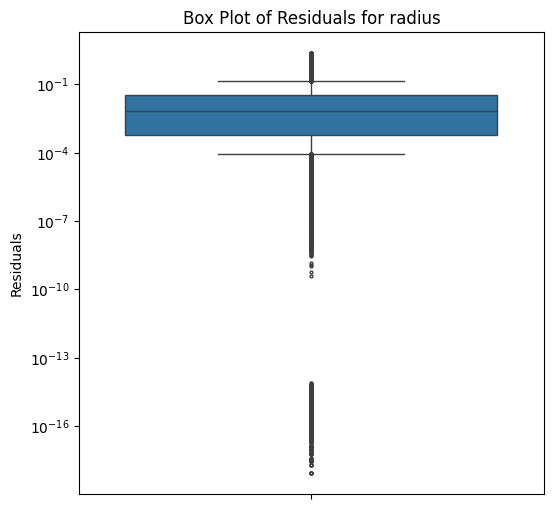

...

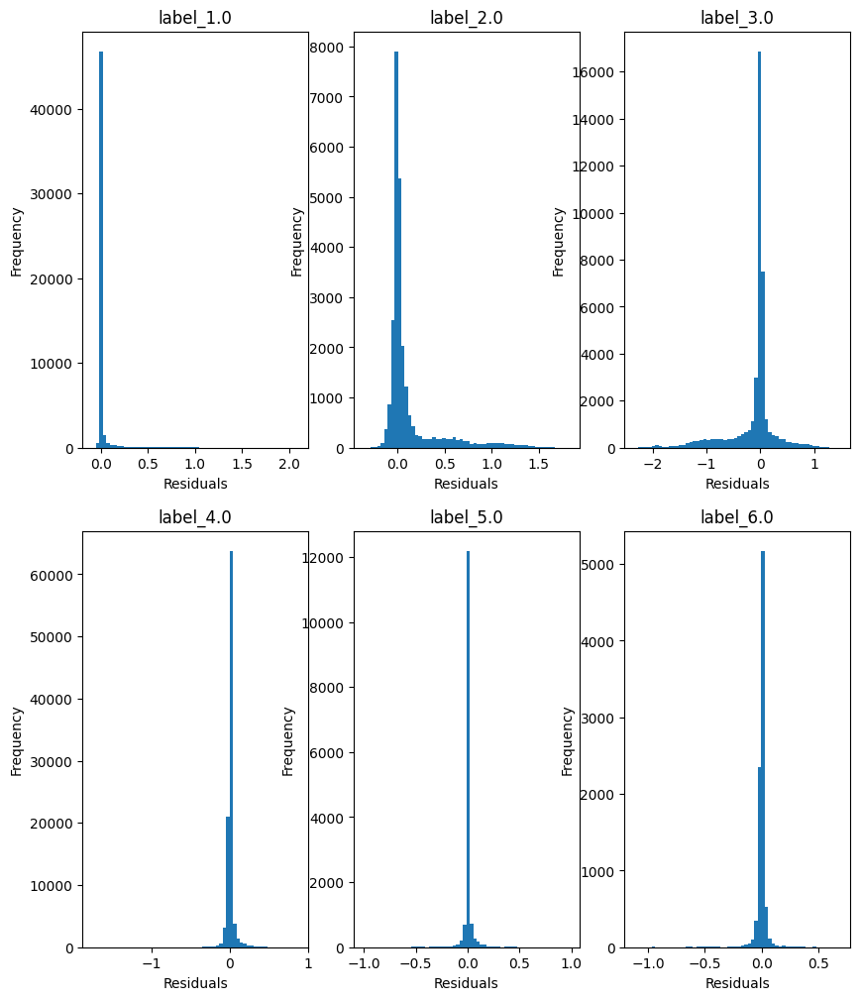

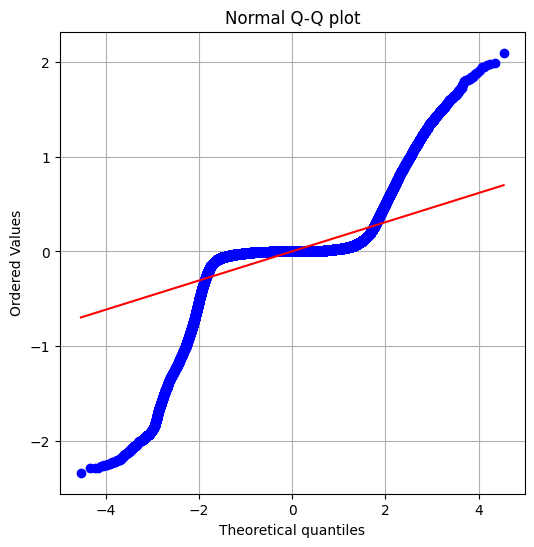

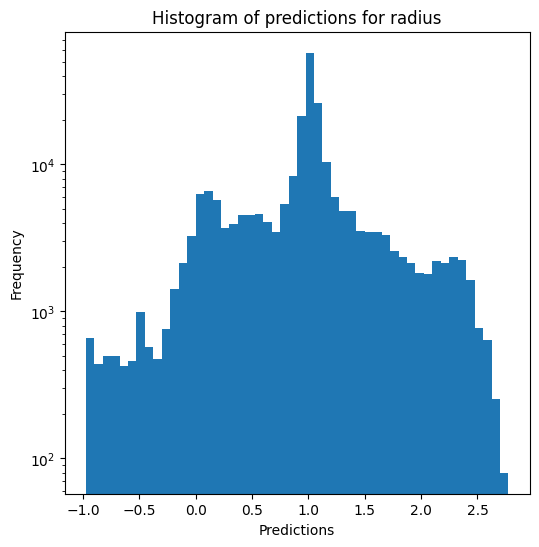

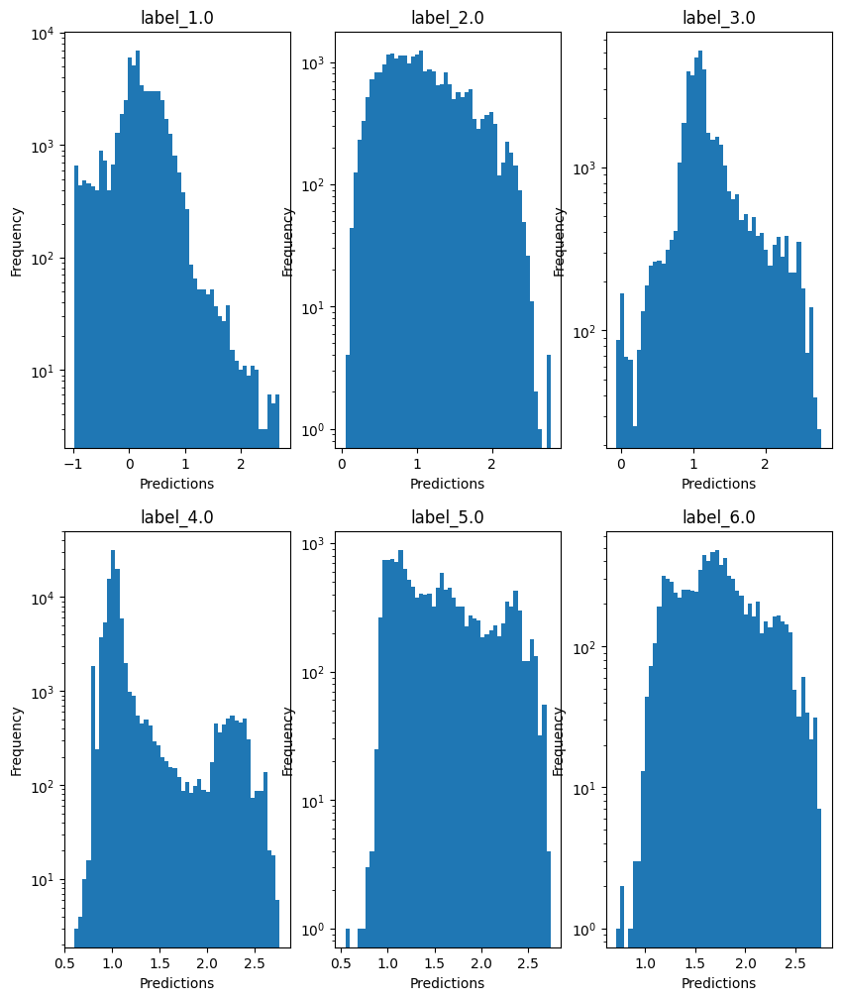

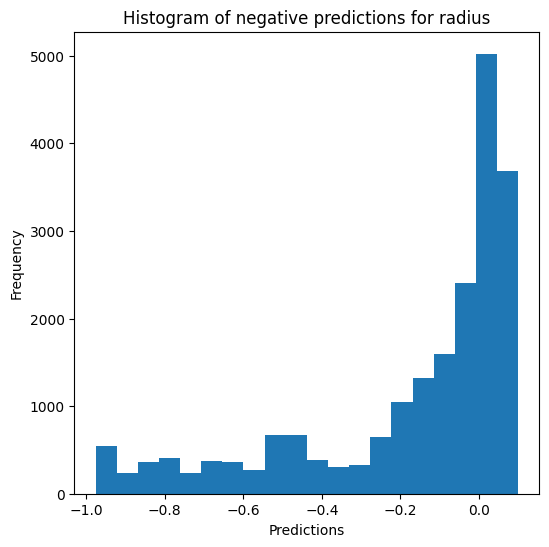

Saving predictions and results...


In [17]:
rf_evaluator.evaluate_Kfold_results(RandomForestRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)
# average depth de 44-46

### XGBoost

In [18]:
xgb_evaluator = Model_evaluator("xgboost", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 2 3 4 5 6 7 8 9 10 
Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.9035438101538388
  RMSE :  0.08962926996366931
  MAE :  0.04370062094663365
  MedAE :  0.016440191650390457
  CORR :  0.9513542801799472
  MAX_ER :  0.6862123130798343
  Percentiles : 
    75th percentile :  0.045224884605407745
    90th percentile :  0.09852901439666728
    95th percentile :  0.19257690420150775
    99th percentile :  0.4450410458564756

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.2421346697916199
  RMSE :  0.16346869278380277
  MAE :  0.12303096453821297
  MedAE :  0.08958496551513662
  CORR :  0.5078146897498674
  MAX_ER :  0.6752104206085203
  Percentiles : 
    75th percentile :  0.1702466587066649
    90th percentile :  0.2765139361953734
    95th percentile :  0.352970765609741
    99th

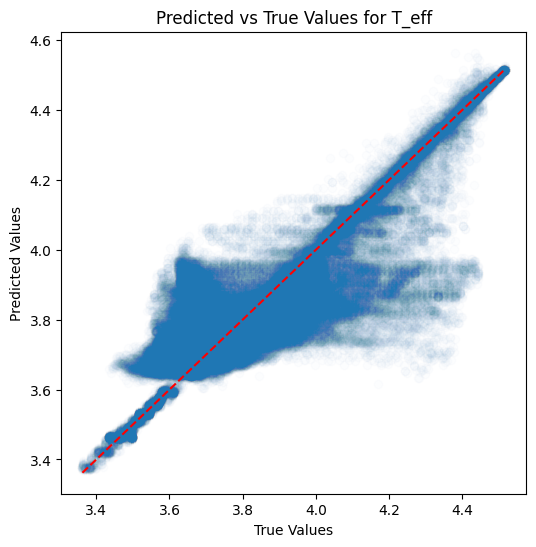

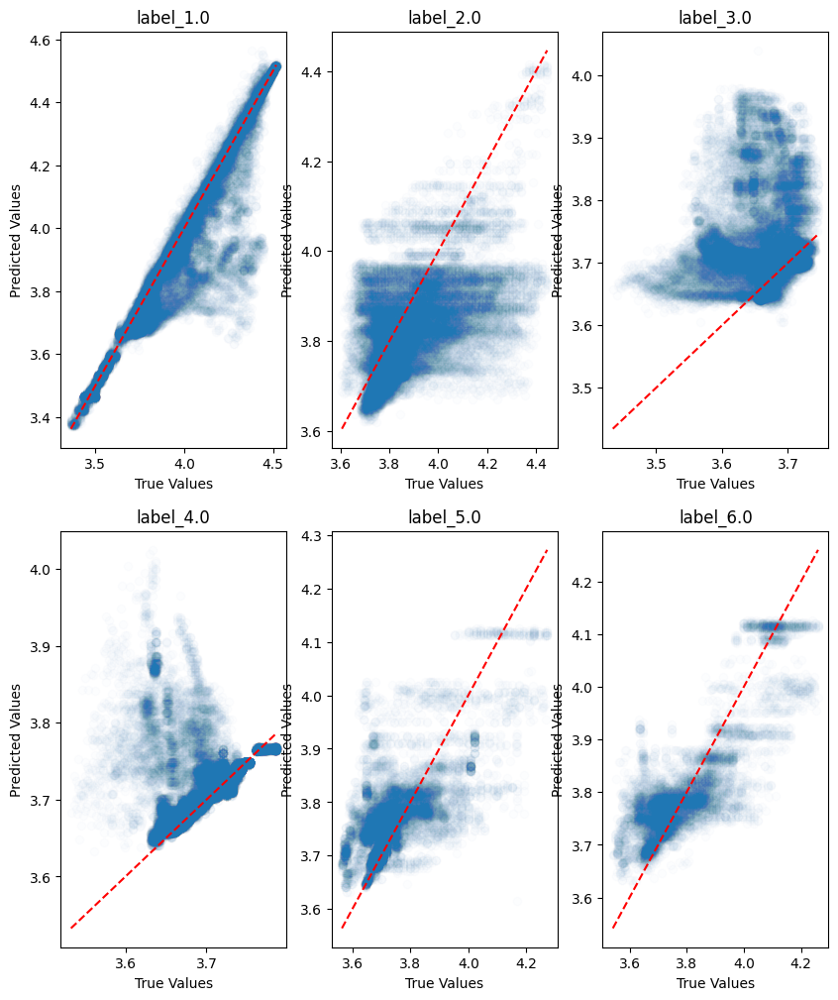

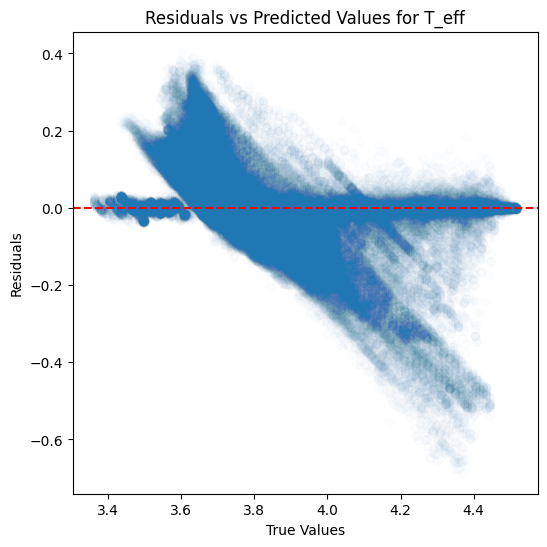

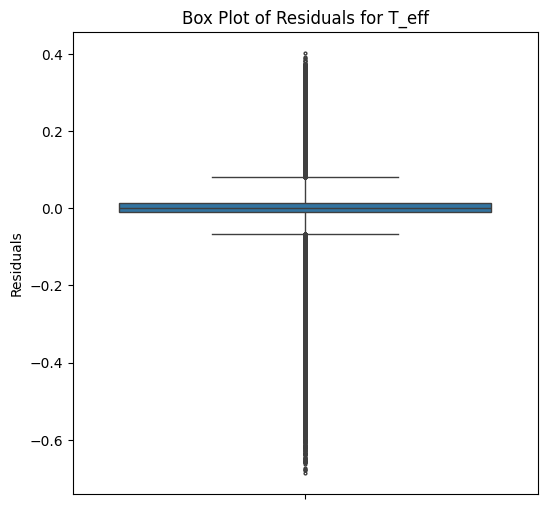

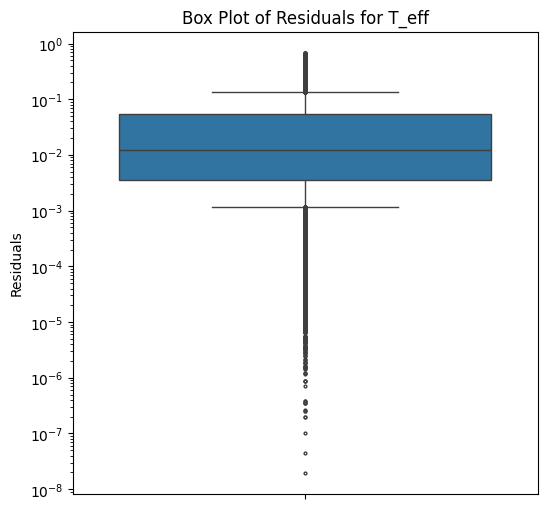

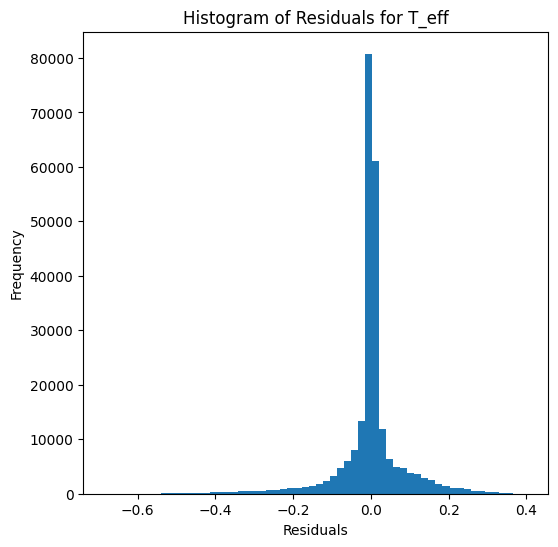

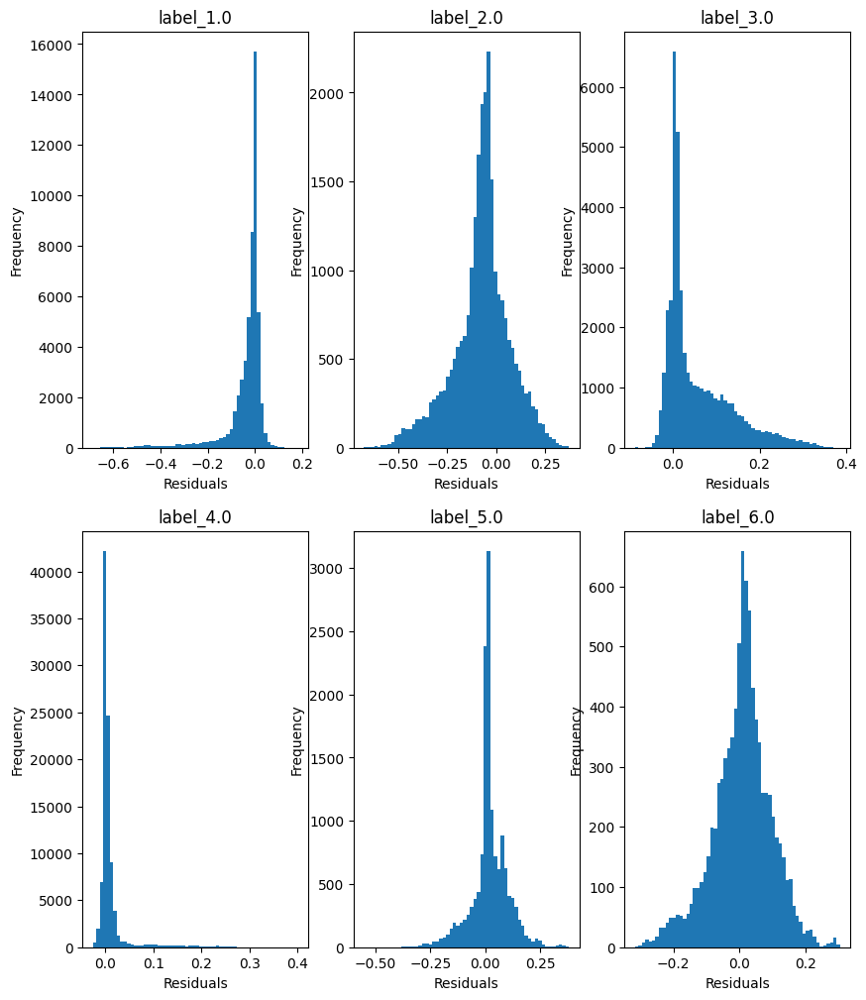

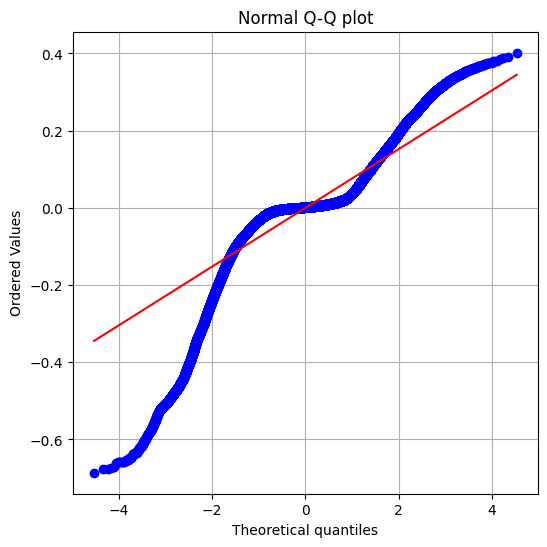

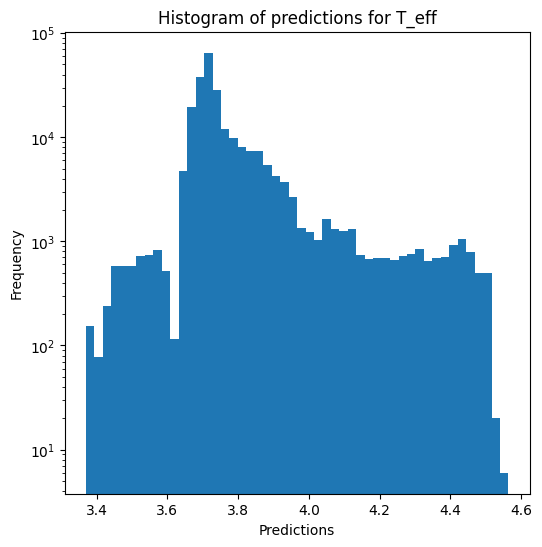

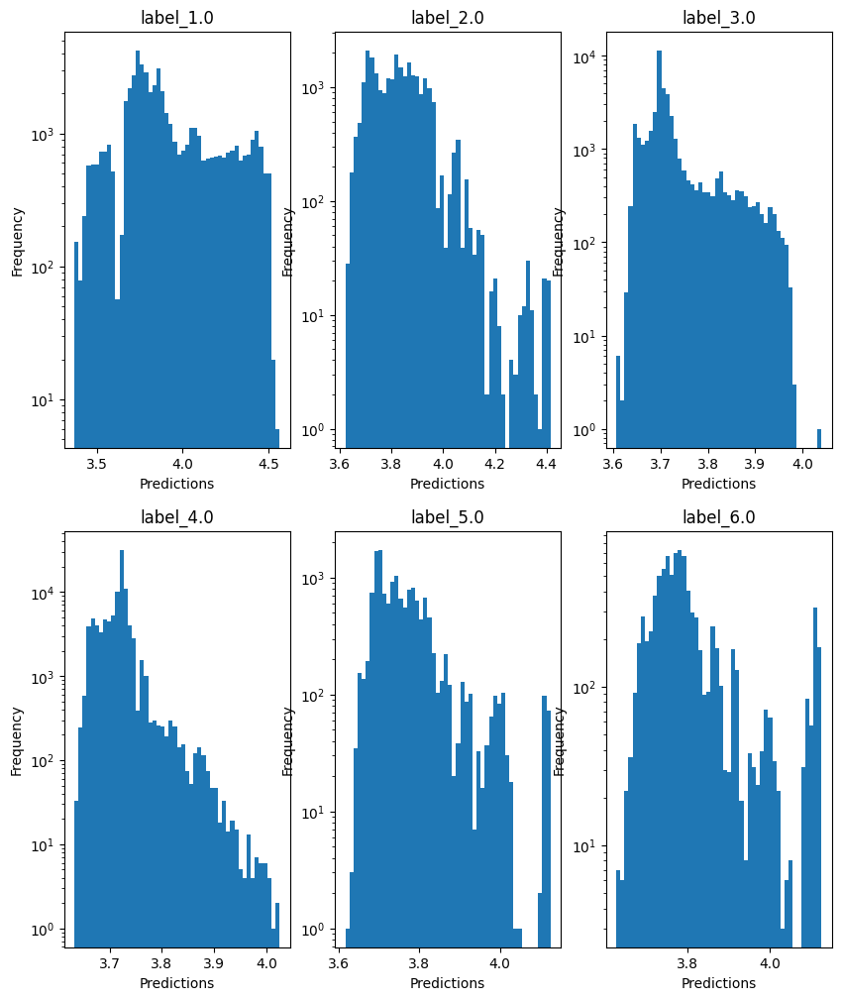

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -1.0124875678765508
  RMSE :  0.55356010503011
  MAE :  0.31917765404091575
  MedAE :  0.09096437835693338
  CORR :  0.8095818883794095
  MAX_ER :  3.585430902481079
  Percentiles : 
    75th percentile :  0.43346804285049434
    90th percentile :  1.0305067501068115
    95th percentile :  1.3427274727821352
    99th percentile :  1.9014077968597407

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.35000992847659496
  RMSE :  0.832163042077831
  MAE :  0.6713615037908816
  MedAE :  0.5849574146270751
  CORR :  0.6120898372154866
  MAX_ER :  2.695528434753418
  Percentiles : 
    75th percentile :  1.027788136482239
    90th percentile :  1.346304877948761
    95th percentile :  1.5365631968736644
    99th percentile :  1.9933264728260045

log_g results for the label category with a value of 3.0
  value range :  -0.384 - 3

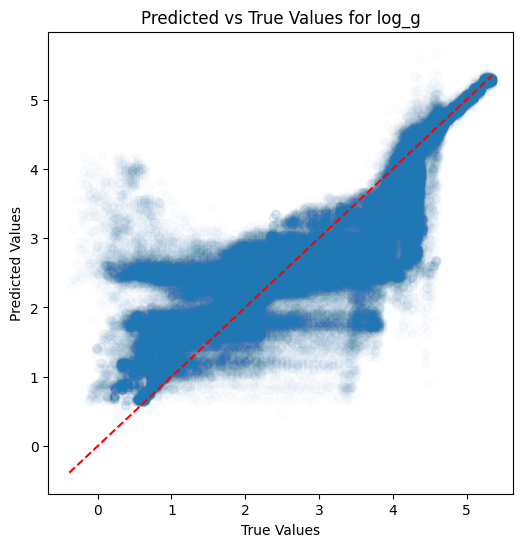

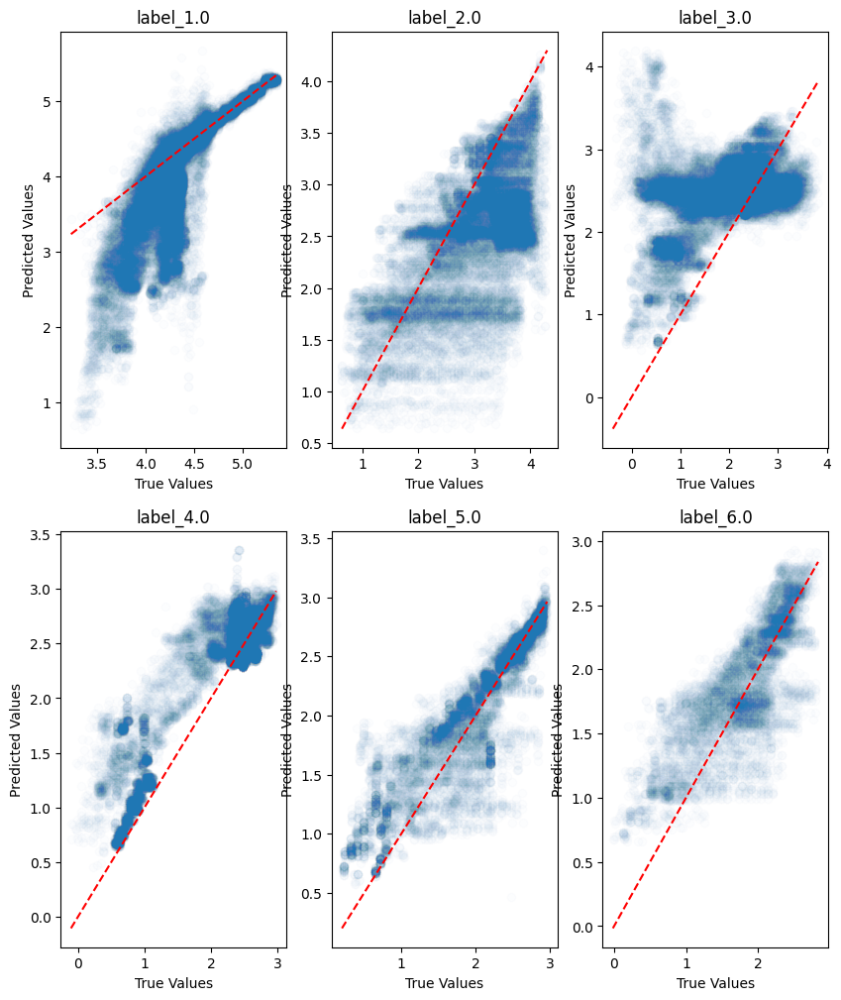

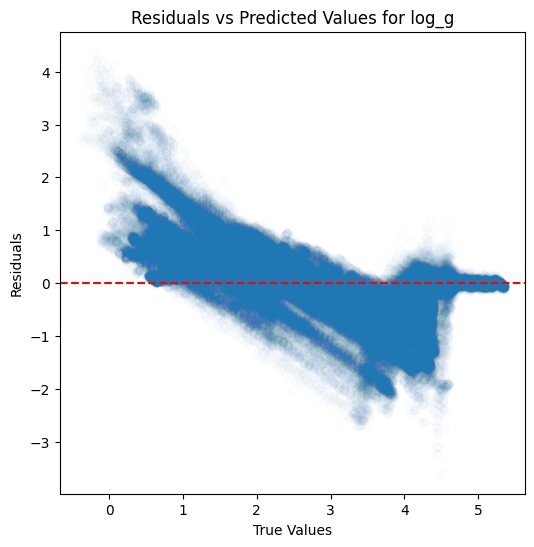

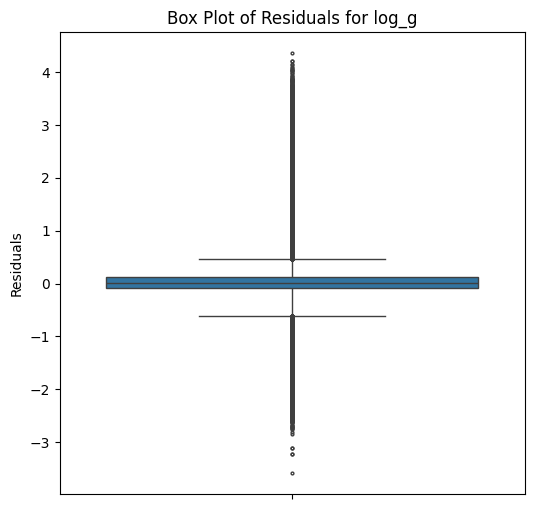

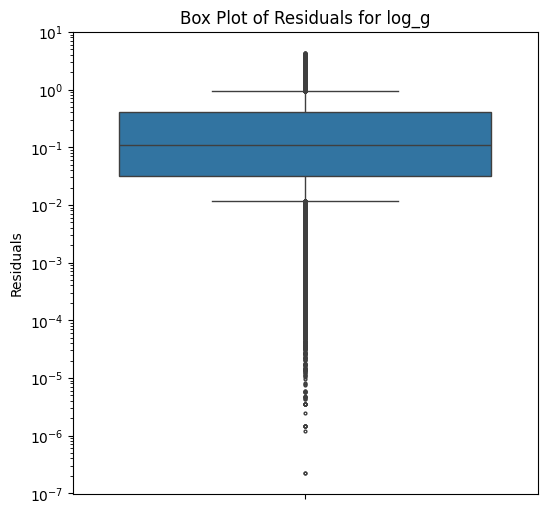

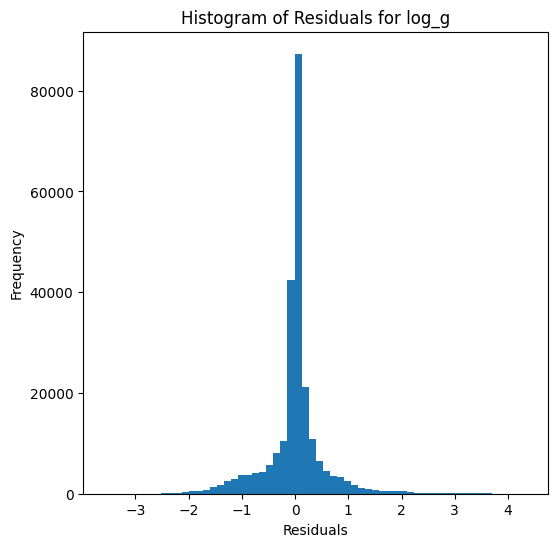

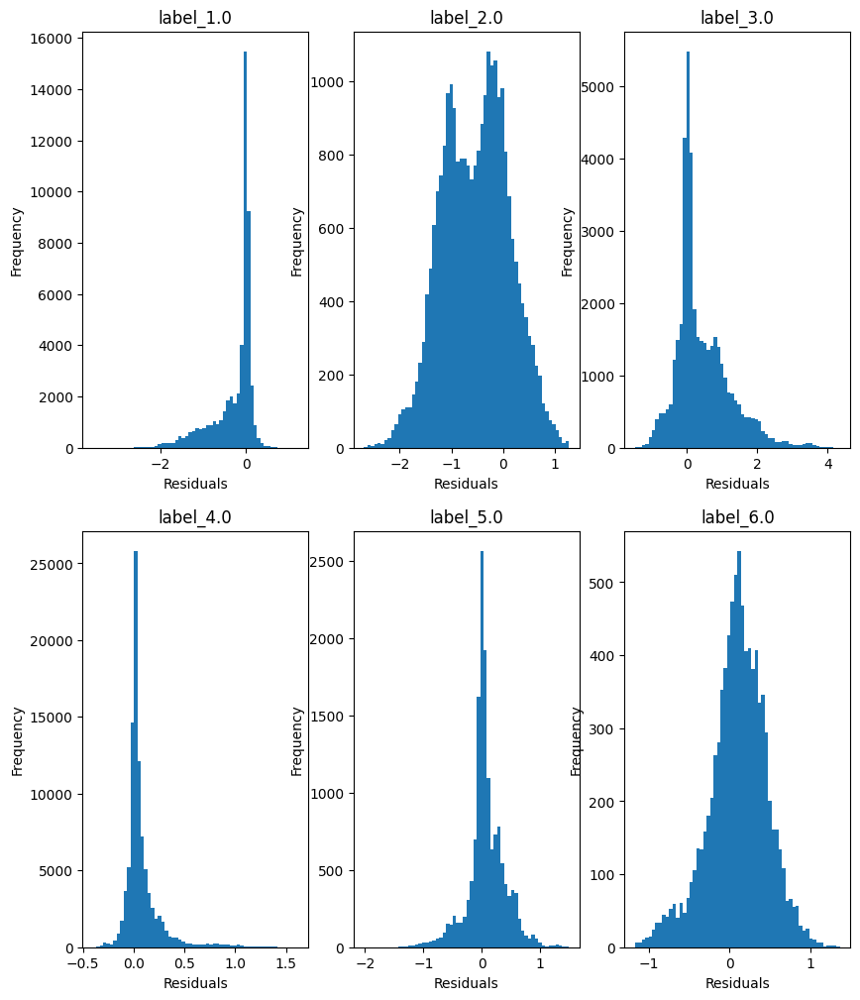

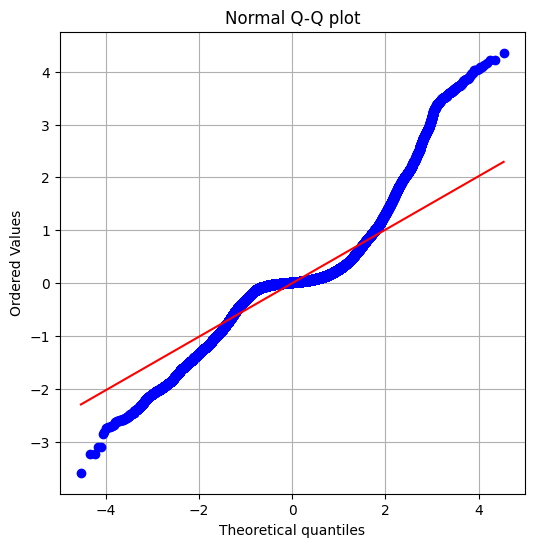

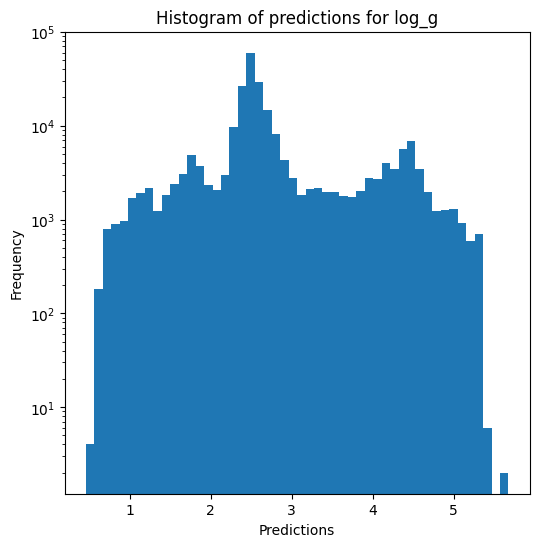

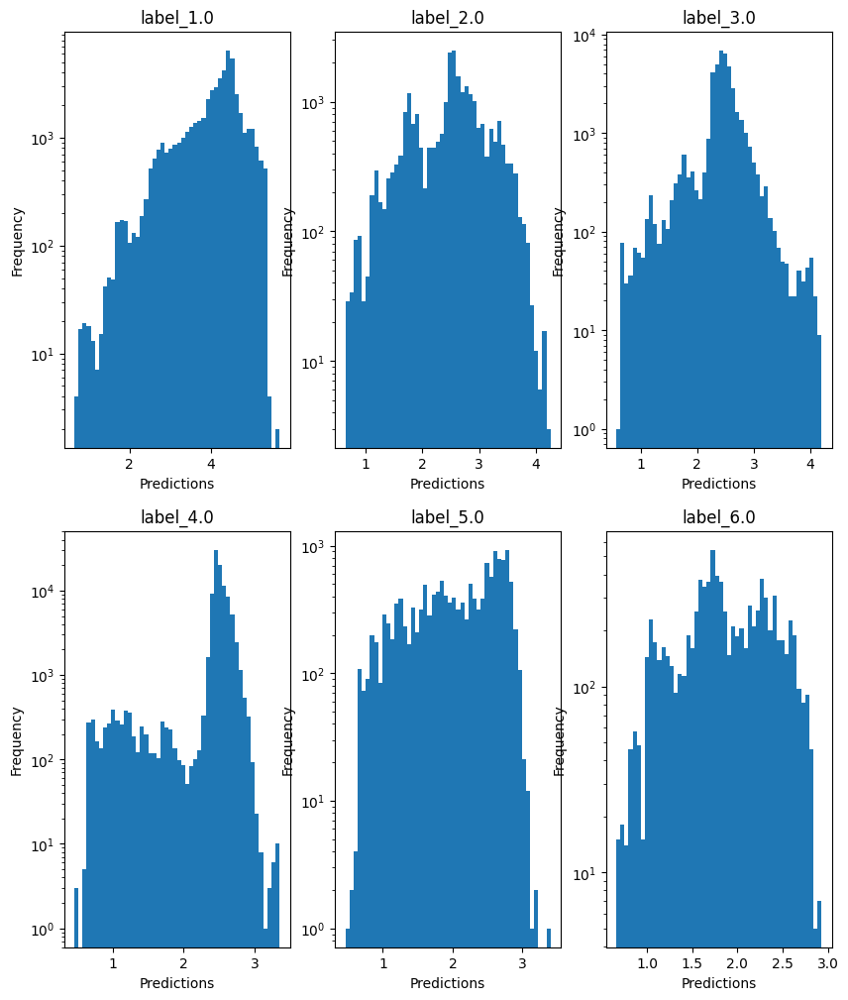


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.5662612193213132
  RMSE :  0.2767403003739343
  MAE :  0.16067151495024773
  MedAE :  0.05116864033877122
  CORR :  0.8825965510893421
  MAX_ER :  1.7067418181404244
  Percentiles : 
    75th percentile :  0.2120421031572626
    90th percentile :  0.515081469024655
    95th percentile :  0.6689247800751339
    99th percentile :  0.9576118802001651

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.6440509775938494
  RMSE :  0.41744405306674026
  MAE :  0.3365678257047855
  MedAE :  0.2929446210015452
  CORR :  0.8027978602985453
  MAX_ER :  1.3726508129754227
  Percentiles : 
    75th percentile :  0.5157462796483268
    90th percentile :  0.6751058382801288
    95th percentile :  0.7715024400169029
    99th percentile :  1.0031695465038724

radius results for the label category with a 

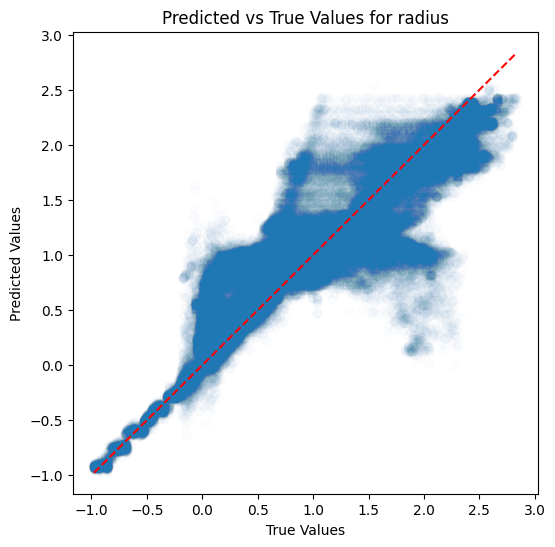

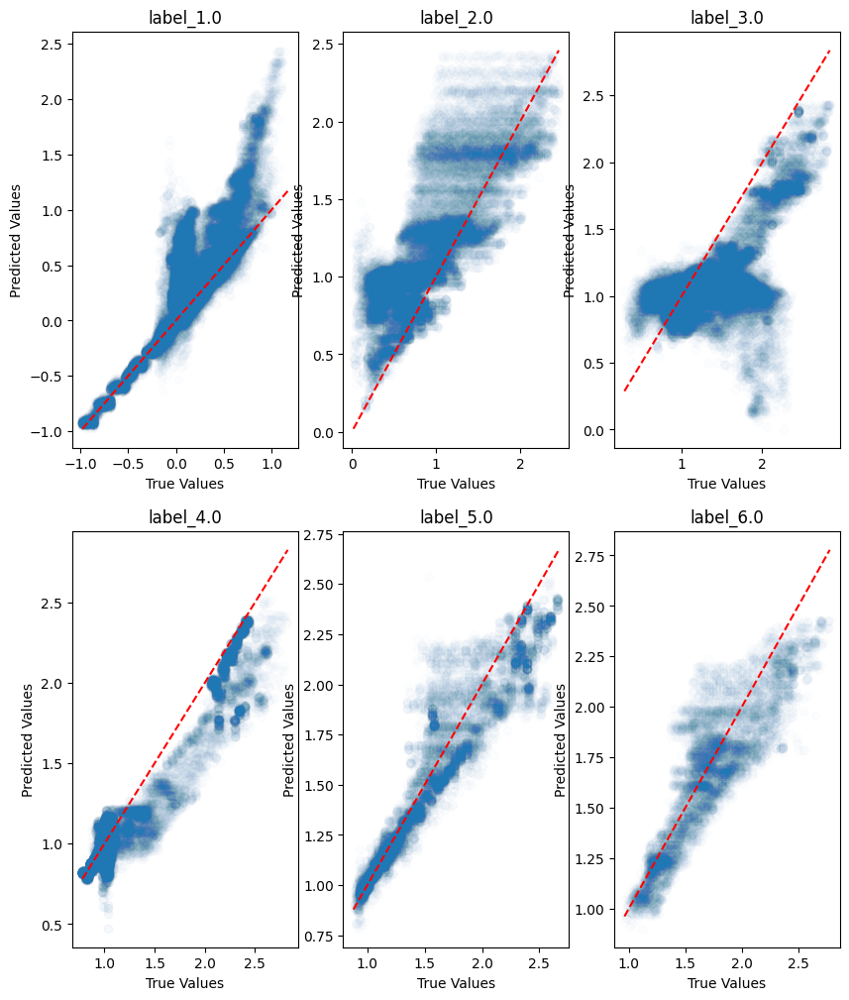

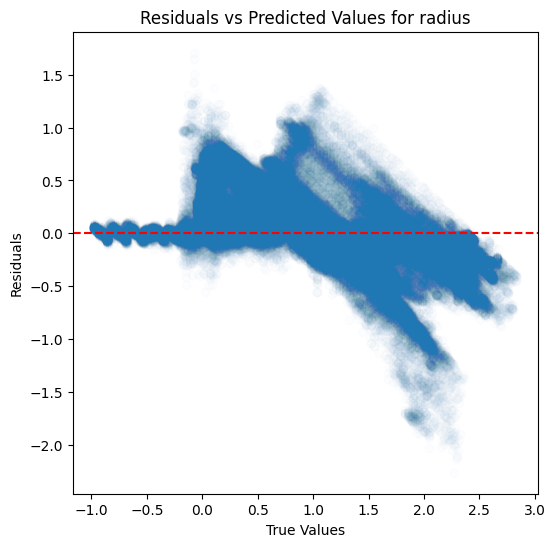

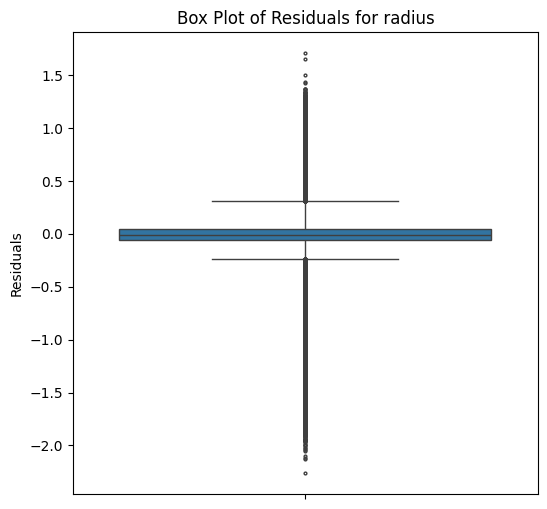

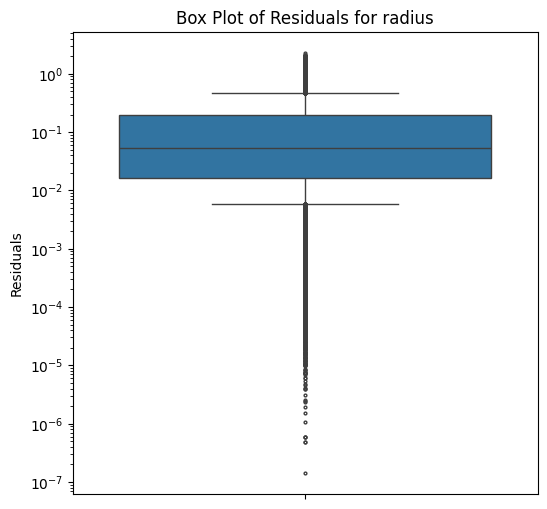

...

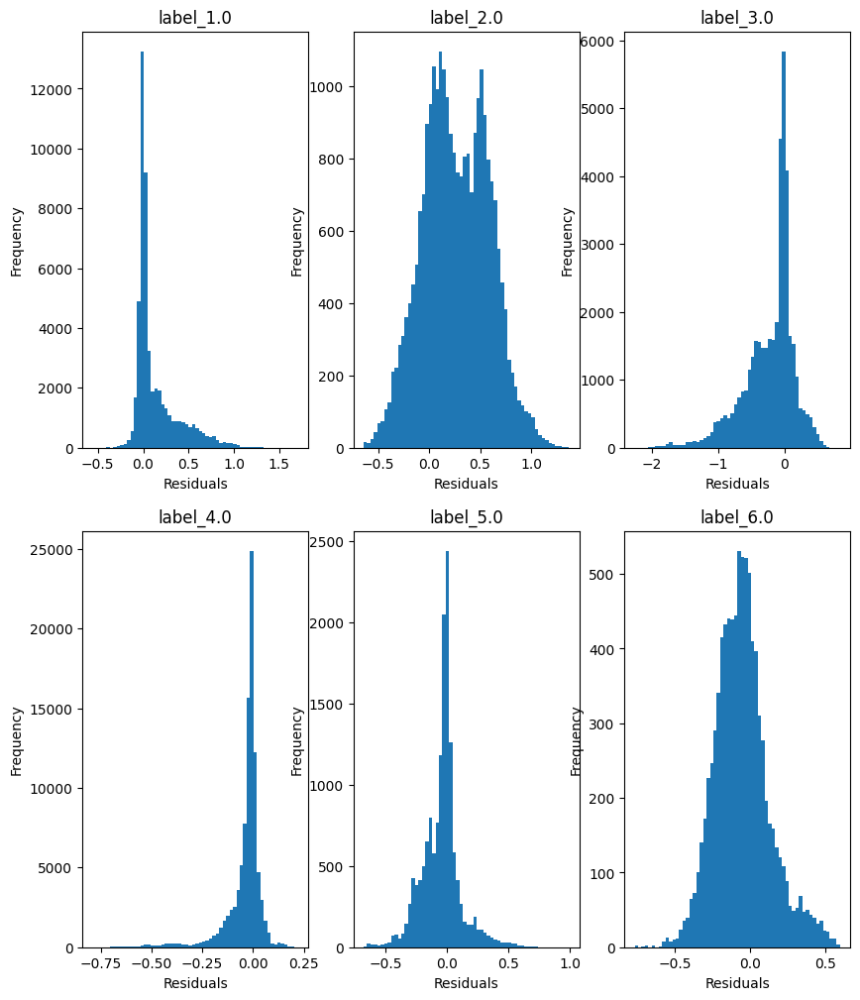

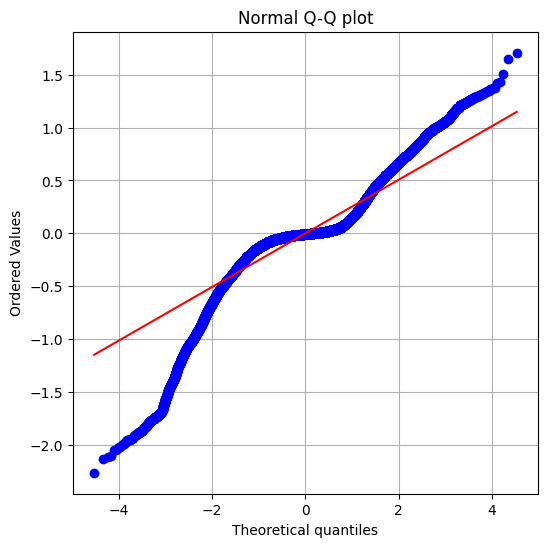

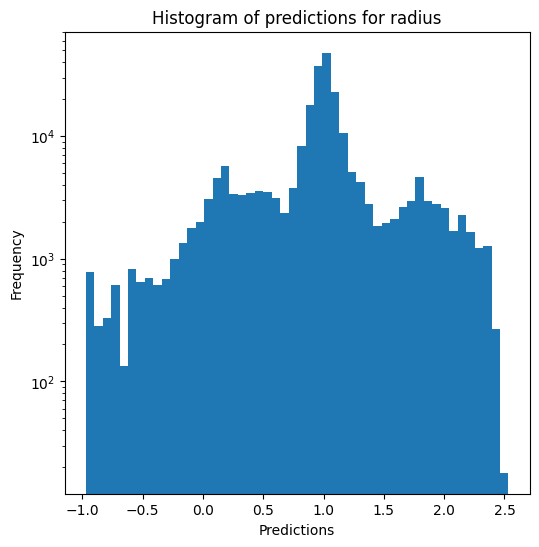

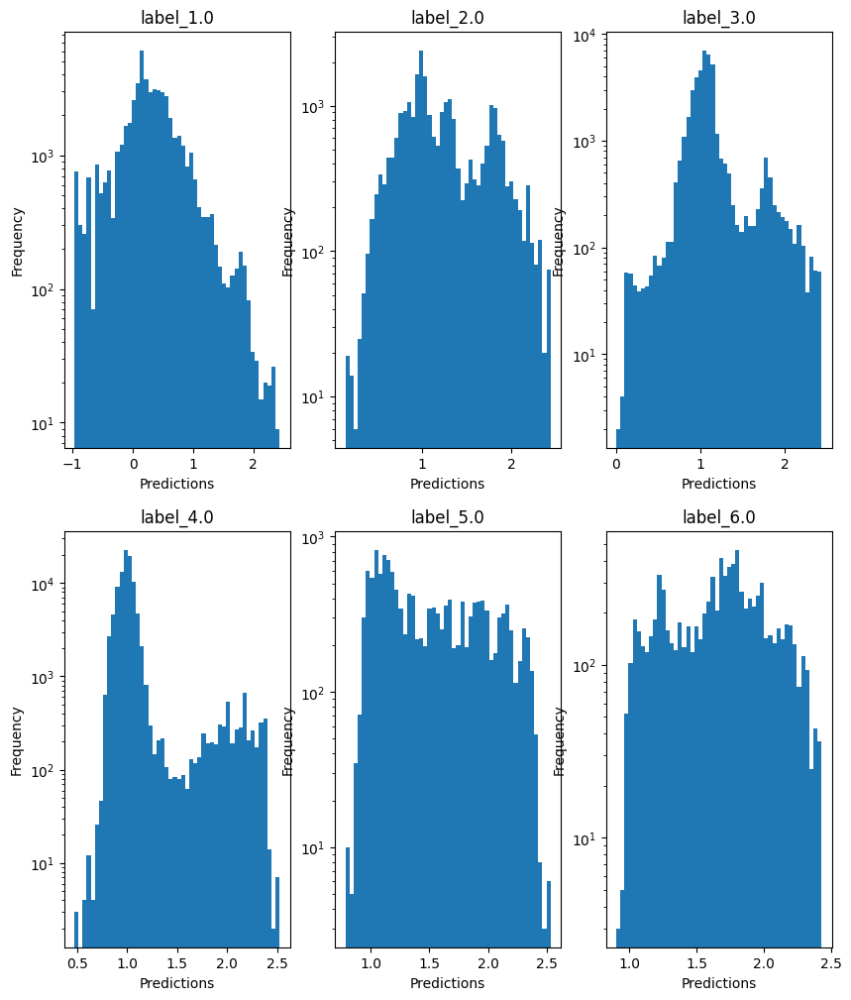

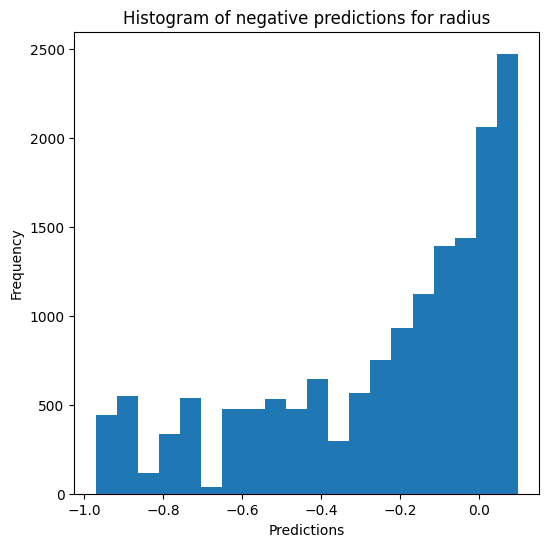

Saving predictions and results...


In [19]:
xgb_evaluator.evaluate_Kfold_results(XGBRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name, n_jobs=5)

### Multi-layer perceptron

In [20]:
mlp_evaluator = Model_evaluator("mlp", path=path_to_results, physical_model=physical_model, output_parameters=output_parameters)


scale_standard train data :
Performing K-fold...
Split 1 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07272151342186607
2 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07381387893486305
3 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07128163811113798
4 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07488693416658218
5 

c:\Users\antoi\Code\unif\MA2\thesis\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:781: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (20) reached and the optimization hasn't converged yet.
  warnings.warn(


0.07370676742107173

Evaluating predictions...
no negative values

T_eff results for the label category with a value of 1.0
  value range :  3.3621 - 4.5177
  RVE :  0.8512614412925299
  RMSE :  0.10752764009393252
  MAE :  0.06339742403424242
  MedAE :  0.04021880805387146
  CORR :  0.9253934532099797
  MAX_ER :  0.7253724167211084
  Percentiles : 
    75th percentile :  0.07353263665680321
    90th percentile :  0.11719923403102794
    95th percentile :  0.20055321894477895
    99th percentile :  0.5176142020464156

T_eff results for the label category with a value of 2.0
  value range :  3.6053 - 4.446
  RVE :  0.10386767581860346
  RMSE :  0.17599379290091238
  MAE :  0.13096835488894448
  MedAE :  0.09817535961956358
  CORR :  0.4014959240596834
  MAX_ER :  0.671904738659781
  Percentiles : 
    75th percentile :  0.1701618842935636
    90th percentile :  0.29788540254476475
    95th percentile :  0.3937215418238182
    99th percentile :  0.5333142188524826

T_eff results for the 

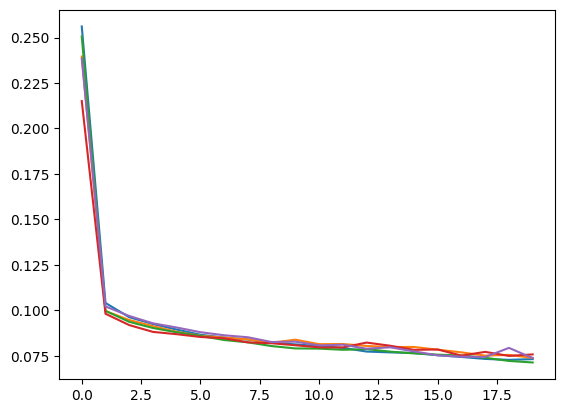

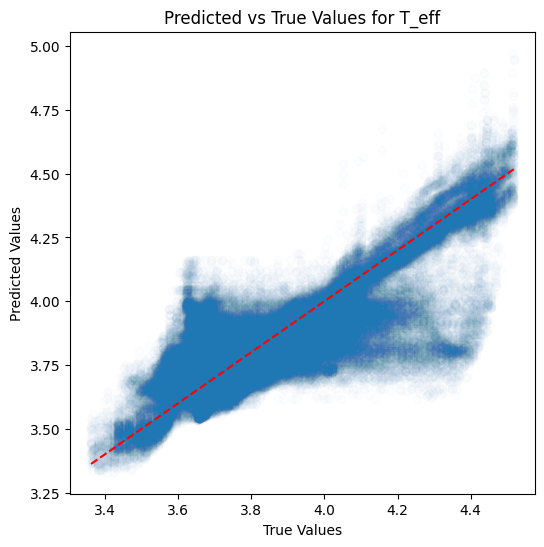

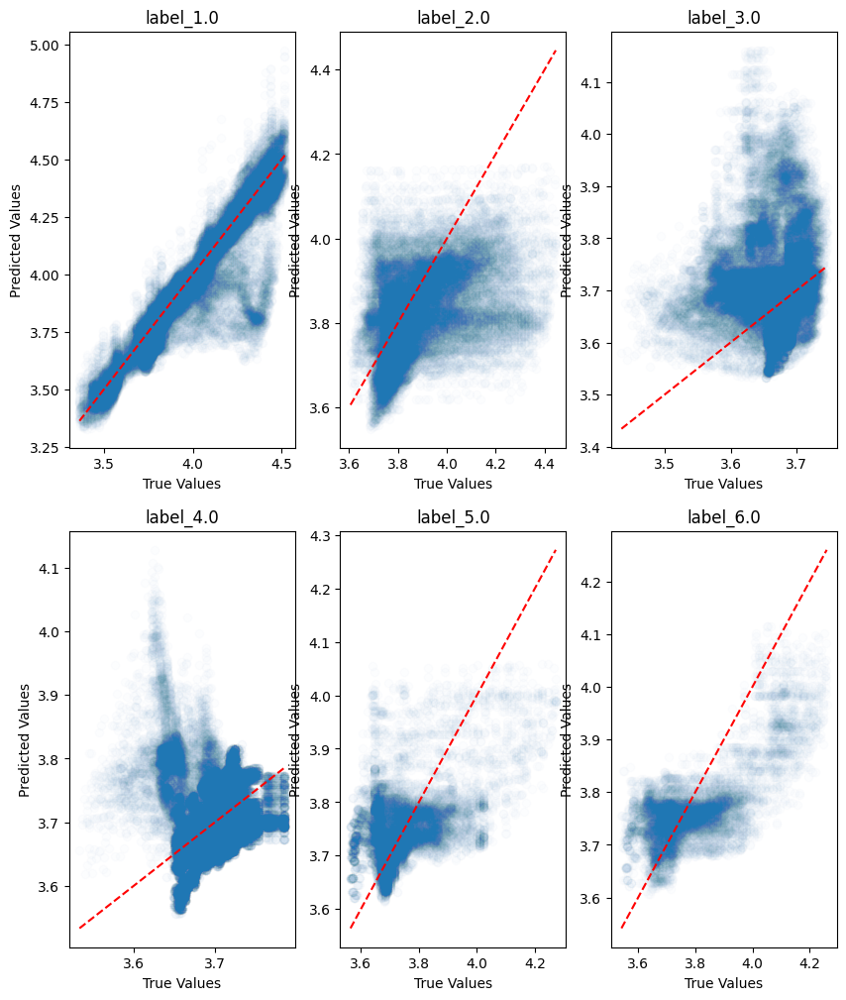

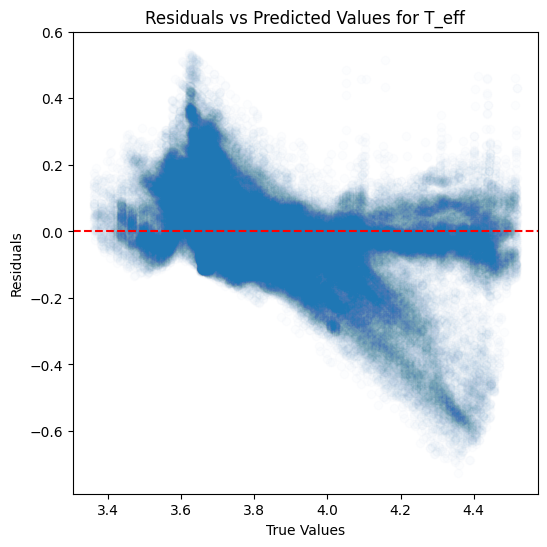

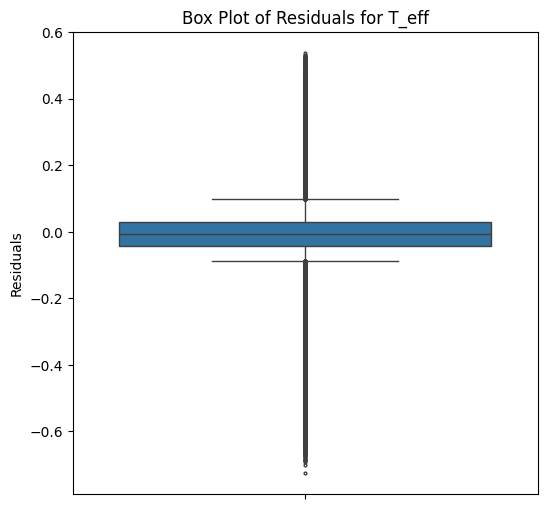

...

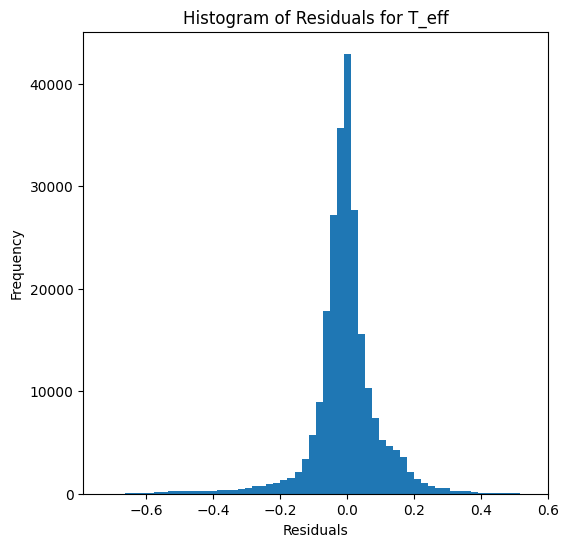

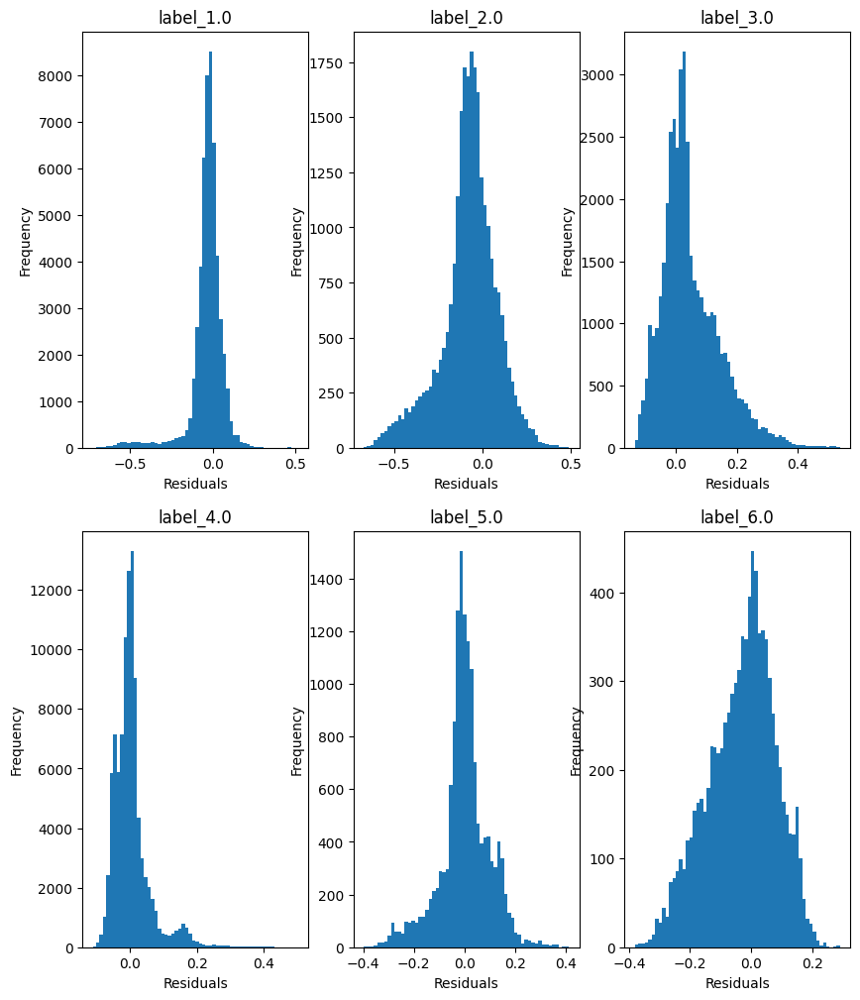

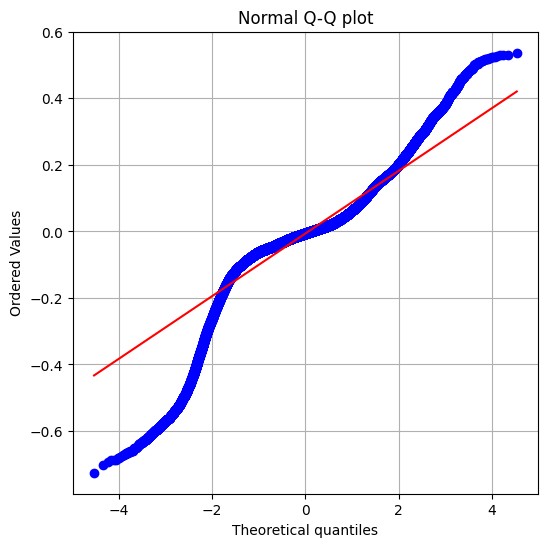

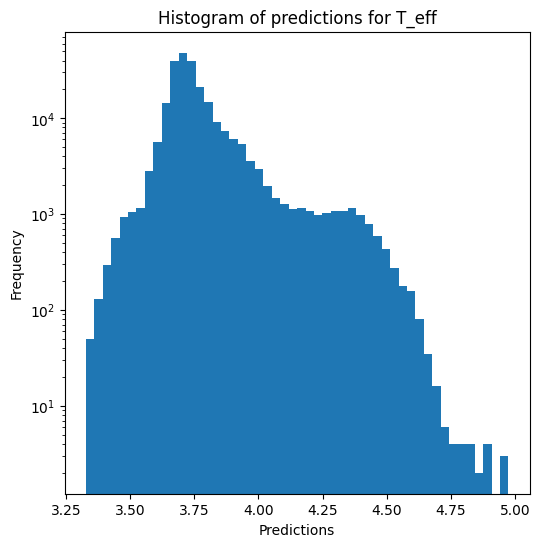

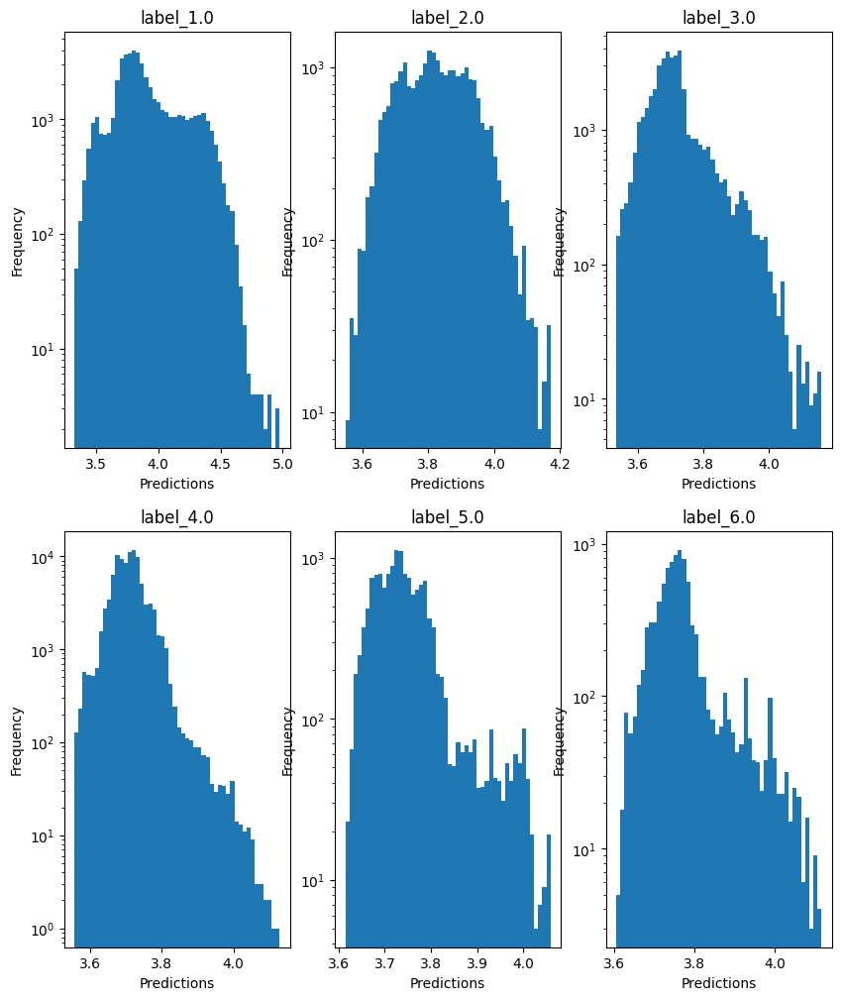

no negative values

log_g results for the label category with a value of 1.0
  value range :  3.233 - 5.345
  RVE :  -1.5021144633208494
  RMSE :  0.6029440770262731
  MAE :  0.30540957127512036
  MedAE :  0.05672955806708391
  CORR :  0.7148746483979497
  MAX_ER :  2.775537300519505
  Percentiles : 
    75th percentile :  0.1621575713714416
    90th percentile :  1.1537317074942357
    95th percentile :  1.5158925655292745
    99th percentile :  2.1203518620164545

log_g results for the label category with a value of 2.0
  value range :  0.638 - 4.299
  RVE :  0.15273707143059811
  RMSE :  0.8799383848547179
  MAE :  0.7007266201764394
  MedAE :  0.5824426076819857
  CORR :  0.5374215912902183
  MAX_ER :  2.6346893359464554
  Percentiles : 
    75th percentile :  1.1080517798854574
    90th percentile :  1.419114113601644
    95th percentile :  1.6279919637197522
    99th percentile :  2.169148147962175

log_g results for the label category with a value of 3.0
  value range :  -0.384 

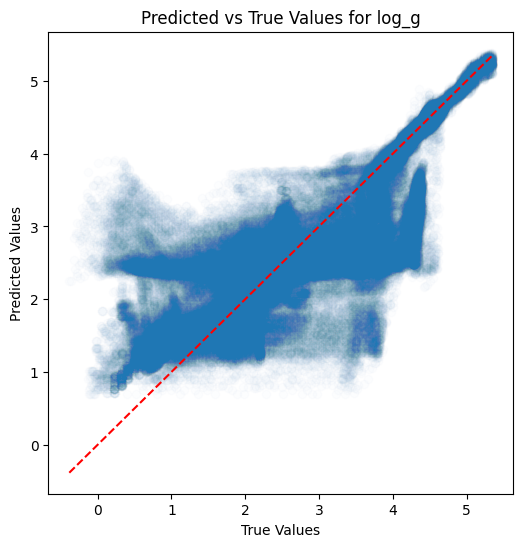

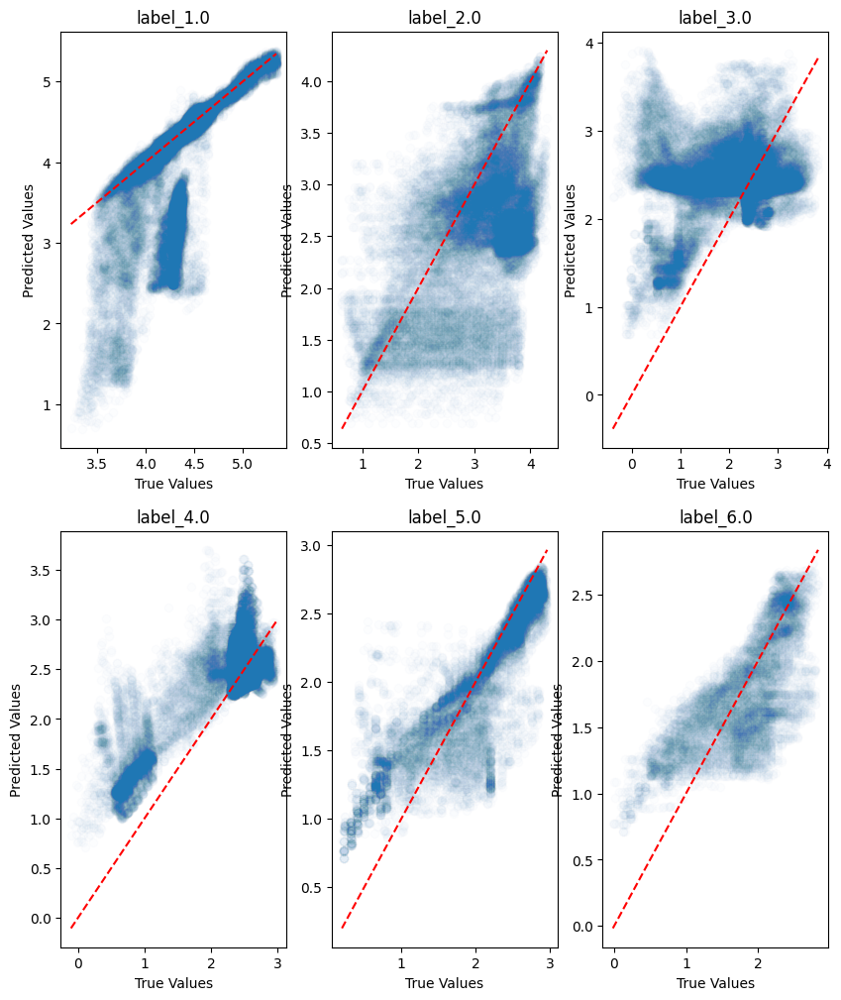

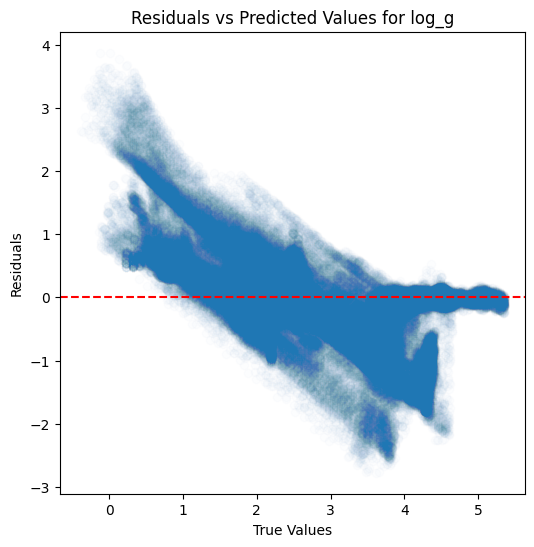

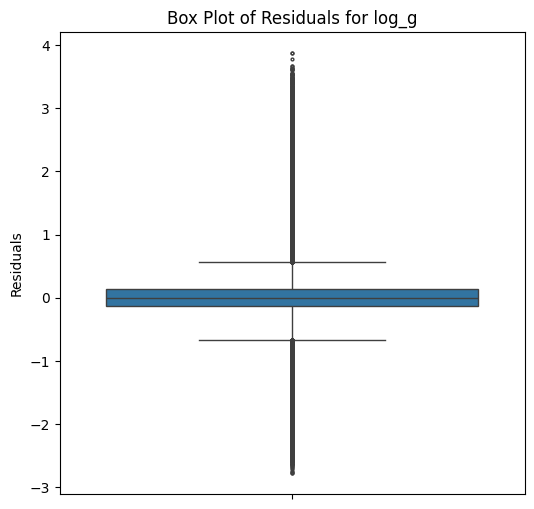

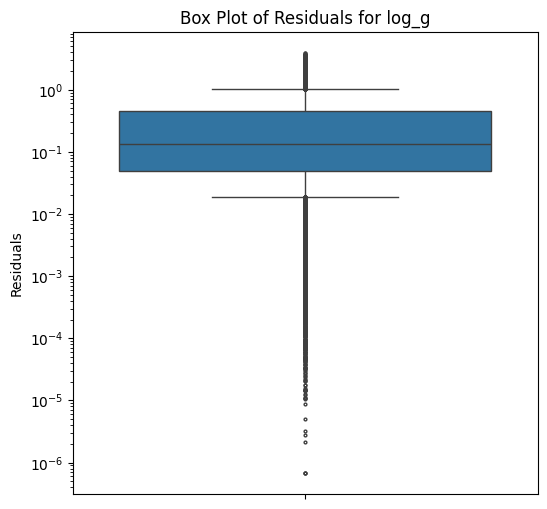

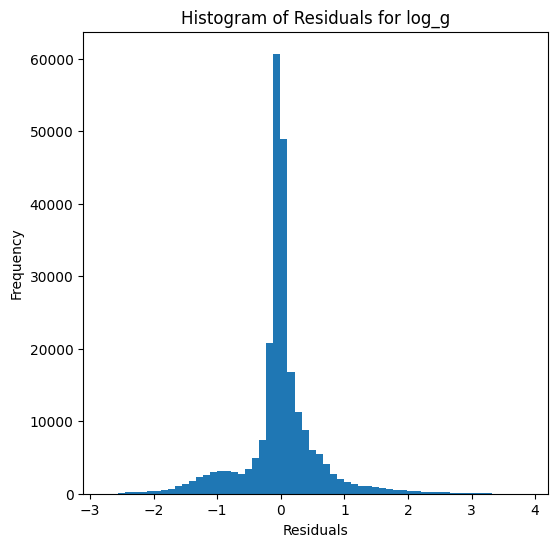

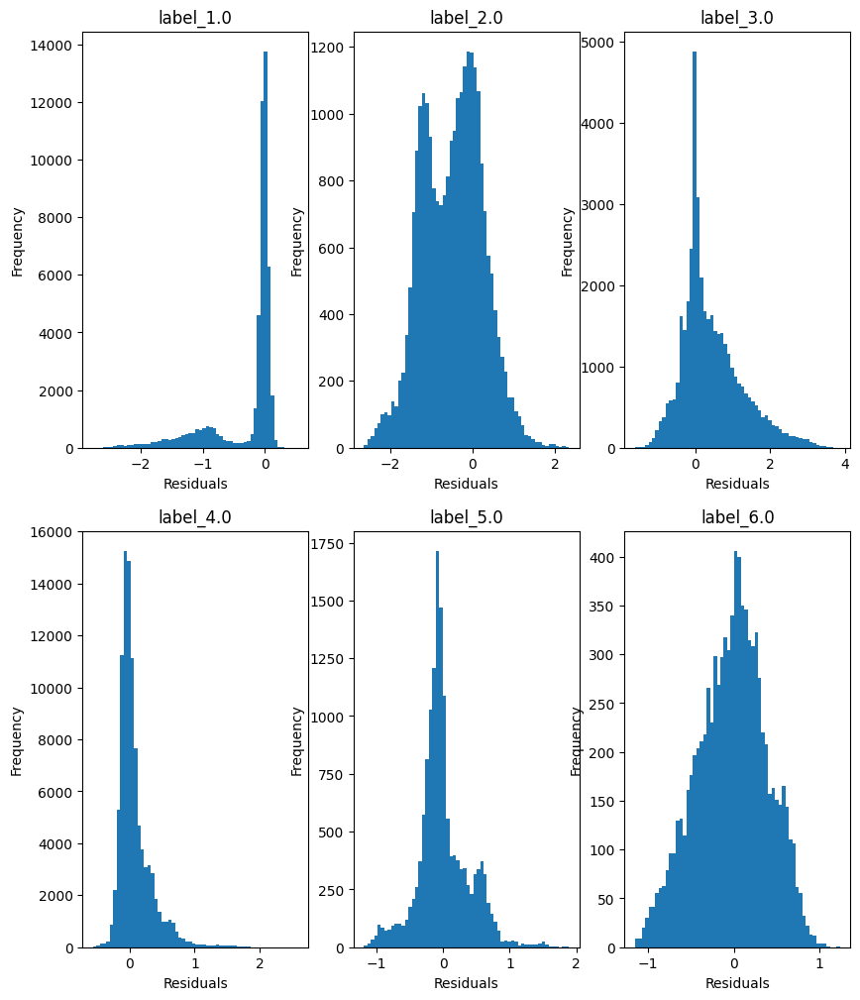

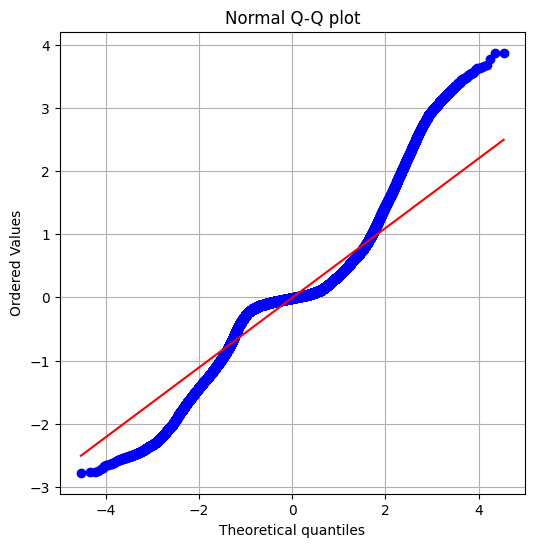

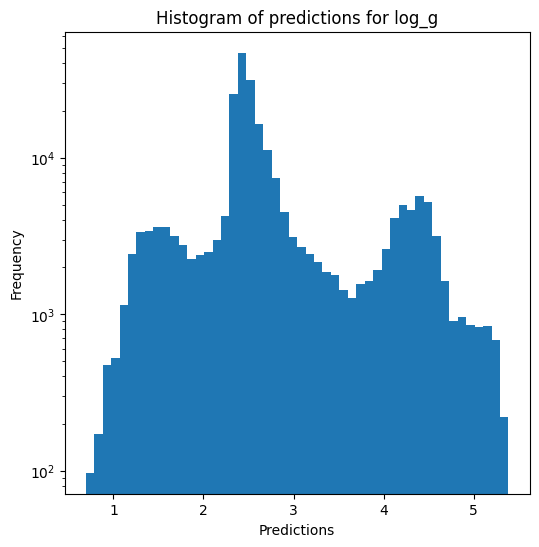

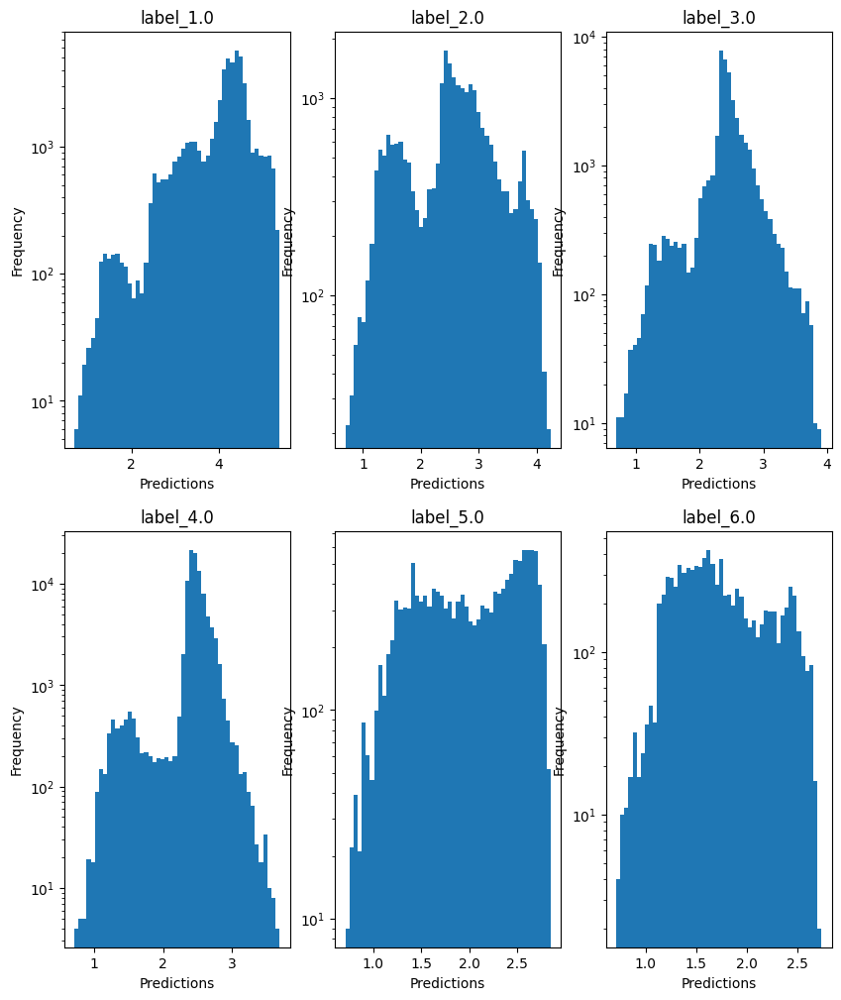


radius results for the label category with a value of 1.0
  value range :  -0.9763360818022064 - 1.1687920203141815
  RVE :  0.4709409868157749
  RMSE :  0.29842210443688155
  MAE :  0.15365473354486836
  MedAE :  0.033540452041336793
  CORR :  0.8409758815727522
  MAX_ER :  1.4010799951802944
  Percentiles : 
    75th percentile :  0.09334189998171091
    90th percentile :  0.5631568832596637
    95th percentile :  0.7470991621449903
    99th percentile :  1.0734149480420487

radius results for the label category with a value of 2.0
  value range :  0.0199466816788423 - 2.458486763798206
  RVE :  0.5242754082118648
  RMSE :  0.4436090382805059
  MAE :  0.35466607751848284
  MedAE :  0.2979116559607775
  CORR :  0.7434310228191625
  MAX_ER :  1.3670446669432819
  Percentiles : 
    75th percentile :  0.5579337187671385
    90th percentile :  0.7088894833986449
    95th percentile :  0.8158220122432188
    99th percentile :  1.094298960552248

radius results for the label category with

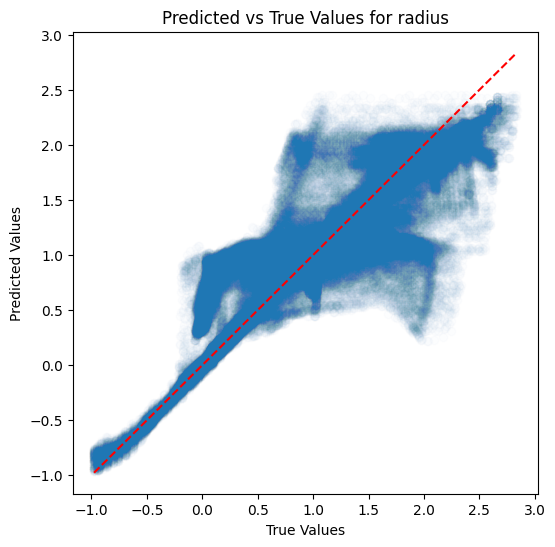

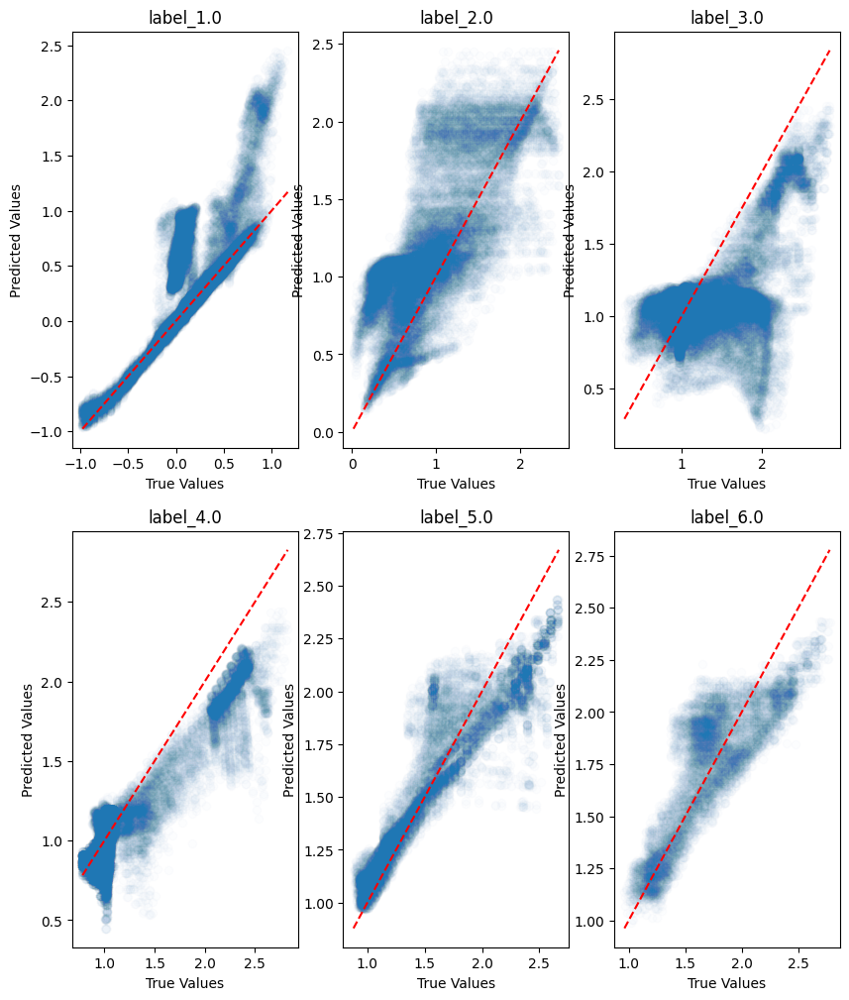

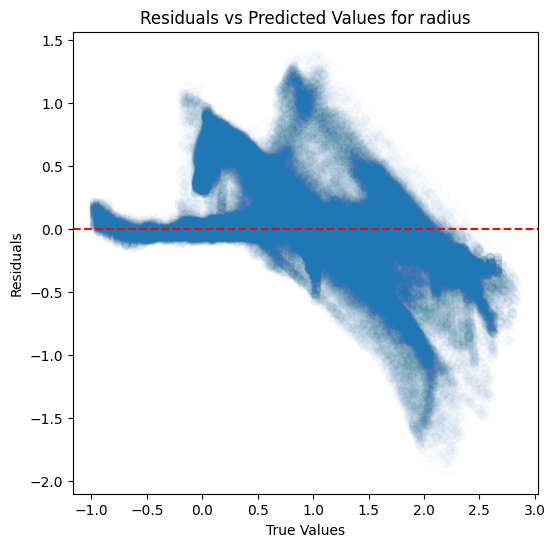

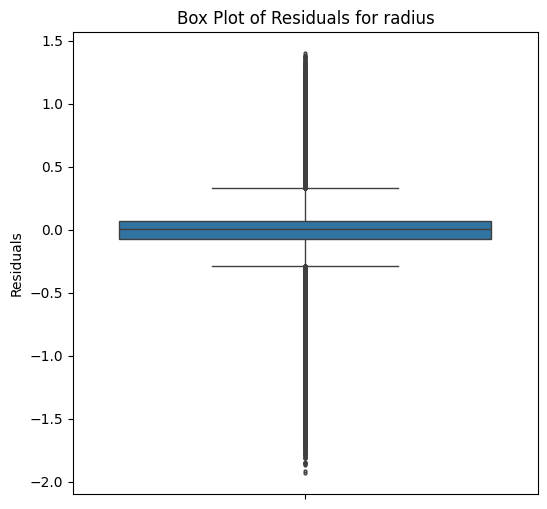

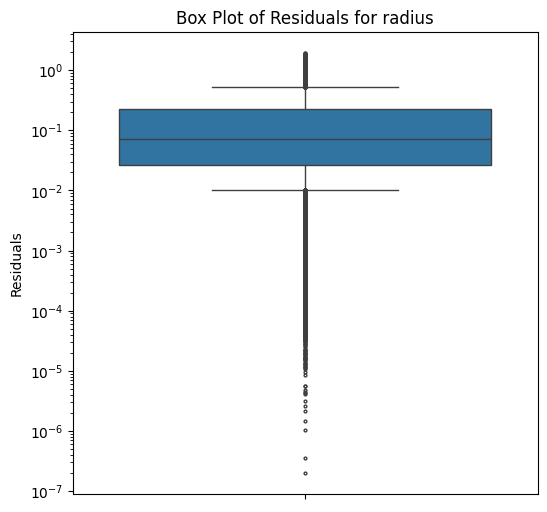

...

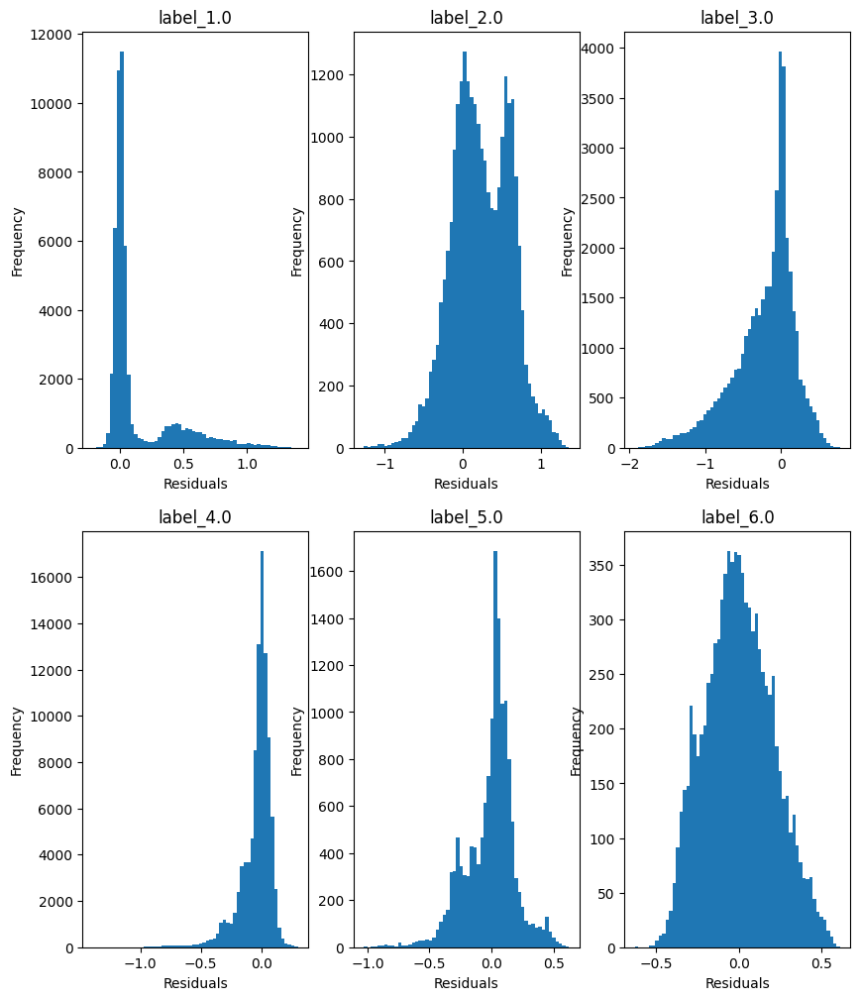

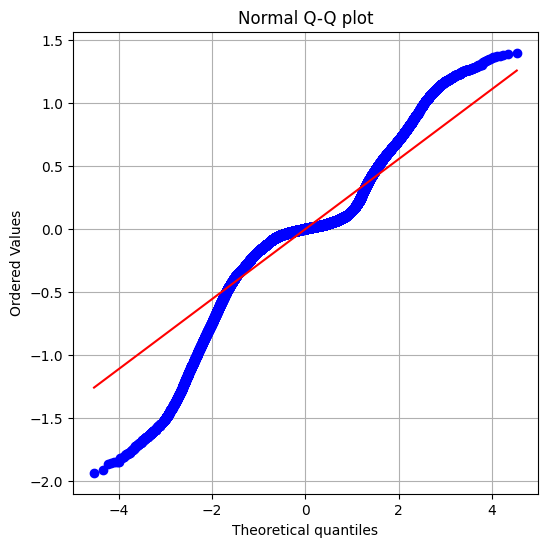

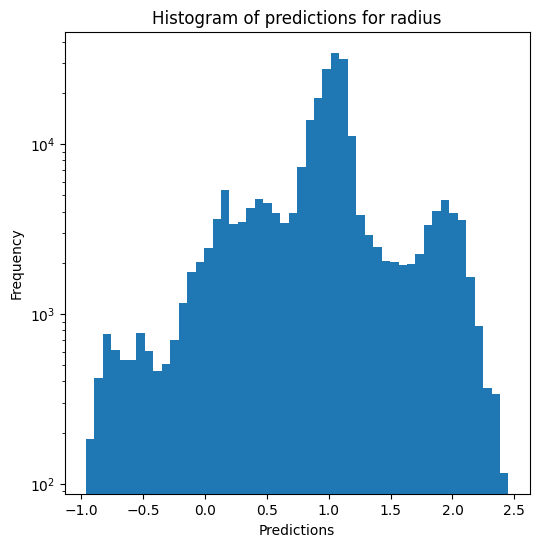

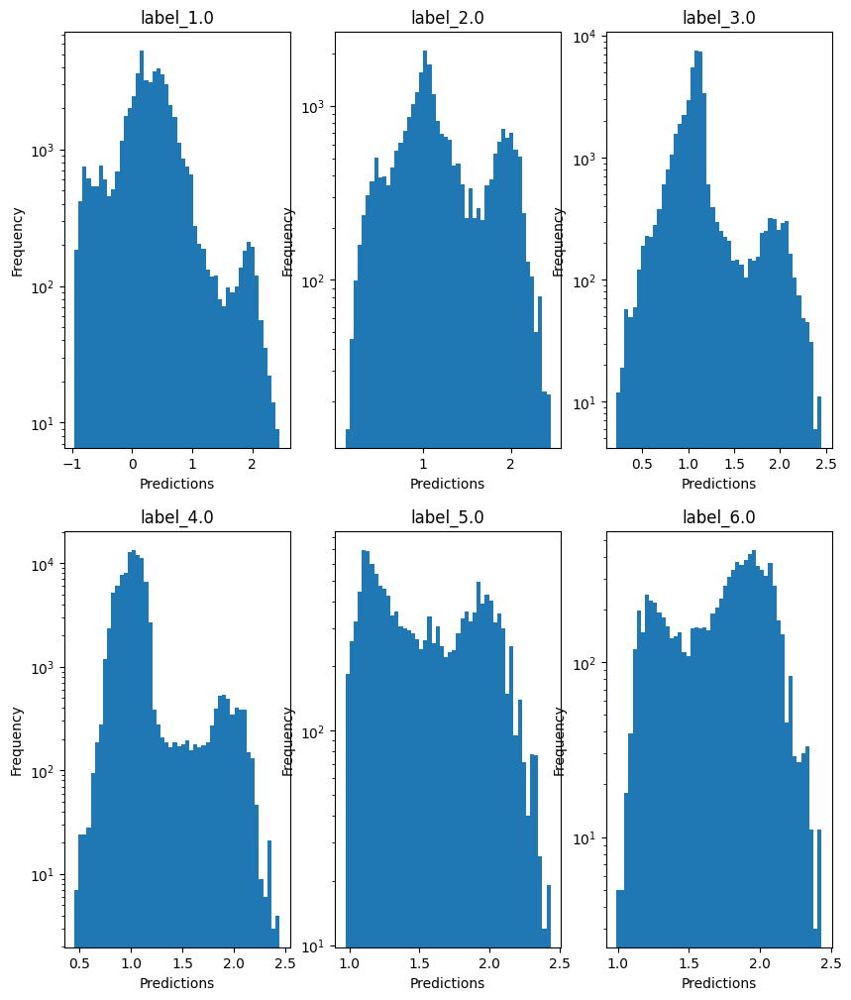

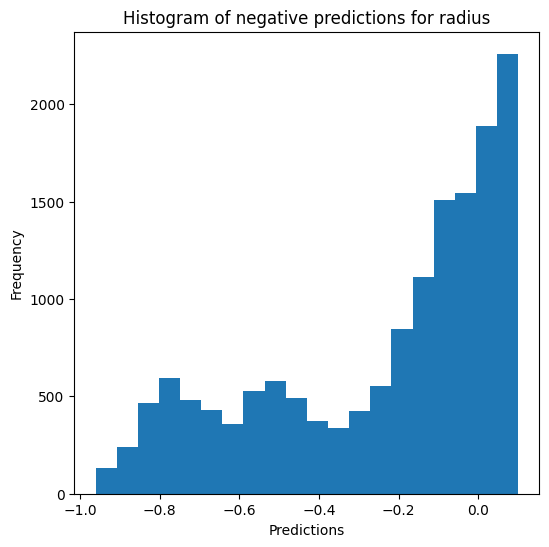

Saving predictions and results...


In [21]:
mlp_evaluator.evaluate_Kfold_results(MLPRegressor, X_train, y_train, categories_train, categories_name, path_to_predictions, tag, n_splits=5, random_state=12, override=override, use_preds=use_preds, save=save, show=show, scaler_name=scaler_name,
                                      hidden_layer_sizes = (100, 100, 100, 100), max_iter=20, batch_size=400)

Avec batch_size=auto (200):

plus de 30 minutes pour entrainer un seul split de Kfold avec les paramètres par défaut (1 hidden layer de taille 100)

plus de 15 minutes pour entrainer un seul split de Kfold avec les 1 hidden layer de taille 10

- et max_iter=20, hidden_layer_sizes=(100, 50, 25): ~5 minutes par fold (plutôt bon résultats)
- et max_iter=20, hidden_layer_sizes=(100, 100, 100): ~5 minutes par fold

Avec batch_size=400:


Avec learning_rate= :


hidden_layer_sizes = (100, 100), max_iter=20, batch_size=200 => 17 min pour 2 splits et min_loss de 2.1
RMSE = RVE :  0.984867927459382
RMSE :  2.5335132759292107
MAE :  0.7276983504493552
MedAE :  0.3034009994265745
CORR :  0.9927285673947535
MAX_ER :  169.74348568157313
Percentiles : 75th percentile :  0.5113604728134682 90th percentile :  1.1025928446049704 95th percentile :  2.1347654852226015 99th percentile :  9.897101952249908)

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=400 => 7 min pour 2 splits et min_loss de 2.2
RVE :  0.9797171492755655
RMSE :  2.983208723004754
MAE :  0.9125599339275378
MedAE :  0.43124518658659683
CORR :  0.9920536596906272
MAX_ER :  170.53076478793002
Percentiles : 75th percentile :  0.675744507049632 90th percentile :  1.2421052024331438 95th percentile :  2.441733387262636 99th percentile :  11.925724226452427

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=800 => 3 min pour 2 splits et min_loss de 2.3 et 2.7

hidden_layer_sizes = (100, 100), max_iter=20, batch_size=1600 => 3 min 30 pour 2 splits et min_loss de 7.8 et 3.8

=> batch_size plus grand == plus rapide mais moins bon